In [21]:
import torch
from torch import nn,optim
from torch.autograd.variable import Variable
from torchvision import transforms,datasets

In [22]:
from utils import Logger

In [23]:
def mnist_data():
    
    compose = transforms.Compose([transforms.ToTensor(),
                                 transforms.Normalize((0.5,0.5,0.5),(0.5,0.5,0.5)),
                                 ])
    out_dir = './dataset'
    return datasets.MNIST(root = out_dir,train = True,transform = compose,download =True)

# Load data
data = mnist_data()

#Creating dataloader with data so that we can iterate
data_loader = torch.utils.data.DataLoader(data,batch_size = 100,shuffle =True)

#number of batches
num_batches = len(data_loader)

In [24]:
class DiscriminatorNet(nn.Module):
    
    def __init__(self):
        super(DiscriminatorNet,self).__init__()
        n_features = 784
        n_out = 1
        
        self.hidden0 = nn.Sequential(nn.Linear(n_features,1024),
                                    nn.LeakyReLU(0.2),
                                    nn.Dropout(0.3)
                                    )
        
        self.hidden1 = nn.Sequential(nn.Linear(1024,512),
                                    nn.LeakyReLU(0.2),
                                    nn.Dropout(0.3),
                                    )
        
        self.hidden2 = nn.Sequential(nn.Linear(512,256),
                                    nn.LeakyReLU(0.2),
                                    nn.Dropout(0.3),
                                    )
        
        self.out = nn.Sequential(nn.Linear(256,n_out),
                                nn.Sigmoid()
                                )
        
    def forward(self,x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
    
discriminator = DiscriminatorNet()

In [25]:
def images_to_vectors(images):
    return images.view(images.size(0),784)

def vectors_to_images(vectors):
    return vectors.view(vectors.size(0),1,28,28)

In [26]:
class GeneratorNet(nn.Module):
    
    def __init__(self):
        super(GeneratorNet,self).__init__()
        n_features = 100
        n_out = 784
        
        self.hidden0 = nn.Sequential(nn.Linear(n_features,256),
                                    nn.LeakyReLU(0.2),
                                    )
        
        self.hidden1 = nn.Sequential(nn.Linear(256,512),
                                    nn.LeakyReLU(0.2),
                                    )
        
        self.hidden2 = nn.Sequential(nn.Linear(512,1024),
                                    nn.LeakyReLU(0.2),
                                    )
        
        self.out = nn.Sequential(nn.Linear(1024,n_out),
                                nn.Tanh()
                                )
        
    def forward(self,x):
        x = self.hidden0(x)
        x = self.hidden1(x)
        x = self.hidden2(x)
        x = self.out(x)
        return x
    
generator = GeneratorNet()

In [27]:
def noise(size):
    n = Variable(torch.randn(size,100))
    return n

In [28]:
d_optimizer = optim.Adam(discriminator.parameters(),lr = 0.0002)
g_optimizer = optim.Adam(generator.parameters(),lr = 0.0002)

In [29]:
loss = nn.BCELoss()

In [30]:
def ones_target(size):
    data = Variable(torch.ones(size,1))
    return data

def zeros_target(size):
    data = Variable(torch.zeros(size,1))
    return data

In [31]:
def train_discriminator(optimizer,real_data,fake_data):
    
    N = real_data.size(0)
    
    #Resetting gradients
    optimizer.zero_grad()
    
    #Training on real data
    prediction_real = discriminator(real_data)
    #Calculate error and backpropagation
    error_real = loss(prediction_real,ones_target(N))
    error_real.backward()
    
    #Training on fake data
    prediction_fake = discriminator(fake_data)
    #Calculate error and backpropagation
    error_fake = loss(prediction_fake,zeros_target(N))
    error_fake.backward()
    
    #Update weights with gradients
    optimizer.step()
    
    # Return error and prediction for real and fake inputs
    return error_real + error_fake,prediction_real,prediction_fake

In [35]:
def train_generator(optimizer,fake_data):
    
    N = fake_data.size(0)
    
    #Resetting gradients
    optimizer.zero_grad()
    
    # Noise generation
    prediction = discriminator(fake_data)
    
    # Calculating error and backpropagation
    error = loss(prediction,ones_target(N))
    error.backward()
    
    # Update weights with gradients
    optimizer.step()
    
    return error

In [40]:
num_test_samples = 16
test_noise = noise(num_test_exanples)

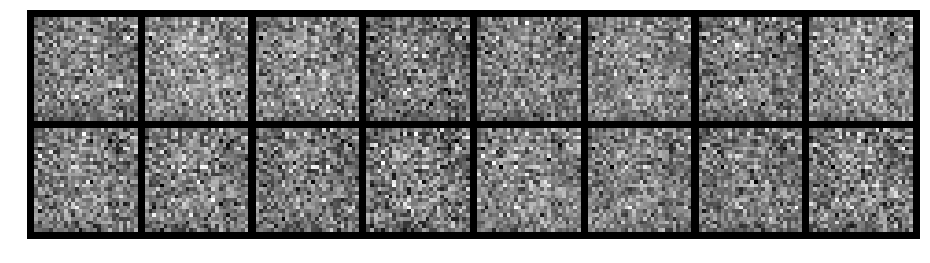

Epoch: [0/200], Batch Num: [0/600]
Discriminator Loss: 1.0157, Generator Loss: 0.6499
D(x): 0.7555, D(G(z)): 0.5203


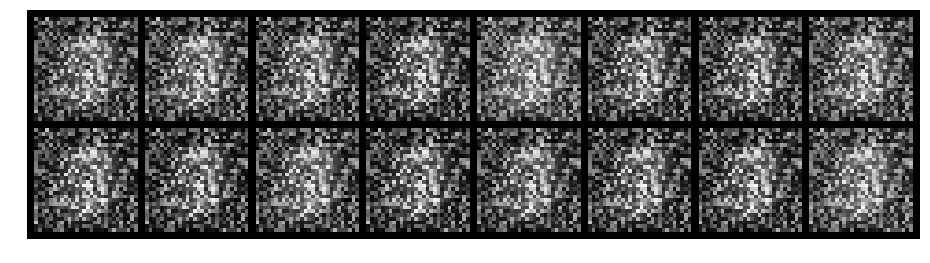

Epoch: [0/200], Batch Num: [100/600]
Discriminator Loss: 0.9154, Generator Loss: 1.8110
D(x): 0.7899, D(G(z)): 0.3985


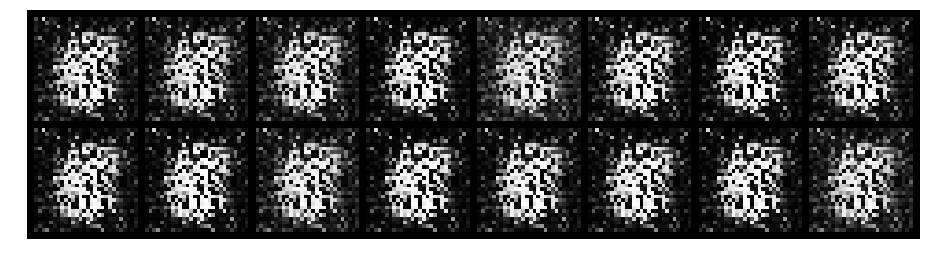

Epoch: [0/200], Batch Num: [200/600]
Discriminator Loss: 0.1573, Generator Loss: 4.5377
D(x): 0.9683, D(G(z)): 0.1042


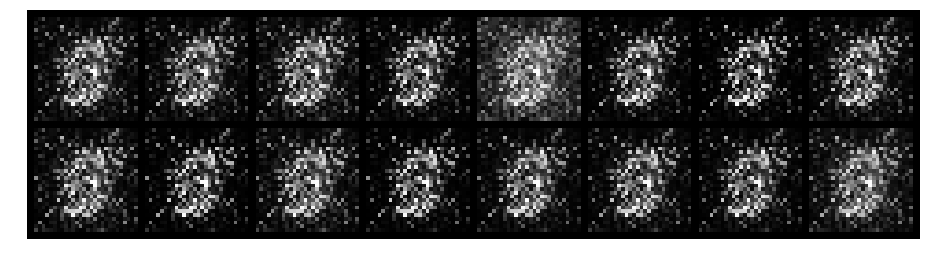

Epoch: [0/200], Batch Num: [300/600]
Discriminator Loss: 0.3665, Generator Loss: 3.7959
D(x): 0.8889, D(G(z)): 0.1901


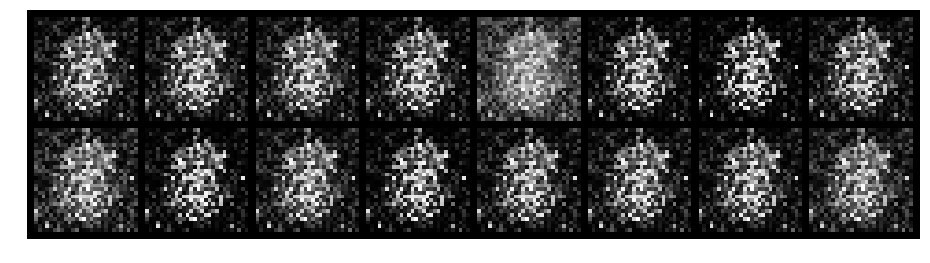

Epoch: [0/200], Batch Num: [400/600]
Discriminator Loss: 0.7495, Generator Loss: 2.8117
D(x): 0.7421, D(G(z)): 0.2732


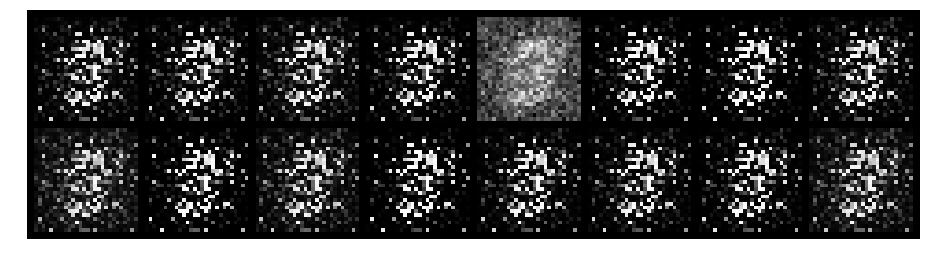

Epoch: [0/200], Batch Num: [500/600]
Discriminator Loss: 0.1405, Generator Loss: 5.2972
D(x): 0.9464, D(G(z)): 0.0653


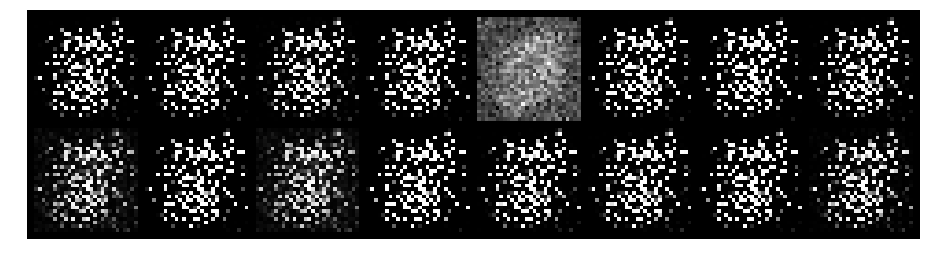

Epoch: [1/200], Batch Num: [0/600]
Discriminator Loss: 0.3519, Generator Loss: 6.0657
D(x): 0.8772, D(G(z)): 0.0924


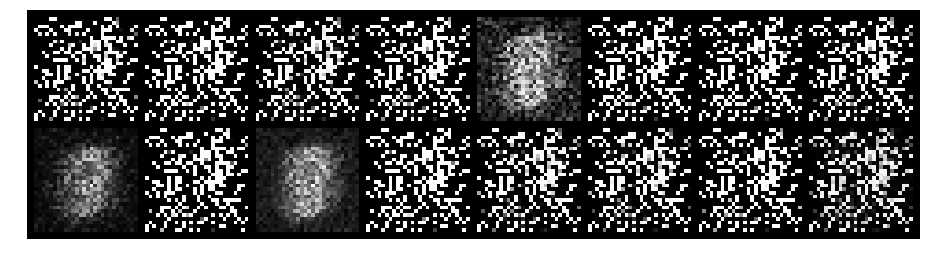

Epoch: [1/200], Batch Num: [100/600]
Discriminator Loss: 0.4724, Generator Loss: 8.7345
D(x): 0.9017, D(G(z)): 0.2033


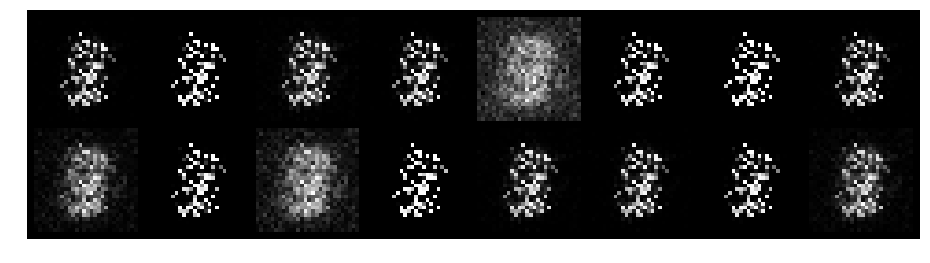

Epoch: [1/200], Batch Num: [200/600]
Discriminator Loss: 0.7989, Generator Loss: 3.7895
D(x): 0.7354, D(G(z)): 0.1818


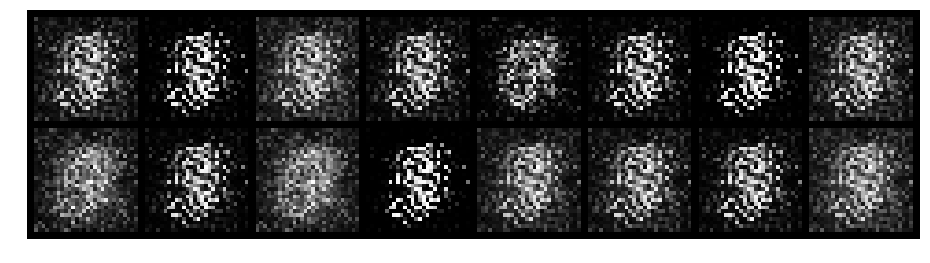

Epoch: [1/200], Batch Num: [300/600]
Discriminator Loss: 0.6462, Generator Loss: 4.7613
D(x): 0.8063, D(G(z)): 0.1767


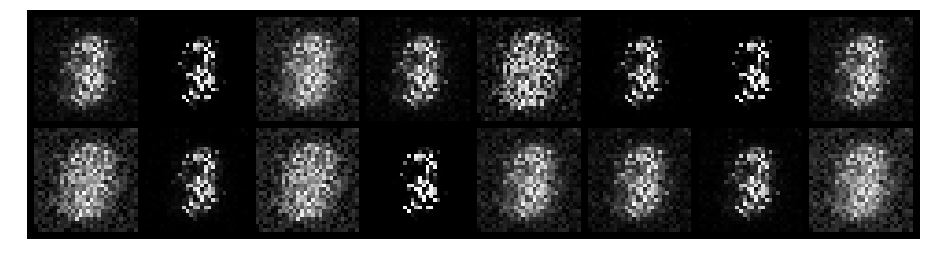

Epoch: [1/200], Batch Num: [400/600]
Discriminator Loss: 0.4664, Generator Loss: 2.7745
D(x): 0.8213, D(G(z)): 0.1948


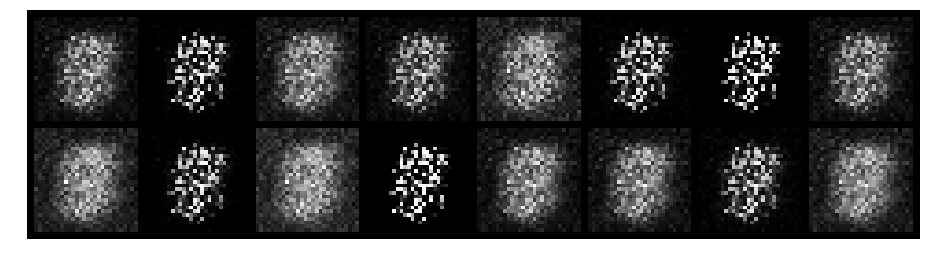

Epoch: [1/200], Batch Num: [500/600]
Discriminator Loss: 0.7269, Generator Loss: 4.0560
D(x): 0.7623, D(G(z)): 0.2241


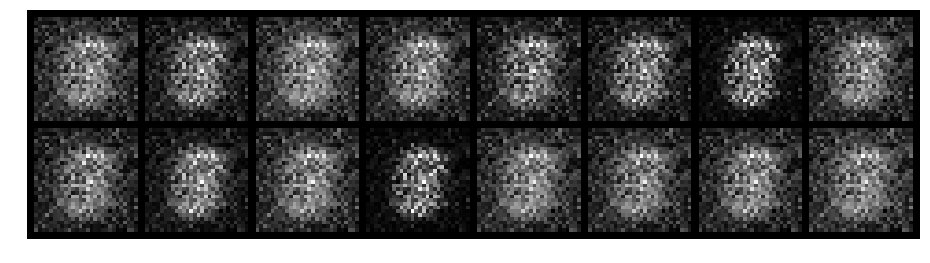

Epoch: [2/200], Batch Num: [0/600]
Discriminator Loss: 0.6493, Generator Loss: 3.5218
D(x): 0.8710, D(G(z)): 0.2799


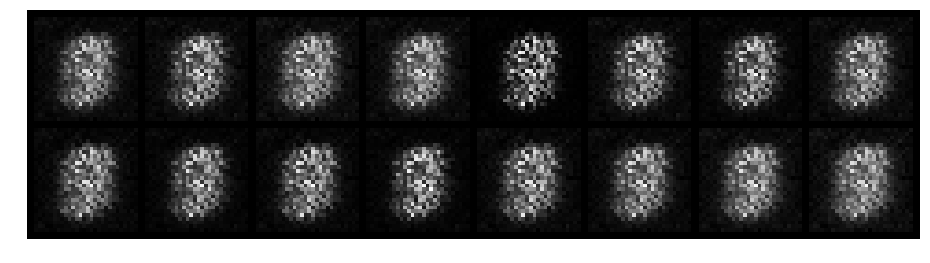

Epoch: [2/200], Batch Num: [100/600]
Discriminator Loss: 0.5344, Generator Loss: 3.3321
D(x): 0.7876, D(G(z)): 0.1781


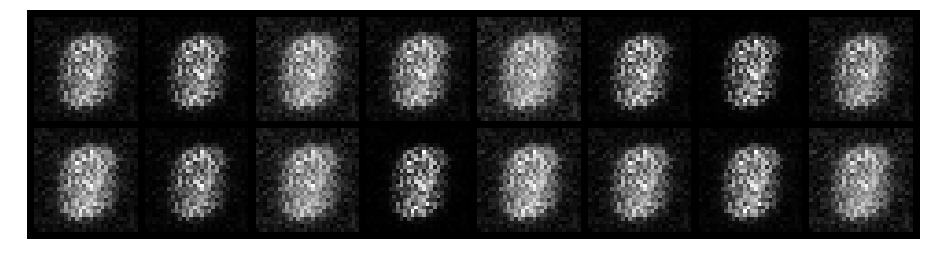

Epoch: [2/200], Batch Num: [200/600]
Discriminator Loss: 1.5297, Generator Loss: 0.7262
D(x): 0.6153, D(G(z)): 0.5245


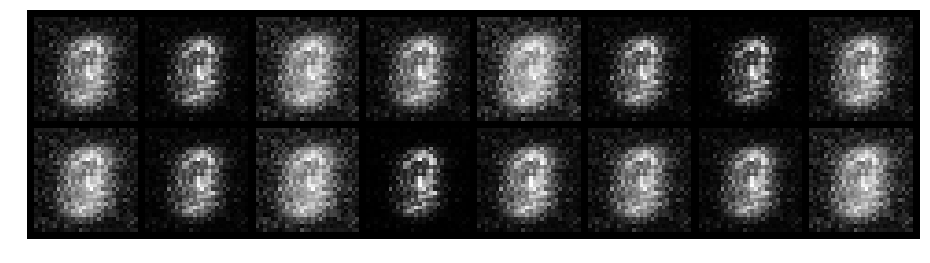

Epoch: [2/200], Batch Num: [300/600]
Discriminator Loss: 1.5136, Generator Loss: 0.9301
D(x): 0.5803, D(G(z)): 0.4421


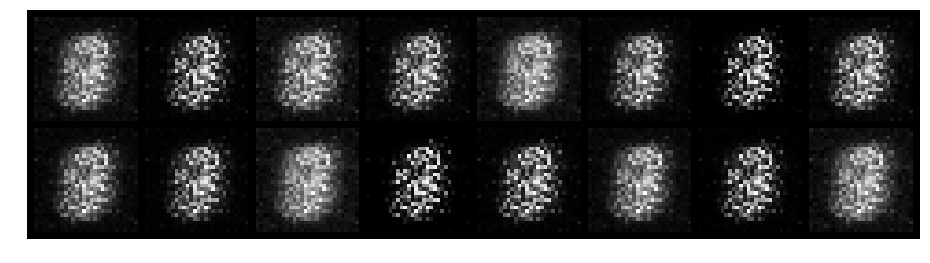

Epoch: [2/200], Batch Num: [400/600]
Discriminator Loss: 0.6229, Generator Loss: 3.6456
D(x): 0.7709, D(G(z)): 0.1339


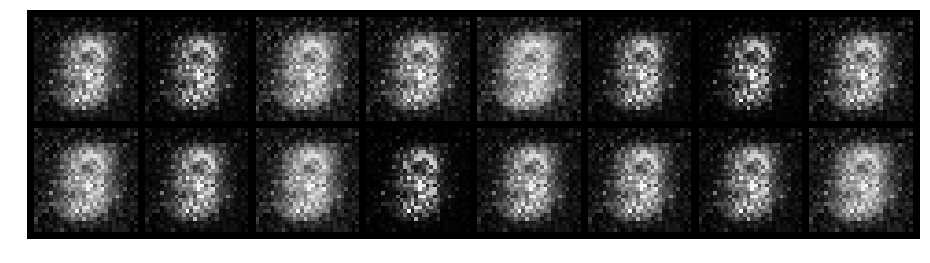

Epoch: [2/200], Batch Num: [500/600]
Discriminator Loss: 1.3343, Generator Loss: 2.2429
D(x): 0.6684, D(G(z)): 0.3711


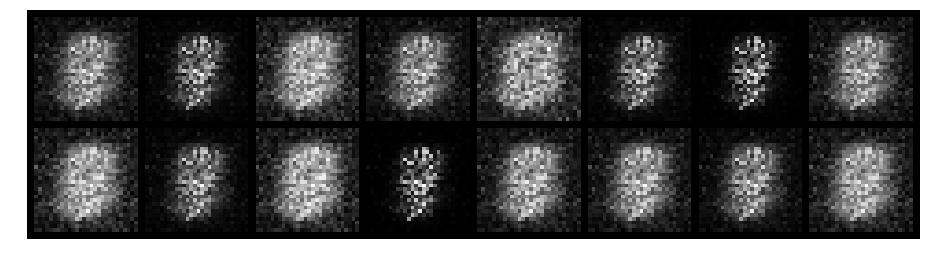

Epoch: [3/200], Batch Num: [0/600]
Discriminator Loss: 0.6447, Generator Loss: 2.6616
D(x): 0.8325, D(G(z)): 0.2410


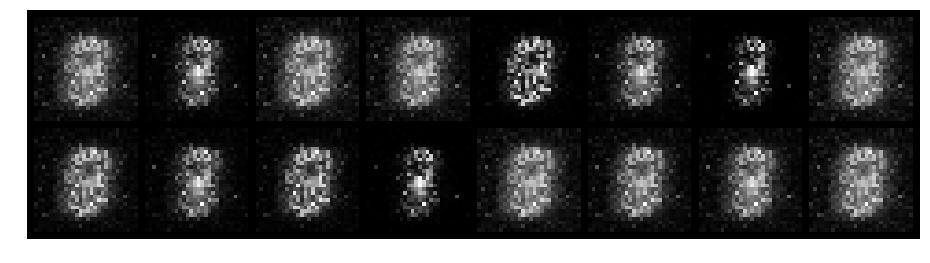

Epoch: [3/200], Batch Num: [100/600]
Discriminator Loss: 0.5722, Generator Loss: 4.2460
D(x): 0.8104, D(G(z)): 0.0877


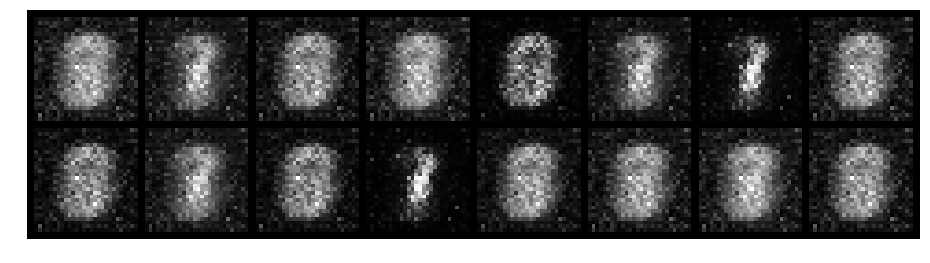

Epoch: [3/200], Batch Num: [200/600]
Discriminator Loss: 0.5778, Generator Loss: 3.2082
D(x): 0.8489, D(G(z)): 0.0947


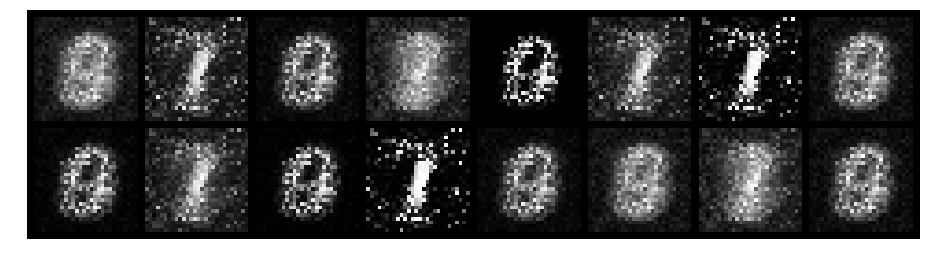

Epoch: [3/200], Batch Num: [300/600]
Discriminator Loss: 0.3985, Generator Loss: 3.3745
D(x): 0.8854, D(G(z)): 0.1573


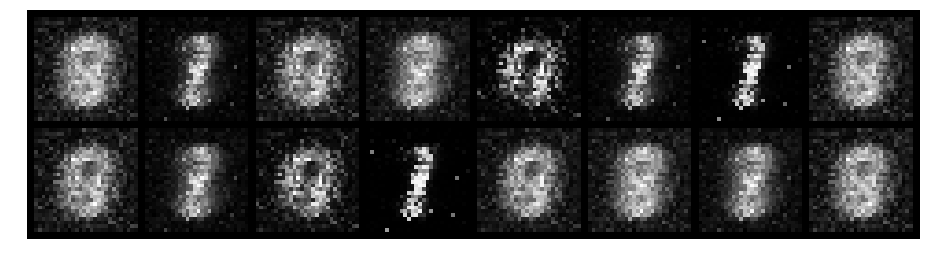

Epoch: [3/200], Batch Num: [400/600]
Discriminator Loss: 0.1119, Generator Loss: 5.4619
D(x): 0.9589, D(G(z)): 0.0425


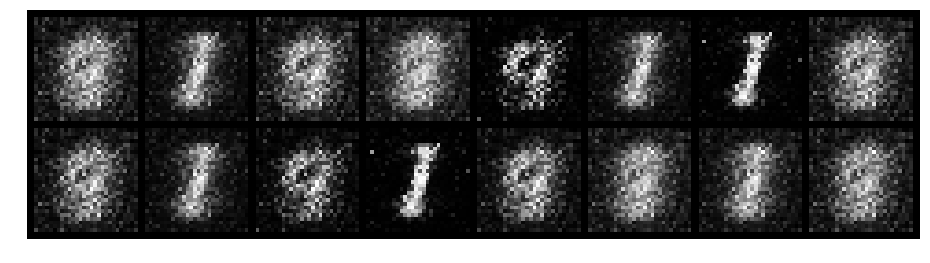

Epoch: [3/200], Batch Num: [500/600]
Discriminator Loss: 0.1436, Generator Loss: 3.5166
D(x): 0.9672, D(G(z)): 0.0879


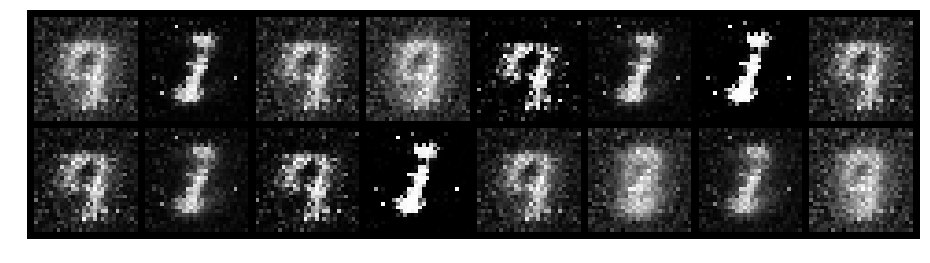

Epoch: [4/200], Batch Num: [0/600]
Discriminator Loss: 0.3522, Generator Loss: 3.7005
D(x): 0.9239, D(G(z)): 0.1126


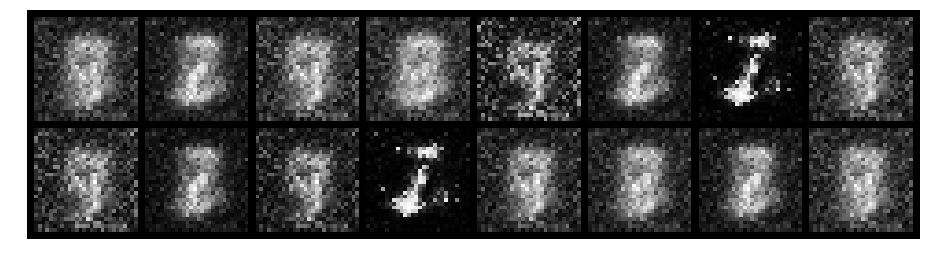

Epoch: [4/200], Batch Num: [100/600]
Discriminator Loss: 0.3975, Generator Loss: 4.9192
D(x): 0.8929, D(G(z)): 0.0513


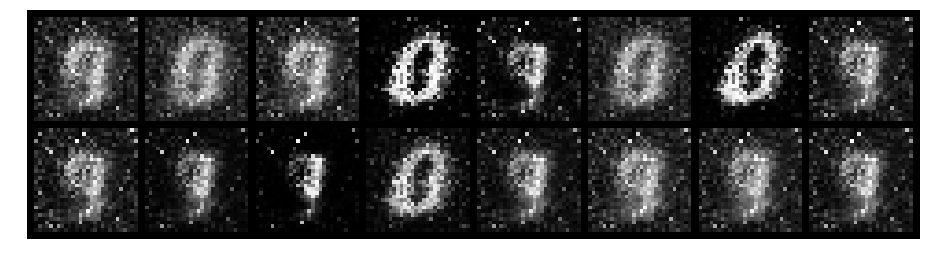

Epoch: [4/200], Batch Num: [200/600]
Discriminator Loss: 0.3645, Generator Loss: 4.1884
D(x): 0.8691, D(G(z)): 0.0410


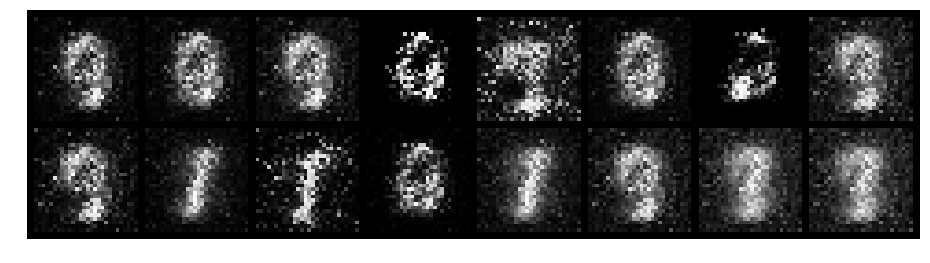

Epoch: [4/200], Batch Num: [300/600]
Discriminator Loss: 0.3149, Generator Loss: 3.5406
D(x): 0.8843, D(G(z)): 0.0950


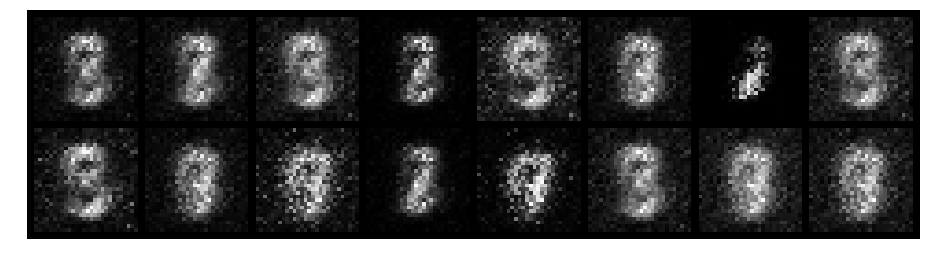

Epoch: [4/200], Batch Num: [400/600]
Discriminator Loss: 0.5546, Generator Loss: 2.8177
D(x): 0.8355, D(G(z)): 0.1683


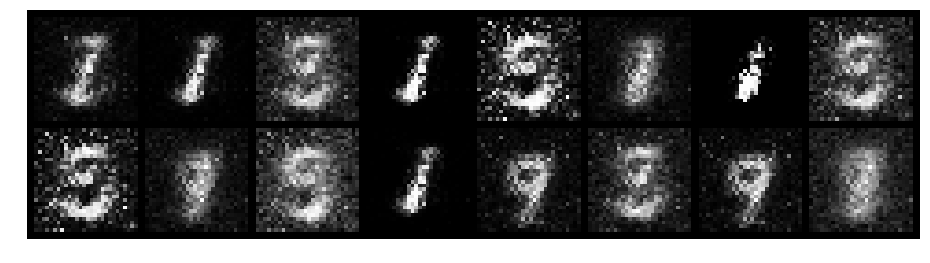

Epoch: [4/200], Batch Num: [500/600]
Discriminator Loss: 0.8017, Generator Loss: 3.1048
D(x): 0.7725, D(G(z)): 0.1886


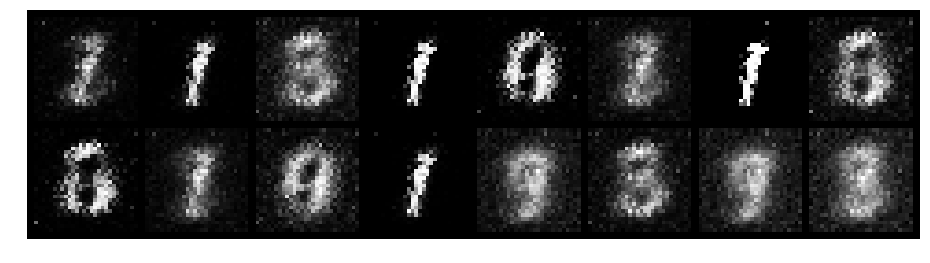

Epoch: [5/200], Batch Num: [0/600]
Discriminator Loss: 0.7791, Generator Loss: 1.8658
D(x): 0.8266, D(G(z)): 0.2982


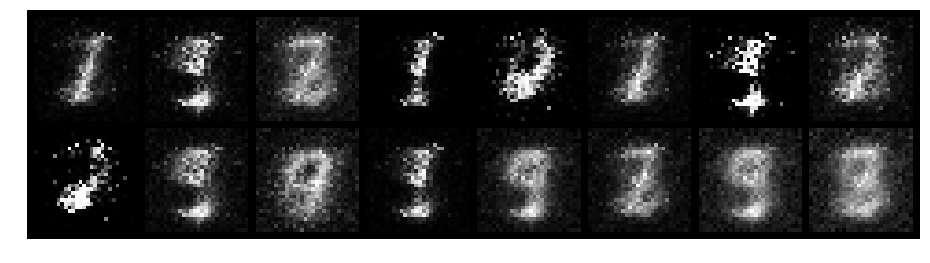

Epoch: [5/200], Batch Num: [100/600]
Discriminator Loss: 0.2913, Generator Loss: 3.8905
D(x): 0.8678, D(G(z)): 0.0491


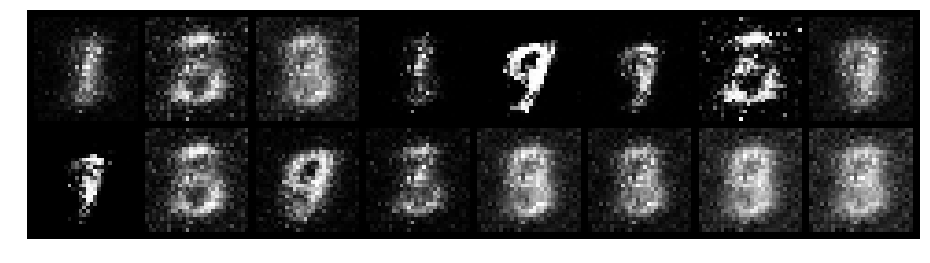

Epoch: [5/200], Batch Num: [200/600]
Discriminator Loss: 0.2166, Generator Loss: 4.4324
D(x): 0.9441, D(G(z)): 0.0777


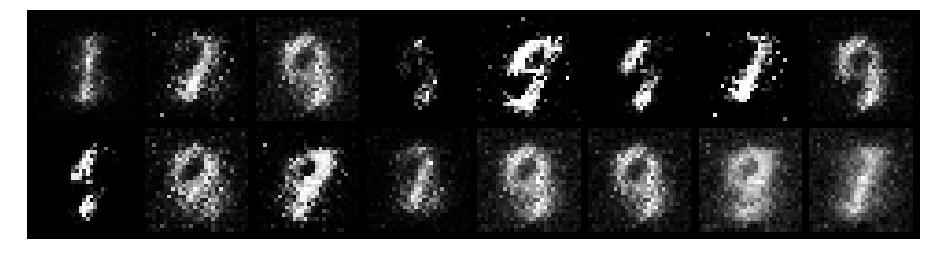

Epoch: [5/200], Batch Num: [300/600]
Discriminator Loss: 0.7277, Generator Loss: 2.4752
D(x): 0.7167, D(G(z)): 0.1117


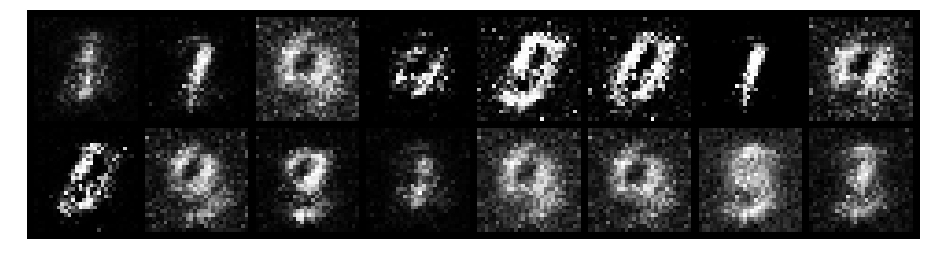

Epoch: [5/200], Batch Num: [400/600]
Discriminator Loss: 0.5863, Generator Loss: 2.9470
D(x): 0.8304, D(G(z)): 0.2214


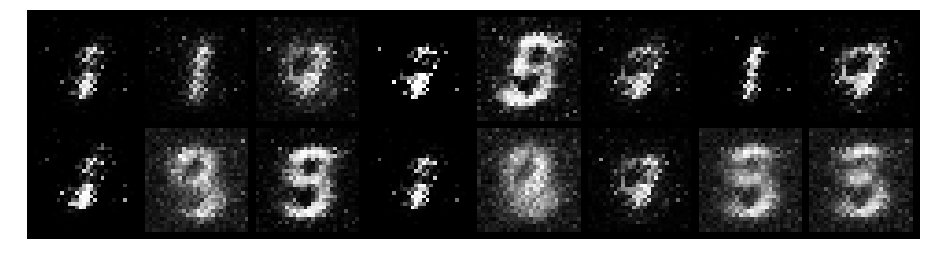

Epoch: [5/200], Batch Num: [500/600]
Discriminator Loss: 0.5195, Generator Loss: 3.8304
D(x): 0.8514, D(G(z)): 0.1321


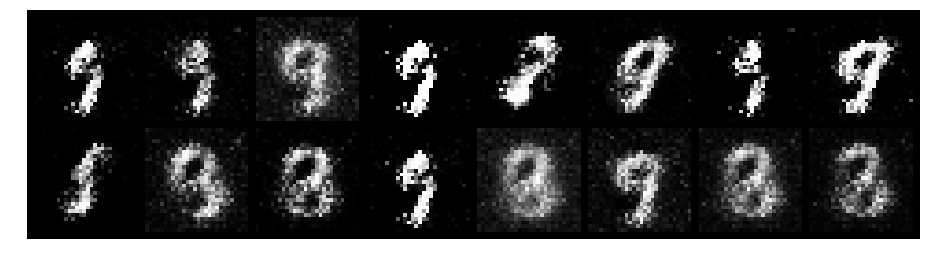

Epoch: [6/200], Batch Num: [0/600]
Discriminator Loss: 0.3559, Generator Loss: 3.8412
D(x): 0.9074, D(G(z)): 0.1543


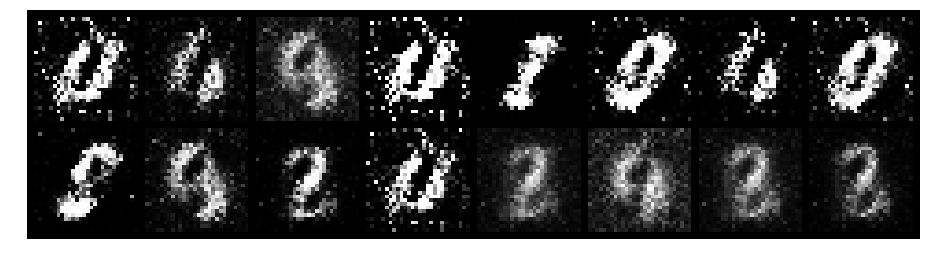

Epoch: [6/200], Batch Num: [100/600]
Discriminator Loss: 0.4138, Generator Loss: 3.8821
D(x): 0.8148, D(G(z)): 0.0731


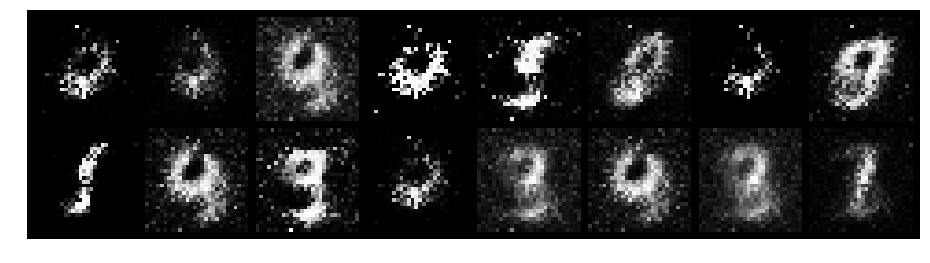

Epoch: [6/200], Batch Num: [200/600]
Discriminator Loss: 0.2991, Generator Loss: 3.3343
D(x): 0.8998, D(G(z)): 0.0631


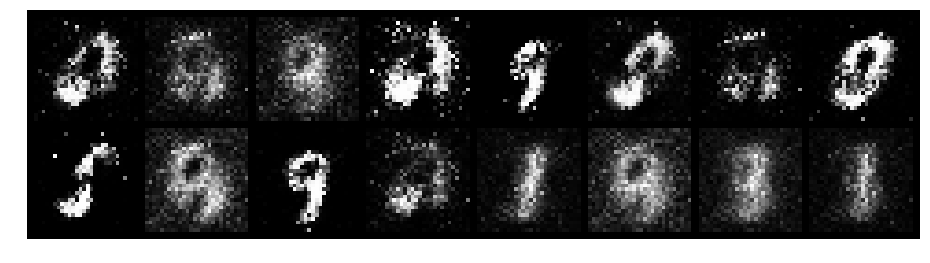

Epoch: [6/200], Batch Num: [300/600]
Discriminator Loss: 0.3885, Generator Loss: 3.2896
D(x): 0.9439, D(G(z)): 0.1982


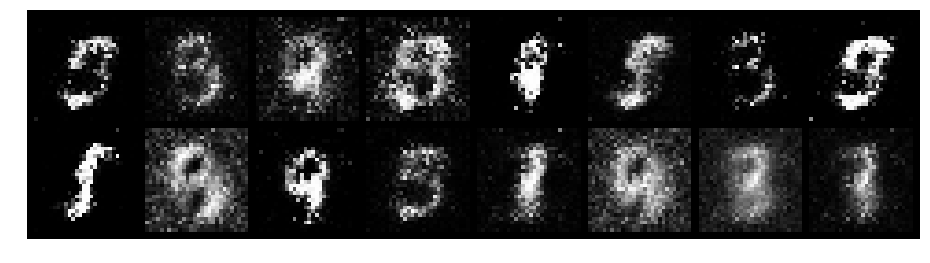

Epoch: [6/200], Batch Num: [400/600]
Discriminator Loss: 0.2131, Generator Loss: 3.4893
D(x): 0.9470, D(G(z)): 0.0816


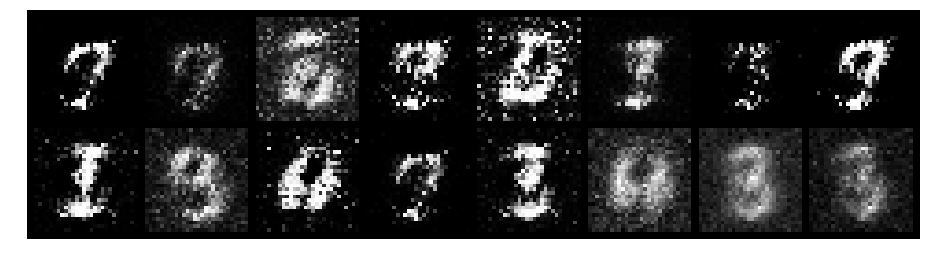

Epoch: [6/200], Batch Num: [500/600]
Discriminator Loss: 0.4695, Generator Loss: 3.0546
D(x): 0.9061, D(G(z)): 0.2131


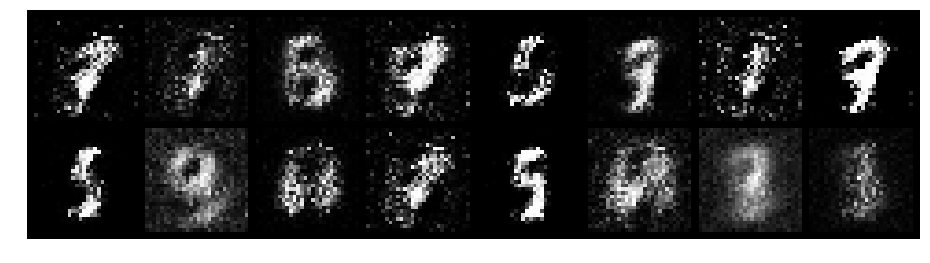

Epoch: [7/200], Batch Num: [0/600]
Discriminator Loss: 0.3539, Generator Loss: 3.6197
D(x): 0.8965, D(G(z)): 0.0987


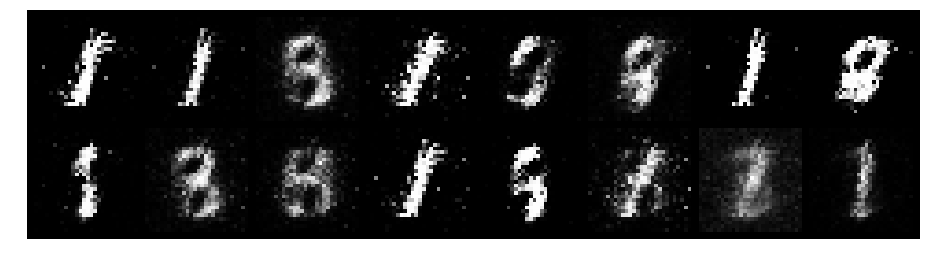

Epoch: [7/200], Batch Num: [100/600]
Discriminator Loss: 0.4382, Generator Loss: 2.8535
D(x): 0.8427, D(G(z)): 0.1272


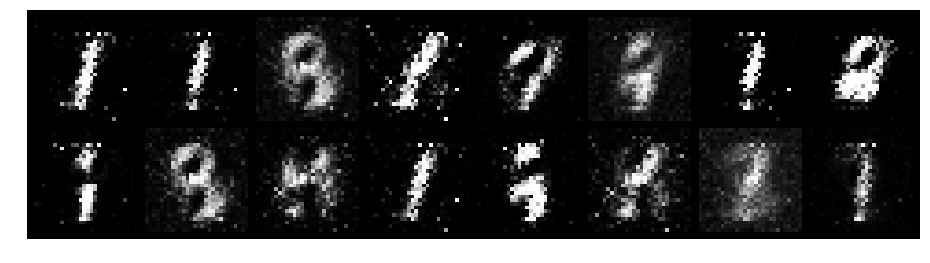

Epoch: [7/200], Batch Num: [200/600]
Discriminator Loss: 0.1721, Generator Loss: 3.9975
D(x): 0.9684, D(G(z)): 0.0831


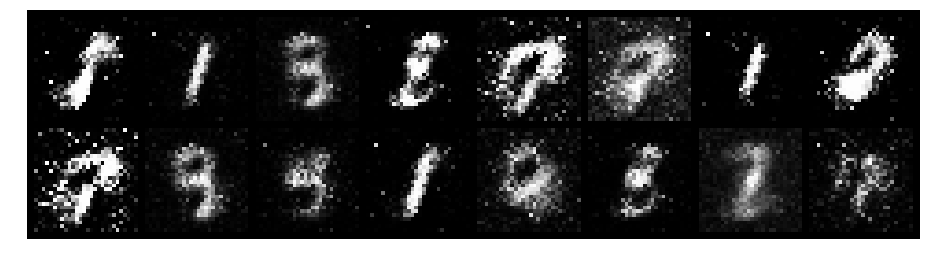

Epoch: [7/200], Batch Num: [300/600]
Discriminator Loss: 0.5286, Generator Loss: 2.0523
D(x): 0.8547, D(G(z)): 0.1661


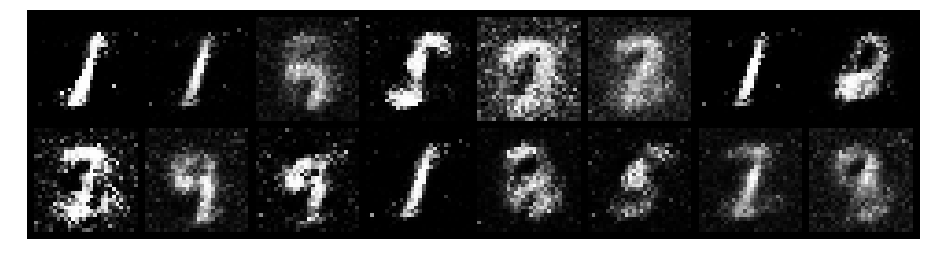

Epoch: [7/200], Batch Num: [400/600]
Discriminator Loss: 0.6484, Generator Loss: 4.3015
D(x): 0.8438, D(G(z)): 0.1985


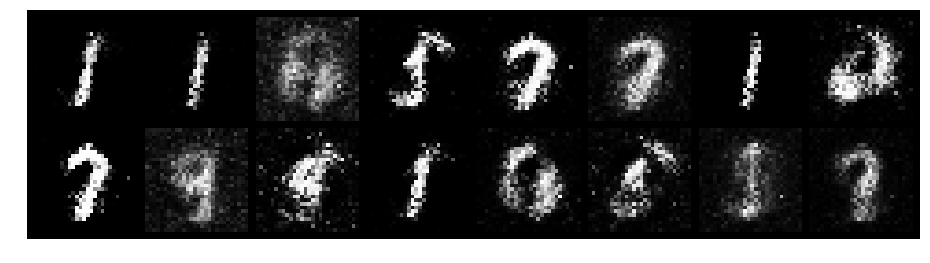

Epoch: [7/200], Batch Num: [500/600]
Discriminator Loss: 0.2996, Generator Loss: 4.2072
D(x): 0.8796, D(G(z)): 0.0578


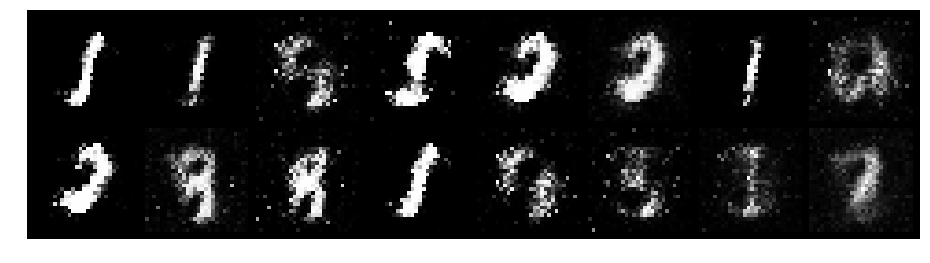

Epoch: [8/200], Batch Num: [0/600]
Discriminator Loss: 0.3886, Generator Loss: 3.0833
D(x): 0.8781, D(G(z)): 0.1296


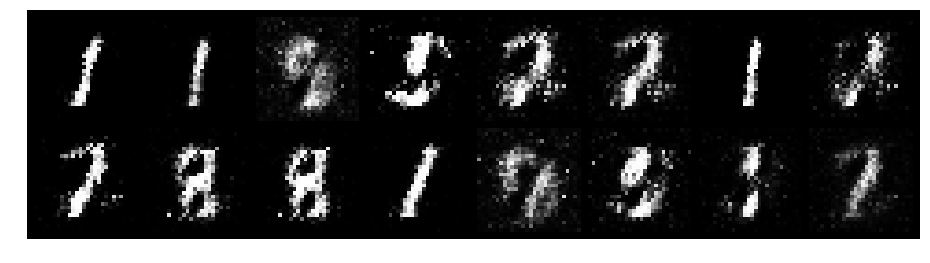

Epoch: [8/200], Batch Num: [100/600]
Discriminator Loss: 0.5357, Generator Loss: 4.5786
D(x): 0.7973, D(G(z)): 0.0304


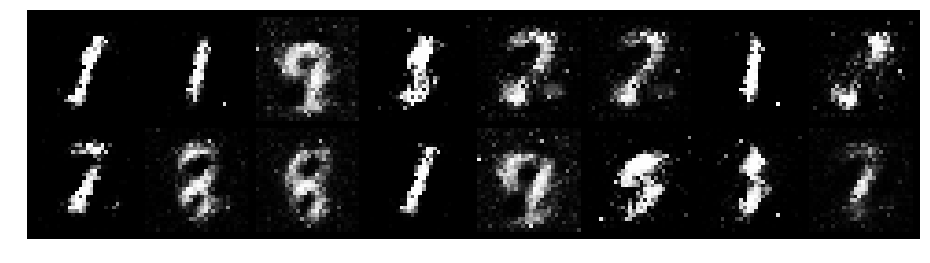

Epoch: [8/200], Batch Num: [200/600]
Discriminator Loss: 0.4965, Generator Loss: 2.3632
D(x): 0.8636, D(G(z)): 0.1827


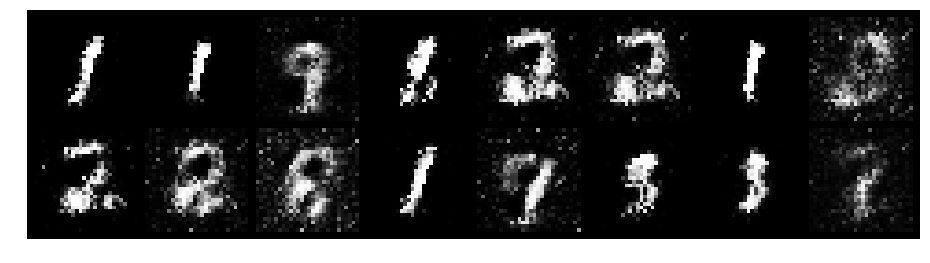

Epoch: [8/200], Batch Num: [300/600]
Discriminator Loss: 0.5157, Generator Loss: 4.1383
D(x): 0.7755, D(G(z)): 0.0299


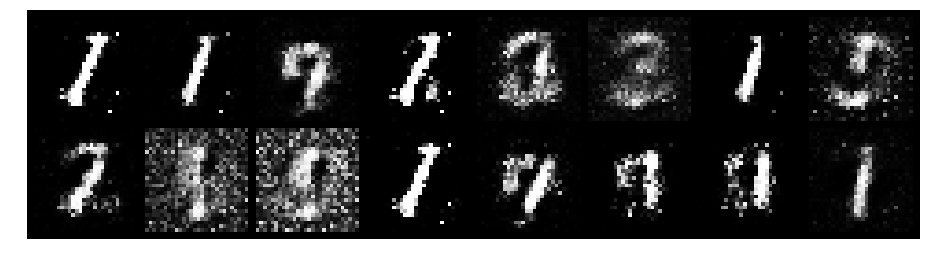

Epoch: [8/200], Batch Num: [400/600]
Discriminator Loss: 0.5482, Generator Loss: 2.1485
D(x): 0.8820, D(G(z)): 0.2442


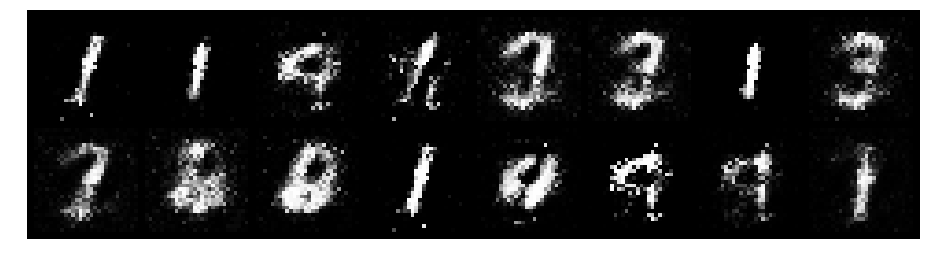

Epoch: [8/200], Batch Num: [500/600]
Discriminator Loss: 0.4648, Generator Loss: 2.4095
D(x): 0.9109, D(G(z)): 0.2149


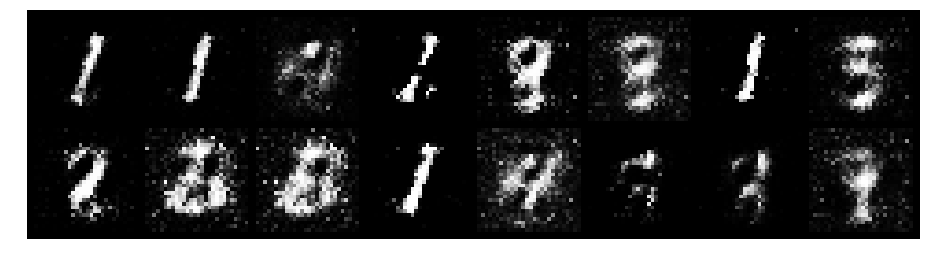

Epoch: [9/200], Batch Num: [0/600]
Discriminator Loss: 0.7753, Generator Loss: 2.6757
D(x): 0.8630, D(G(z)): 0.2968


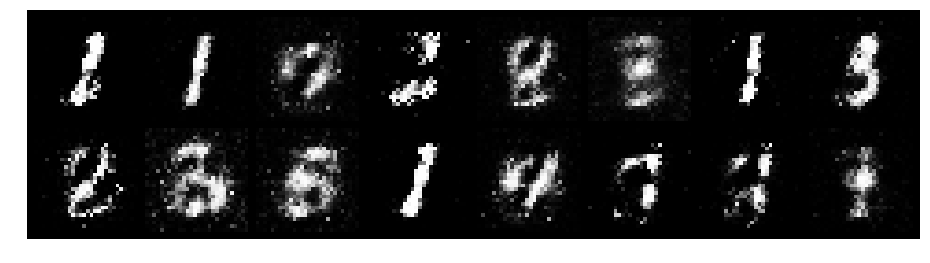

Epoch: [9/200], Batch Num: [100/600]
Discriminator Loss: 0.4278, Generator Loss: 2.9158
D(x): 0.8348, D(G(z)): 0.1401


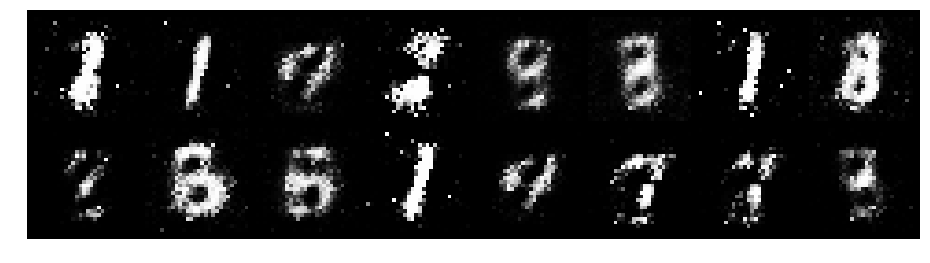

Epoch: [9/200], Batch Num: [200/600]
Discriminator Loss: 0.4181, Generator Loss: 2.9005
D(x): 0.8256, D(G(z)): 0.0950


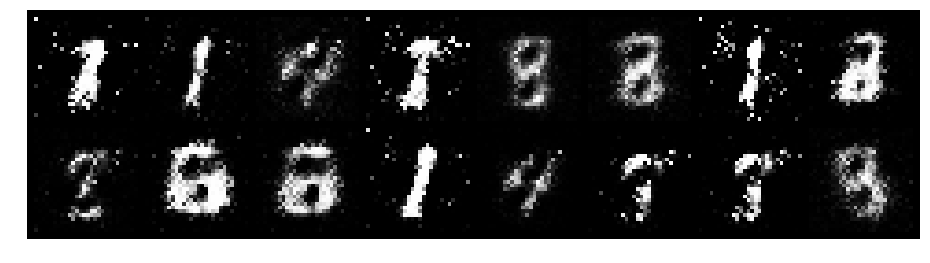

Epoch: [9/200], Batch Num: [300/600]
Discriminator Loss: 0.5556, Generator Loss: 4.4683
D(x): 0.8927, D(G(z)): 0.2377


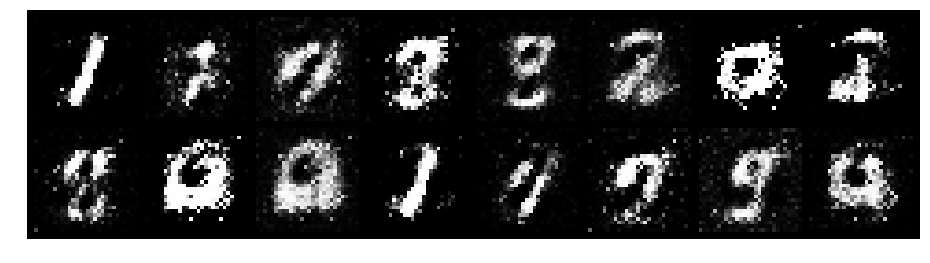

Epoch: [9/200], Batch Num: [400/600]
Discriminator Loss: 0.6007, Generator Loss: 2.6282
D(x): 0.7886, D(G(z)): 0.1671


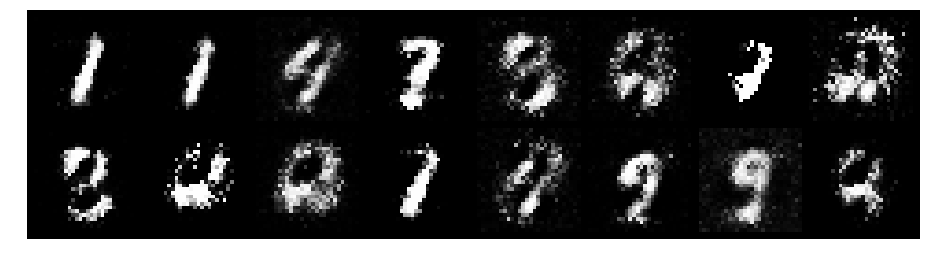

Epoch: [9/200], Batch Num: [500/600]
Discriminator Loss: 0.7531, Generator Loss: 2.9146
D(x): 0.7392, D(G(z)): 0.1433


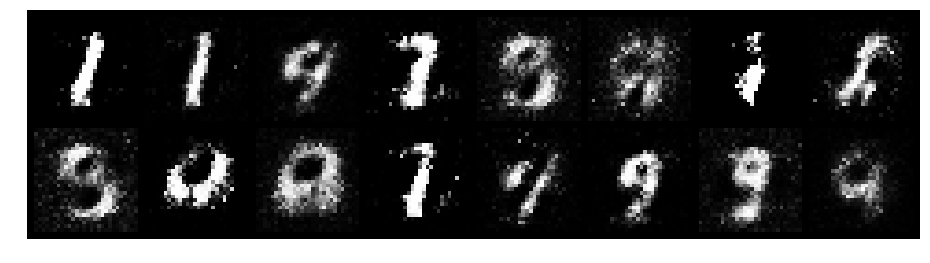

Epoch: [10/200], Batch Num: [0/600]
Discriminator Loss: 0.7591, Generator Loss: 2.1177
D(x): 0.7745, D(G(z)): 0.2013


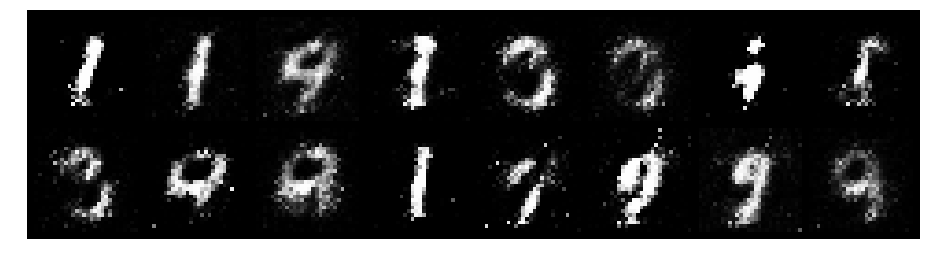

Epoch: [10/200], Batch Num: [100/600]
Discriminator Loss: 0.5665, Generator Loss: 2.9295
D(x): 0.8654, D(G(z)): 0.2023


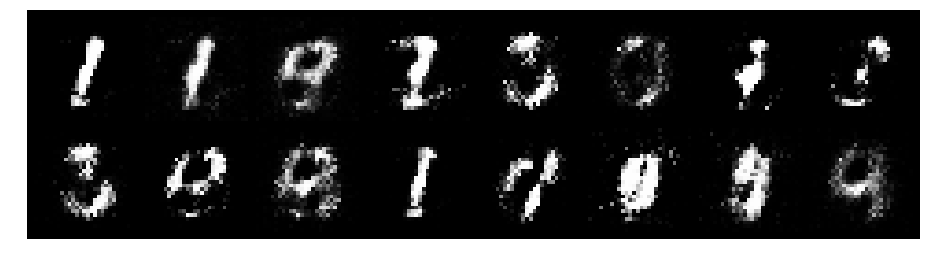

Epoch: [10/200], Batch Num: [200/600]
Discriminator Loss: 0.3966, Generator Loss: 2.2139
D(x): 0.9012, D(G(z)): 0.1829


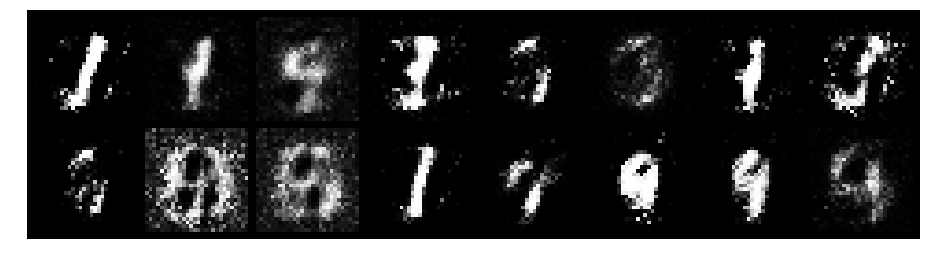

Epoch: [10/200], Batch Num: [300/600]
Discriminator Loss: 0.6350, Generator Loss: 1.5934
D(x): 0.8631, D(G(z)): 0.2925


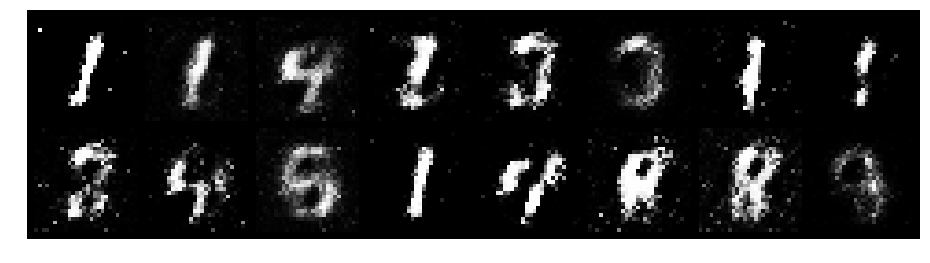

Epoch: [10/200], Batch Num: [400/600]
Discriminator Loss: 0.6826, Generator Loss: 2.0041
D(x): 0.8008, D(G(z)): 0.2676


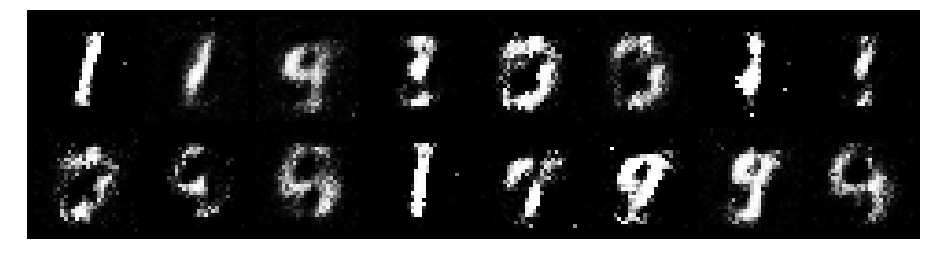

Epoch: [10/200], Batch Num: [500/600]
Discriminator Loss: 0.8047, Generator Loss: 2.1806
D(x): 0.7484, D(G(z)): 0.2240


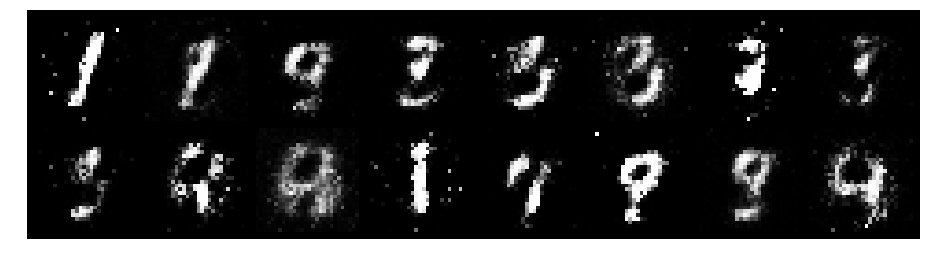

Epoch: [11/200], Batch Num: [0/600]
Discriminator Loss: 0.7098, Generator Loss: 2.8211
D(x): 0.7695, D(G(z)): 0.1477


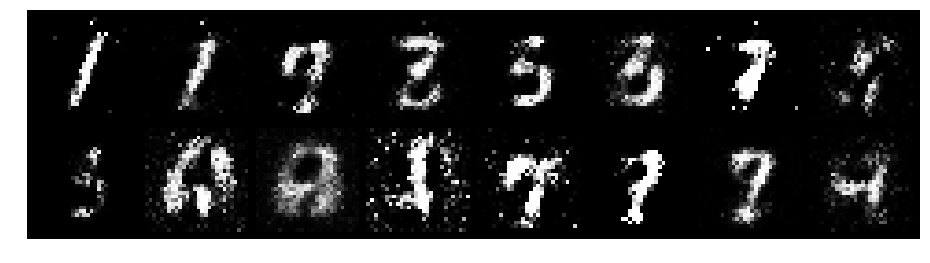

Epoch: [11/200], Batch Num: [100/600]
Discriminator Loss: 0.4663, Generator Loss: 2.2267
D(x): 0.8281, D(G(z)): 0.1468


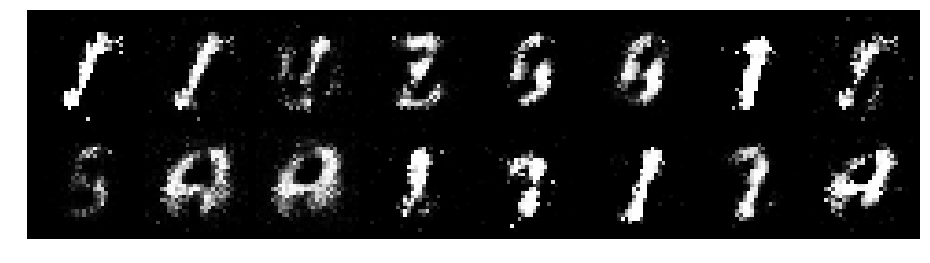

Epoch: [11/200], Batch Num: [200/600]
Discriminator Loss: 0.7418, Generator Loss: 2.5214
D(x): 0.7473, D(G(z)): 0.1431


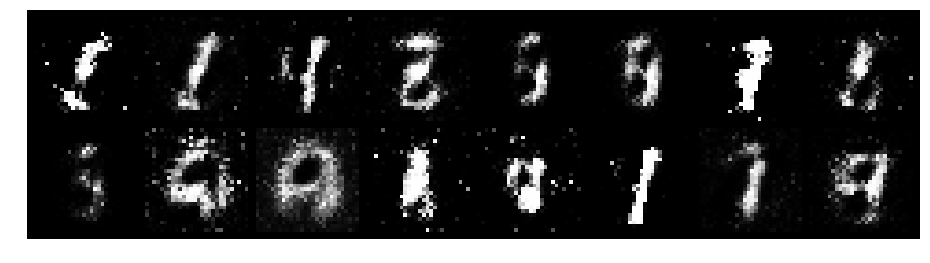

Epoch: [11/200], Batch Num: [300/600]
Discriminator Loss: 0.7459, Generator Loss: 2.6901
D(x): 0.8647, D(G(z)): 0.3095


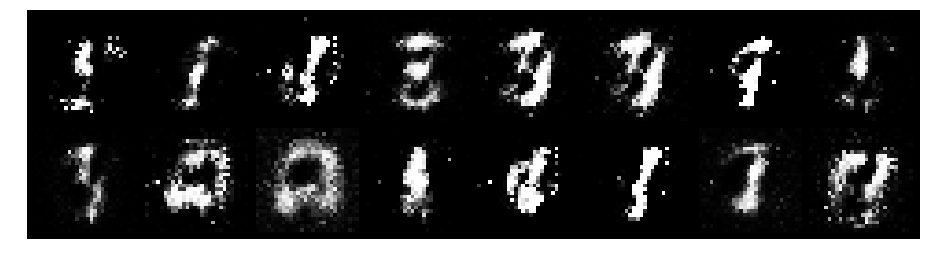

Epoch: [11/200], Batch Num: [400/600]
Discriminator Loss: 0.8536, Generator Loss: 1.8261
D(x): 0.7180, D(G(z)): 0.2194


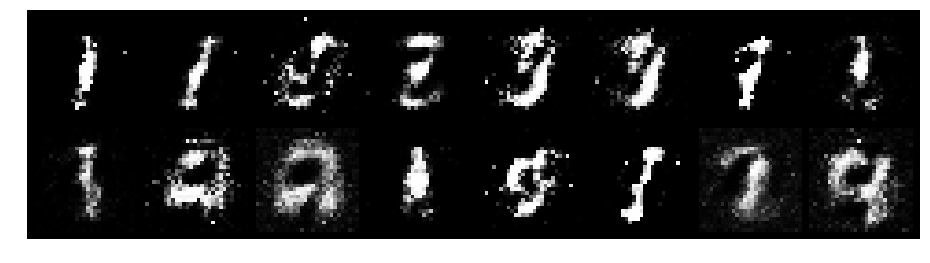

Epoch: [11/200], Batch Num: [500/600]
Discriminator Loss: 0.7050, Generator Loss: 2.6243
D(x): 0.8579, D(G(z)): 0.2916


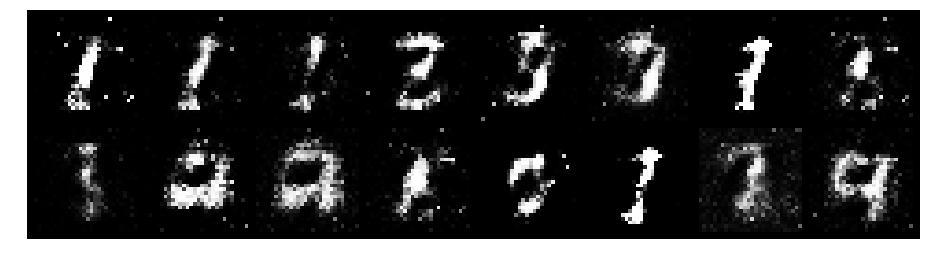

Epoch: [12/200], Batch Num: [0/600]
Discriminator Loss: 0.4415, Generator Loss: 2.9078
D(x): 0.8305, D(G(z)): 0.1405


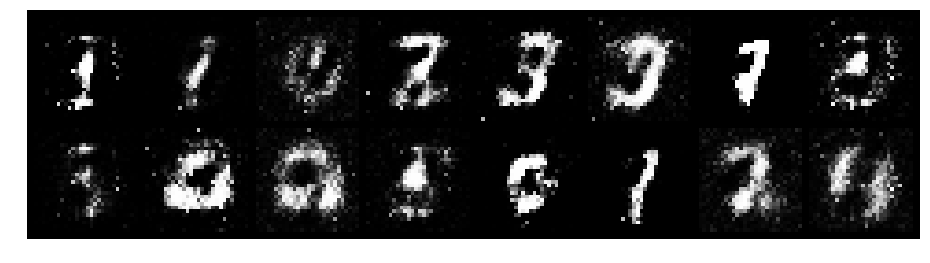

Epoch: [12/200], Batch Num: [100/600]
Discriminator Loss: 0.6010, Generator Loss: 2.3104
D(x): 0.8782, D(G(z)): 0.2406


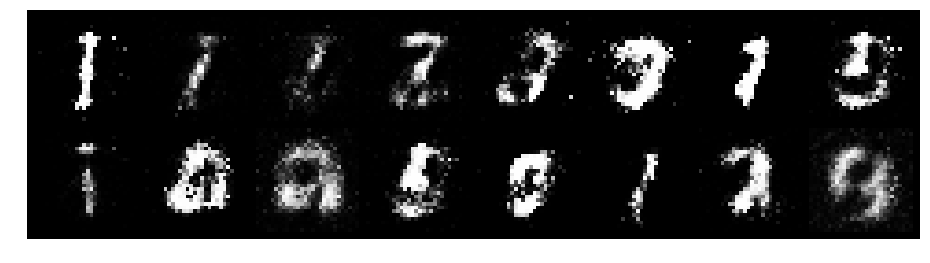

Epoch: [12/200], Batch Num: [200/600]
Discriminator Loss: 0.6128, Generator Loss: 2.6580
D(x): 0.7619, D(G(z)): 0.1288


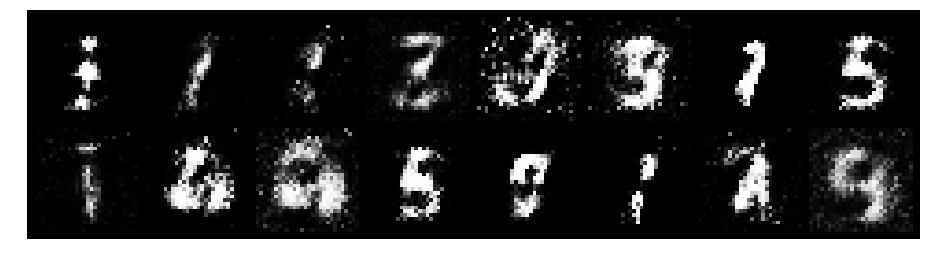

Epoch: [12/200], Batch Num: [300/600]
Discriminator Loss: 1.0051, Generator Loss: 2.4363
D(x): 0.6741, D(G(z)): 0.2143


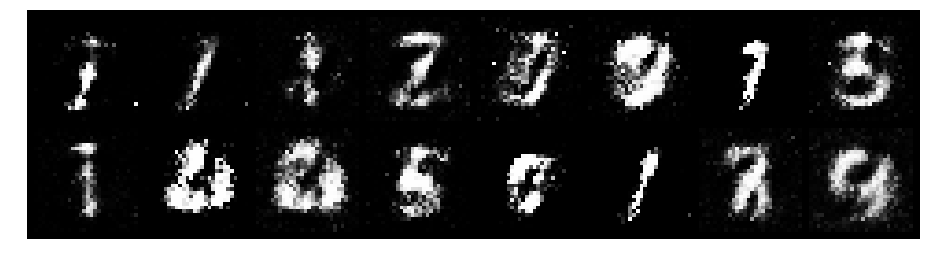

Epoch: [12/200], Batch Num: [400/600]
Discriminator Loss: 0.5607, Generator Loss: 2.9130
D(x): 0.8809, D(G(z)): 0.2285


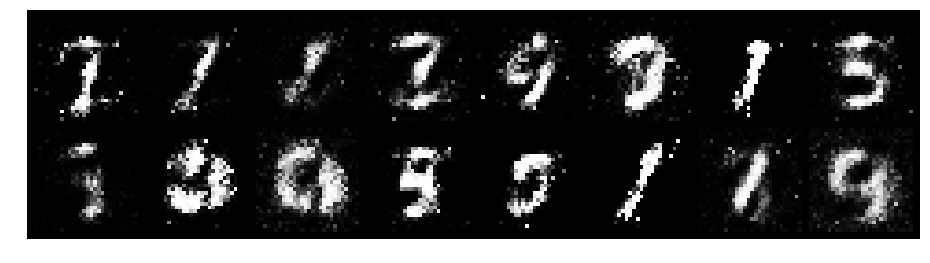

Epoch: [12/200], Batch Num: [500/600]
Discriminator Loss: 0.6013, Generator Loss: 2.1775
D(x): 0.8144, D(G(z)): 0.1988


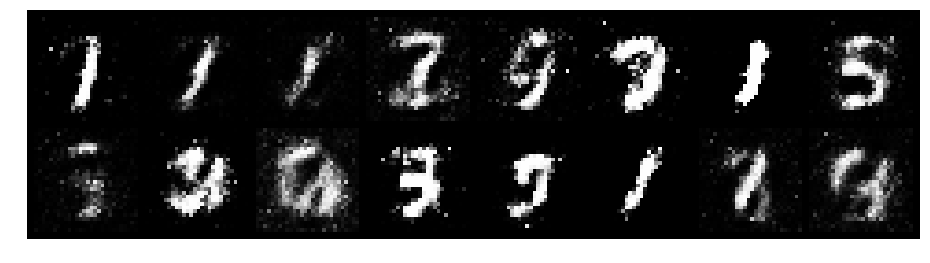

Epoch: [13/200], Batch Num: [0/600]
Discriminator Loss: 0.6674, Generator Loss: 2.1048
D(x): 0.8360, D(G(z)): 0.2569


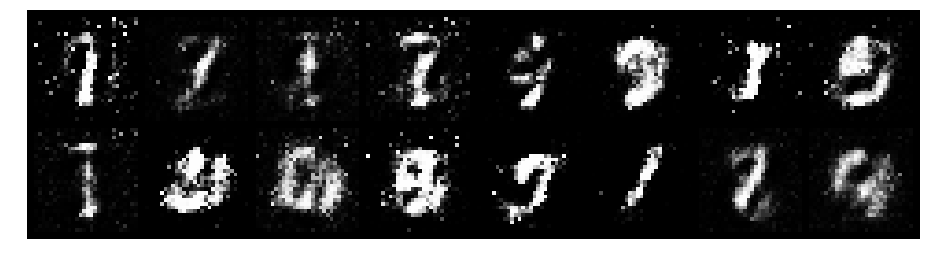

Epoch: [13/200], Batch Num: [100/600]
Discriminator Loss: 0.6259, Generator Loss: 2.6253
D(x): 0.8138, D(G(z)): 0.2191


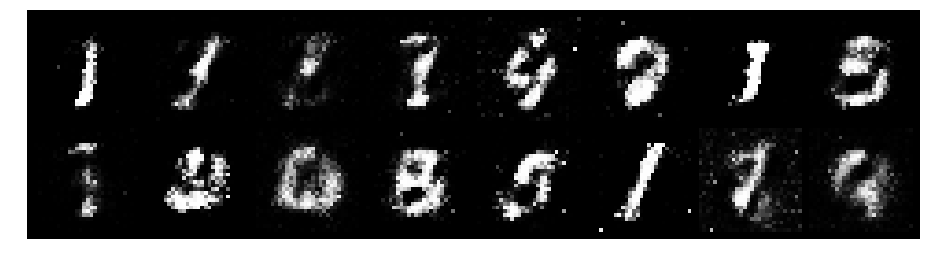

Epoch: [13/200], Batch Num: [200/600]
Discriminator Loss: 0.5833, Generator Loss: 2.2685
D(x): 0.8191, D(G(z)): 0.2029


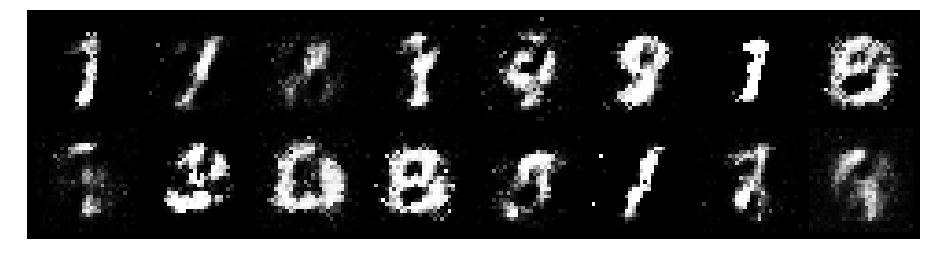

Epoch: [13/200], Batch Num: [300/600]
Discriminator Loss: 0.8122, Generator Loss: 1.7224
D(x): 0.8436, D(G(z)): 0.3373


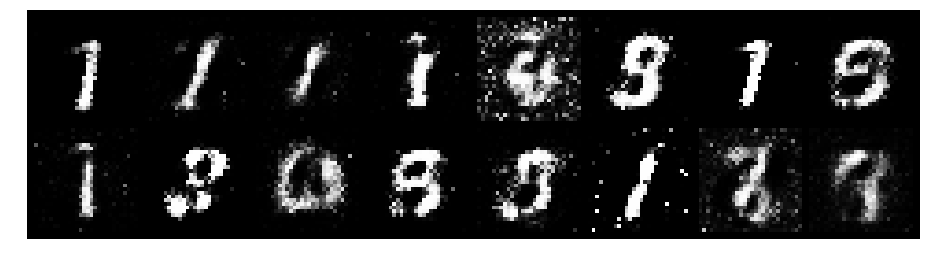

Epoch: [13/200], Batch Num: [400/600]
Discriminator Loss: 0.8762, Generator Loss: 2.3320
D(x): 0.7108, D(G(z)): 0.2136


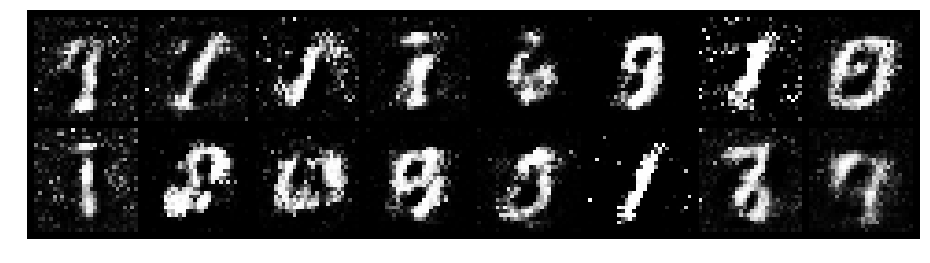

Epoch: [13/200], Batch Num: [500/600]
Discriminator Loss: 0.8819, Generator Loss: 1.7834
D(x): 0.7575, D(G(z)): 0.2887


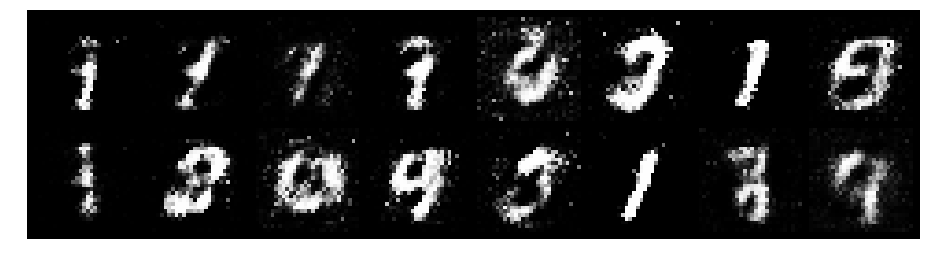

Epoch: [14/200], Batch Num: [0/600]
Discriminator Loss: 0.8196, Generator Loss: 2.7244
D(x): 0.7596, D(G(z)): 0.1887


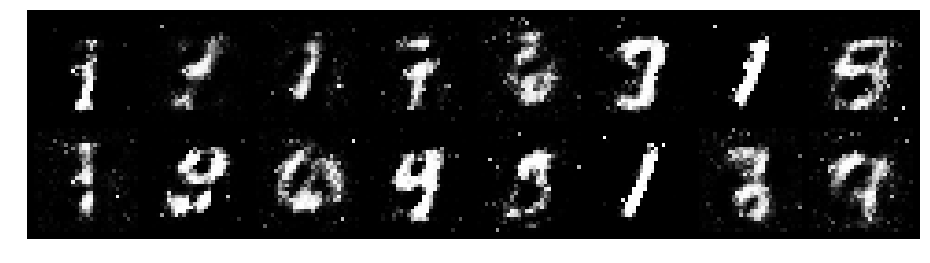

Epoch: [14/200], Batch Num: [100/600]
Discriminator Loss: 0.9843, Generator Loss: 1.5869
D(x): 0.7111, D(G(z)): 0.2649


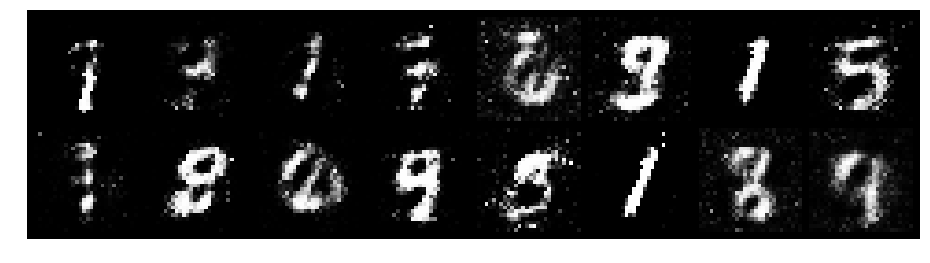

Epoch: [14/200], Batch Num: [200/600]
Discriminator Loss: 0.8652, Generator Loss: 1.3686
D(x): 0.7704, D(G(z)): 0.3471


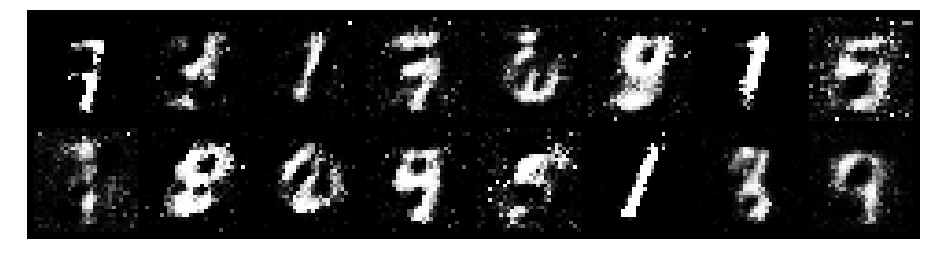

Epoch: [14/200], Batch Num: [300/600]
Discriminator Loss: 0.6607, Generator Loss: 1.6537
D(x): 0.8238, D(G(z)): 0.2879


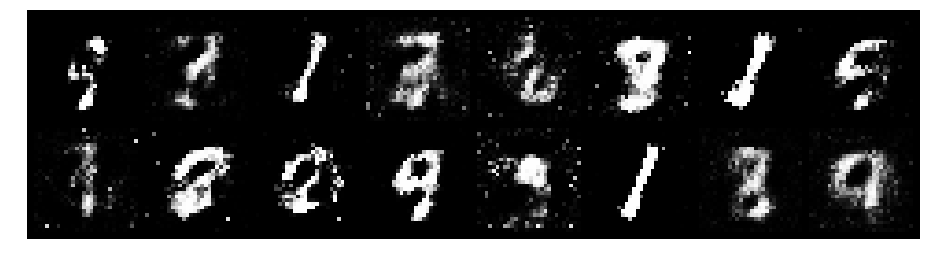

Epoch: [14/200], Batch Num: [400/600]
Discriminator Loss: 0.7612, Generator Loss: 2.8951
D(x): 0.7527, D(G(z)): 0.2094


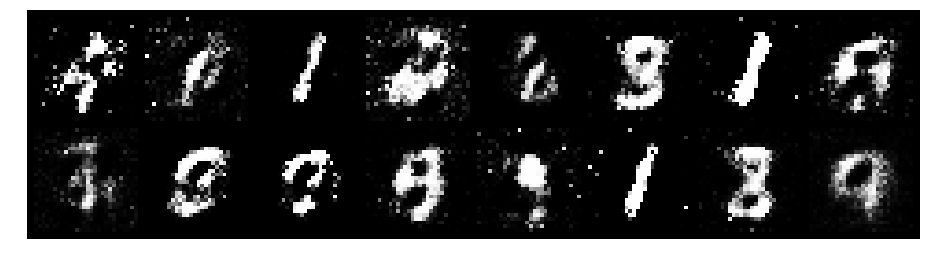

Epoch: [14/200], Batch Num: [500/600]
Discriminator Loss: 0.6452, Generator Loss: 3.2418
D(x): 0.8198, D(G(z)): 0.2278


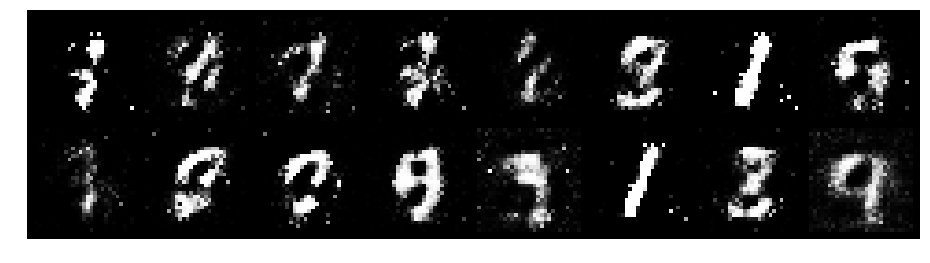

Epoch: [15/200], Batch Num: [0/600]
Discriminator Loss: 0.5629, Generator Loss: 1.9011
D(x): 0.8068, D(G(z)): 0.2207


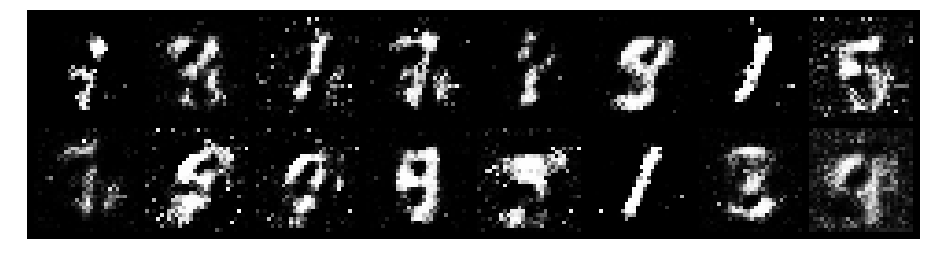

Epoch: [15/200], Batch Num: [100/600]
Discriminator Loss: 0.8337, Generator Loss: 1.8080
D(x): 0.7214, D(G(z)): 0.2539


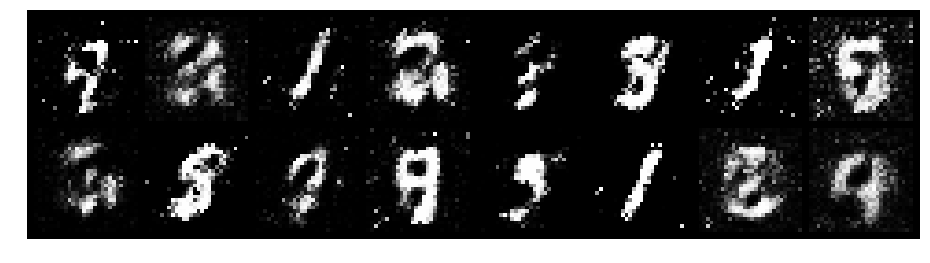

Epoch: [15/200], Batch Num: [200/600]
Discriminator Loss: 0.4901, Generator Loss: 2.2313
D(x): 0.8433, D(G(z)): 0.1898


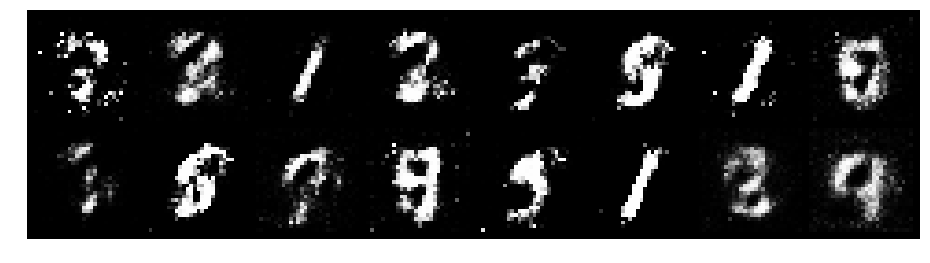

Epoch: [15/200], Batch Num: [300/600]
Discriminator Loss: 0.5214, Generator Loss: 2.1230
D(x): 0.8147, D(G(z)): 0.1546


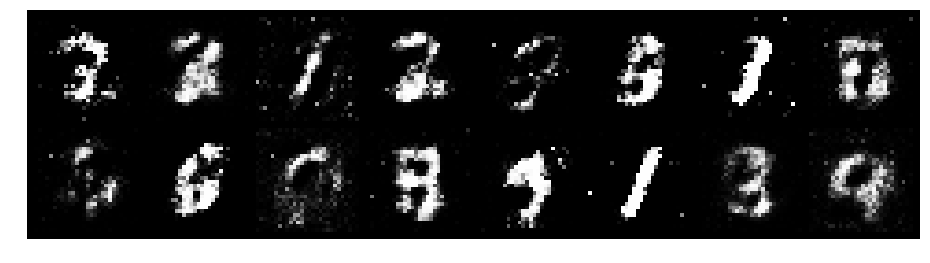

Epoch: [15/200], Batch Num: [400/600]
Discriminator Loss: 0.6295, Generator Loss: 1.8006
D(x): 0.8020, D(G(z)): 0.2329


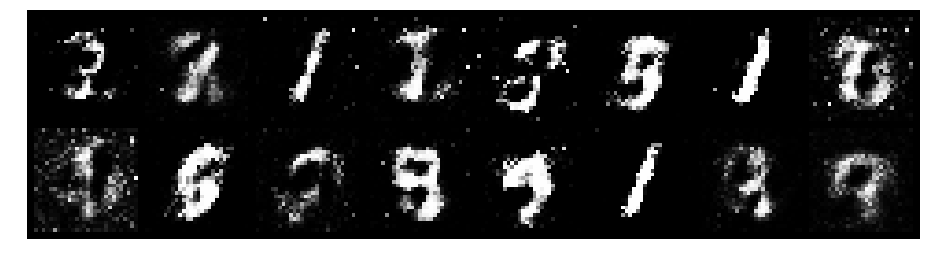

Epoch: [15/200], Batch Num: [500/600]
Discriminator Loss: 0.5112, Generator Loss: 2.9178
D(x): 0.8196, D(G(z)): 0.1729


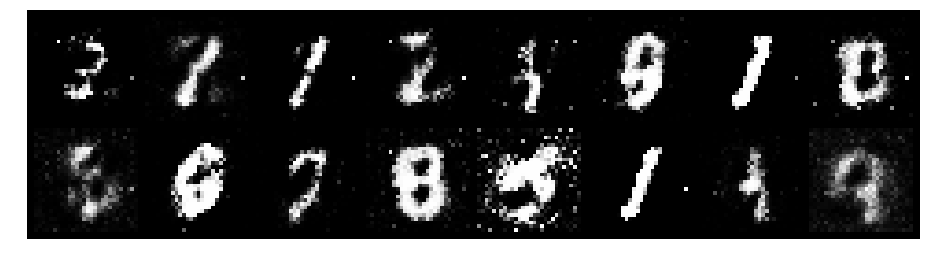

Epoch: [16/200], Batch Num: [0/600]
Discriminator Loss: 0.6143, Generator Loss: 2.0910
D(x): 0.8640, D(G(z)): 0.2428


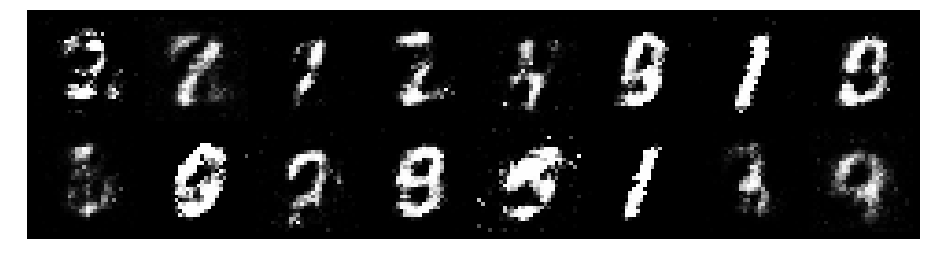

Epoch: [16/200], Batch Num: [100/600]
Discriminator Loss: 0.8732, Generator Loss: 1.9992
D(x): 0.8320, D(G(z)): 0.3700


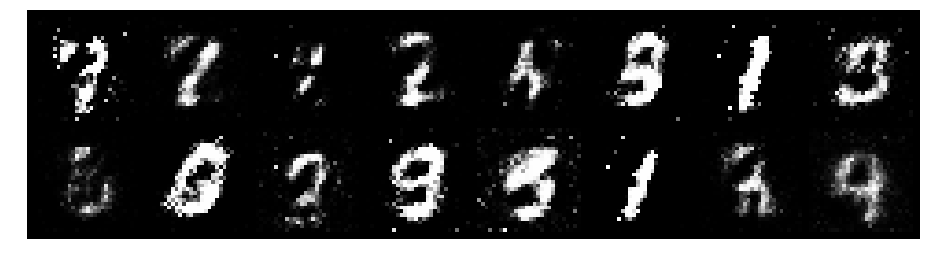

Epoch: [16/200], Batch Num: [200/600]
Discriminator Loss: 0.9518, Generator Loss: 1.8040
D(x): 0.7252, D(G(z)): 0.2900


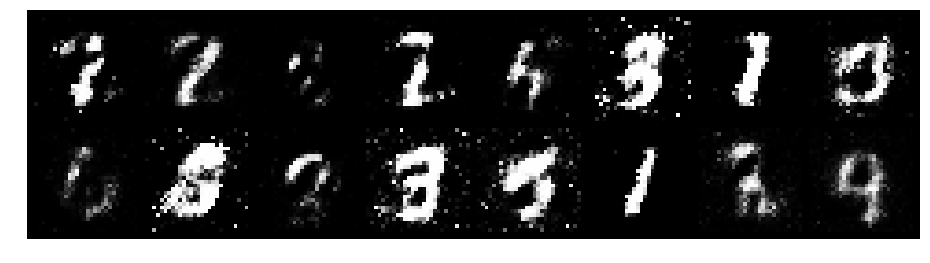

Epoch: [16/200], Batch Num: [300/600]
Discriminator Loss: 0.9168, Generator Loss: 1.5411
D(x): 0.7577, D(G(z)): 0.3411


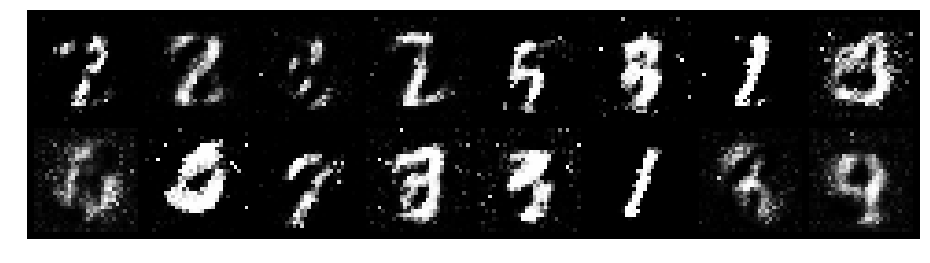

Epoch: [16/200], Batch Num: [400/600]
Discriminator Loss: 0.9565, Generator Loss: 2.6807
D(x): 0.6850, D(G(z)): 0.2386


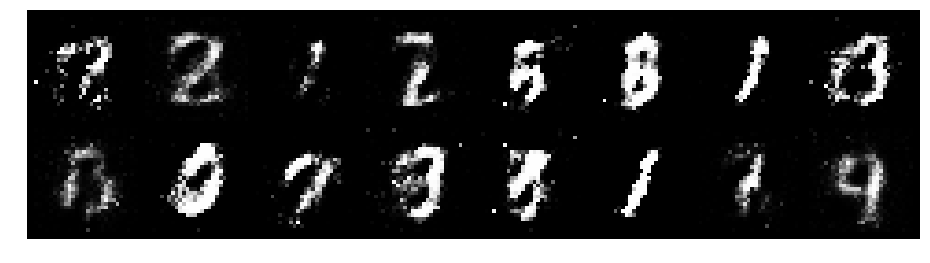

Epoch: [16/200], Batch Num: [500/600]
Discriminator Loss: 0.9220, Generator Loss: 2.0882
D(x): 0.7673, D(G(z)): 0.3299


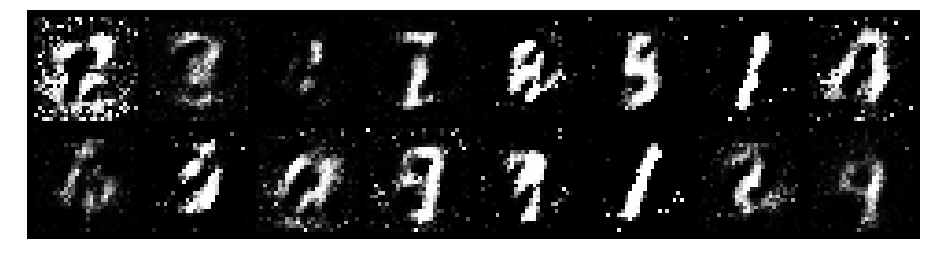

Epoch: [17/200], Batch Num: [0/600]
Discriminator Loss: 0.9916, Generator Loss: 1.5986
D(x): 0.7755, D(G(z)): 0.4042


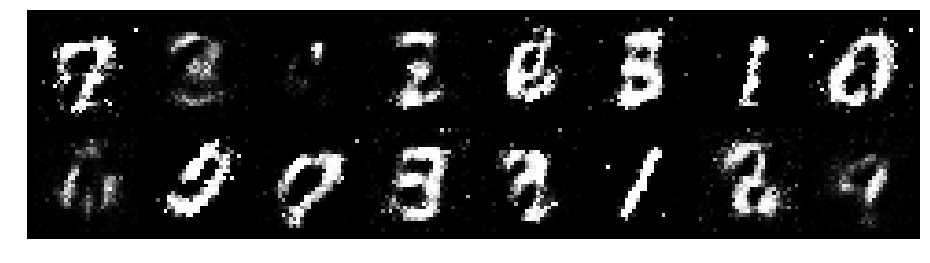

Epoch: [17/200], Batch Num: [100/600]
Discriminator Loss: 0.8935, Generator Loss: 1.6620
D(x): 0.7339, D(G(z)): 0.3299


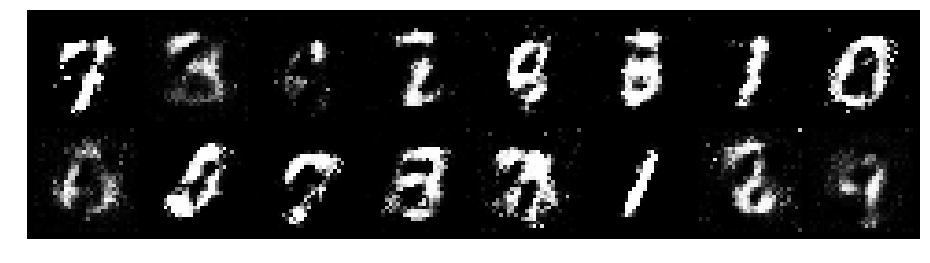

Epoch: [17/200], Batch Num: [200/600]
Discriminator Loss: 0.8456, Generator Loss: 1.9256
D(x): 0.6829, D(G(z)): 0.2418


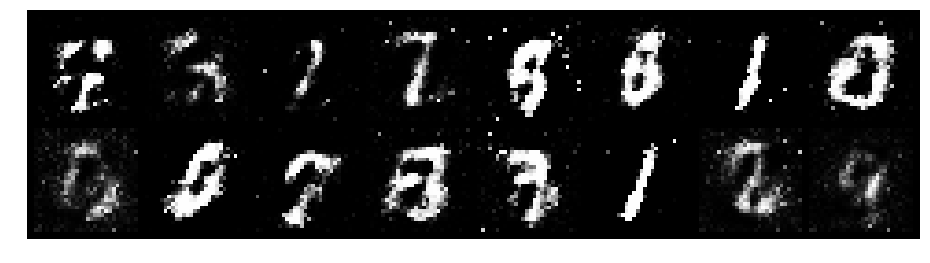

Epoch: [17/200], Batch Num: [300/600]
Discriminator Loss: 0.6855, Generator Loss: 1.9093
D(x): 0.7277, D(G(z)): 0.1998


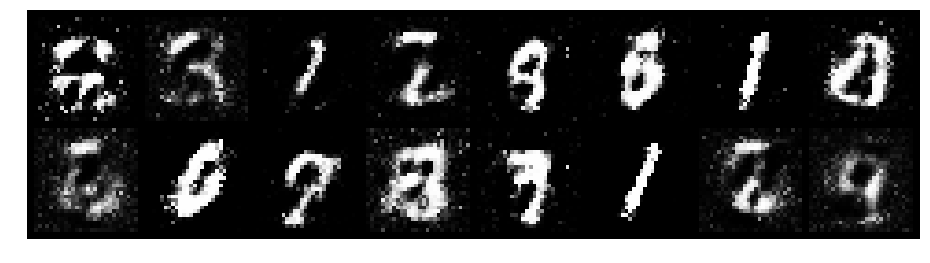

Epoch: [17/200], Batch Num: [400/600]
Discriminator Loss: 0.7860, Generator Loss: 1.2272
D(x): 0.8448, D(G(z)): 0.3418


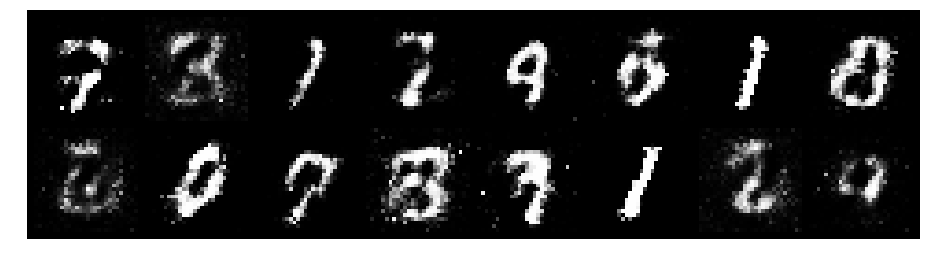

Epoch: [17/200], Batch Num: [500/600]
Discriminator Loss: 0.7890, Generator Loss: 1.8083
D(x): 0.7661, D(G(z)): 0.2933


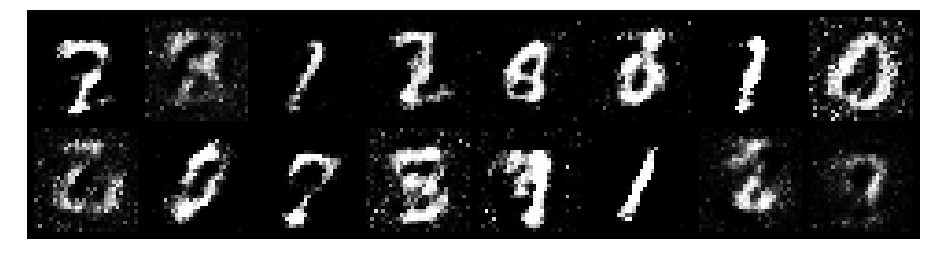

Epoch: [18/200], Batch Num: [0/600]
Discriminator Loss: 0.6638, Generator Loss: 2.1538
D(x): 0.8703, D(G(z)): 0.3028


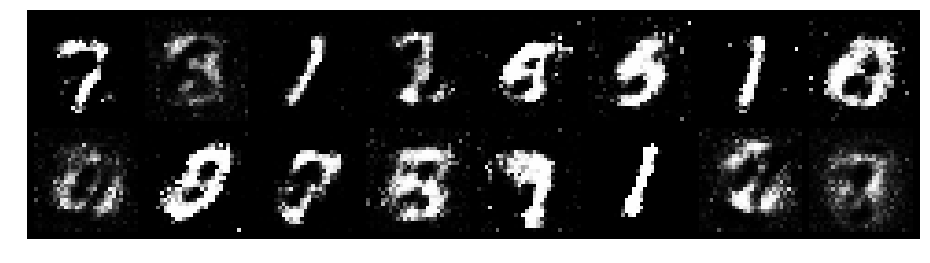

Epoch: [18/200], Batch Num: [100/600]
Discriminator Loss: 0.8361, Generator Loss: 1.7311
D(x): 0.7367, D(G(z)): 0.3198


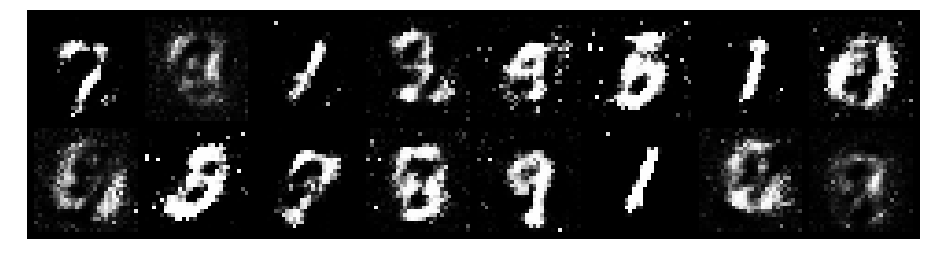

Epoch: [18/200], Batch Num: [200/600]
Discriminator Loss: 1.0781, Generator Loss: 1.9022
D(x): 0.6594, D(G(z)): 0.2828


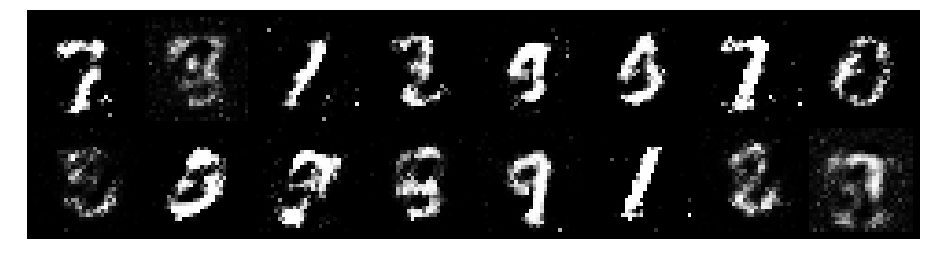

Epoch: [18/200], Batch Num: [300/600]
Discriminator Loss: 0.8894, Generator Loss: 1.3526
D(x): 0.7577, D(G(z)): 0.3178


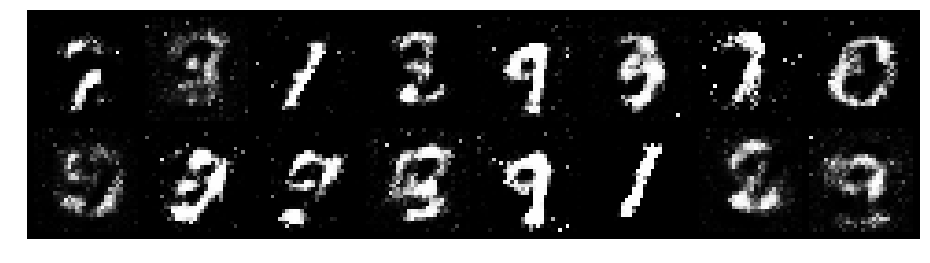

Epoch: [18/200], Batch Num: [400/600]
Discriminator Loss: 0.9481, Generator Loss: 1.8300
D(x): 0.6586, D(G(z)): 0.2470


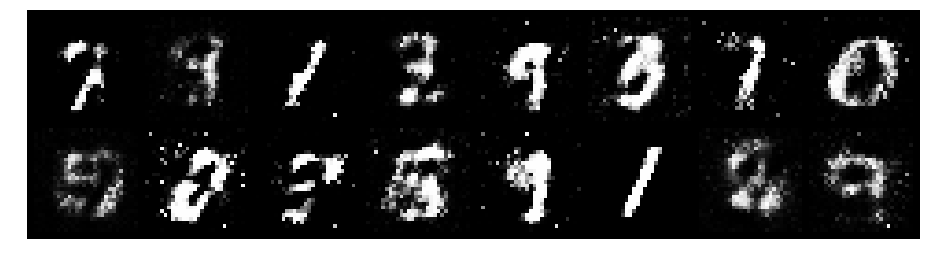

Epoch: [18/200], Batch Num: [500/600]
Discriminator Loss: 0.8507, Generator Loss: 1.3739
D(x): 0.7356, D(G(z)): 0.3333


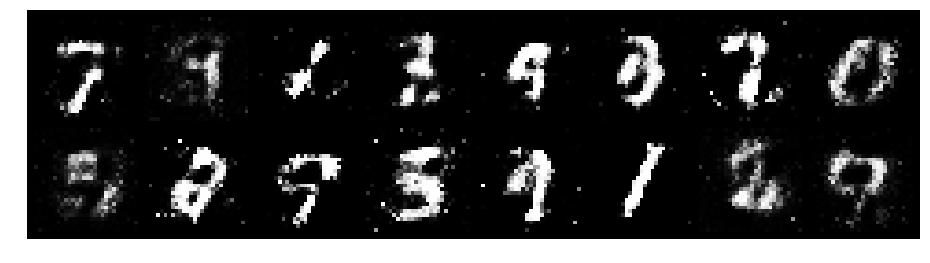

Epoch: [19/200], Batch Num: [0/600]
Discriminator Loss: 0.8088, Generator Loss: 1.9025
D(x): 0.8128, D(G(z)): 0.3480


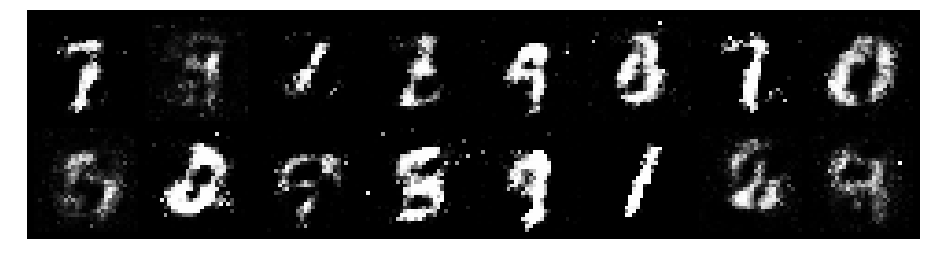

Epoch: [19/200], Batch Num: [100/600]
Discriminator Loss: 0.6479, Generator Loss: 1.9228
D(x): 0.7558, D(G(z)): 0.2114


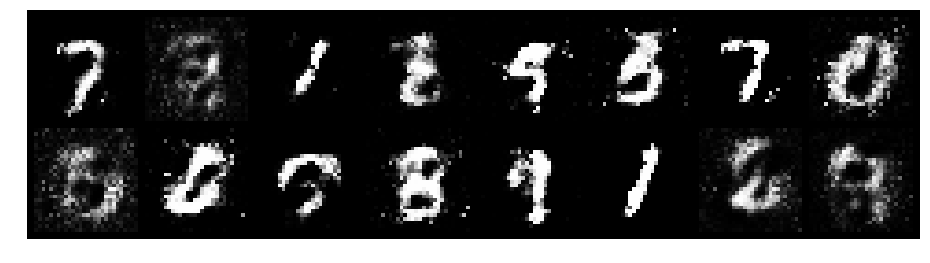

Epoch: [19/200], Batch Num: [200/600]
Discriminator Loss: 0.9751, Generator Loss: 1.4280
D(x): 0.6869, D(G(z)): 0.3494


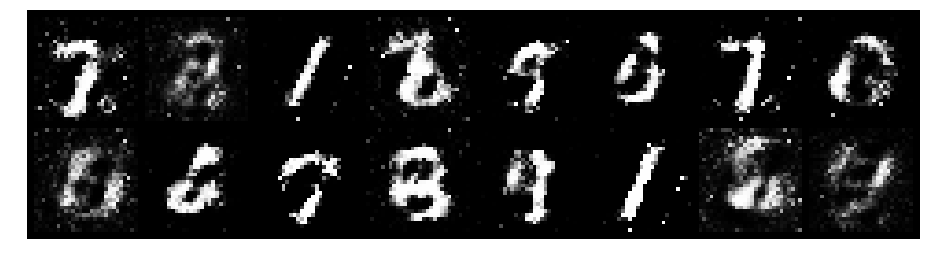

Epoch: [19/200], Batch Num: [300/600]
Discriminator Loss: 1.0318, Generator Loss: 1.4290
D(x): 0.7208, D(G(z)): 0.4057


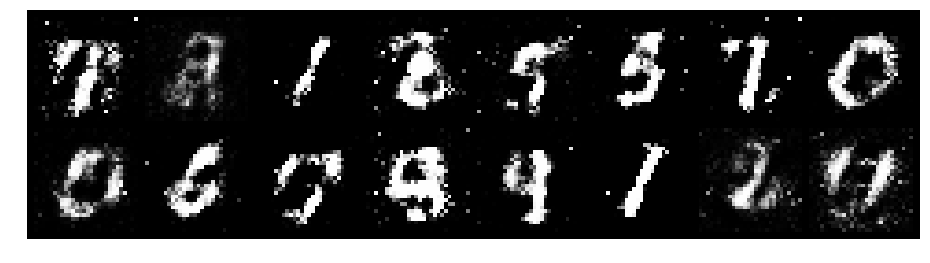

Epoch: [19/200], Batch Num: [400/600]
Discriminator Loss: 1.0912, Generator Loss: 1.4753
D(x): 0.6126, D(G(z)): 0.2844


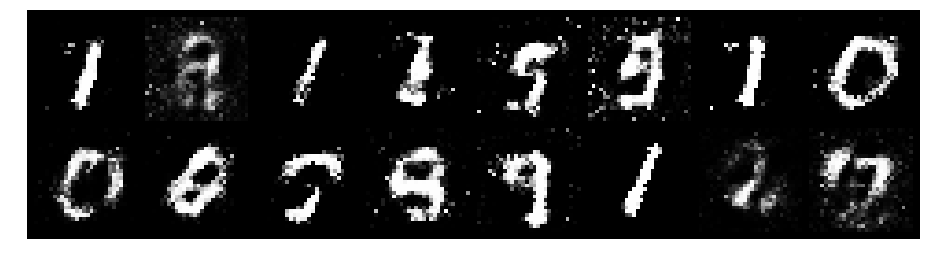

Epoch: [19/200], Batch Num: [500/600]
Discriminator Loss: 0.9137, Generator Loss: 0.9484
D(x): 0.7410, D(G(z)): 0.3707


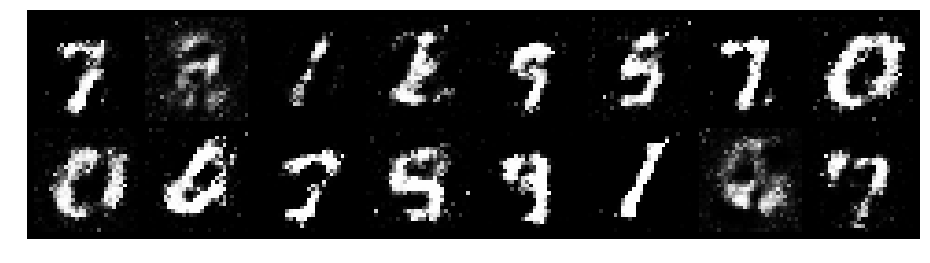

Epoch: [20/200], Batch Num: [0/600]
Discriminator Loss: 0.8868, Generator Loss: 1.7230
D(x): 0.6819, D(G(z)): 0.2673


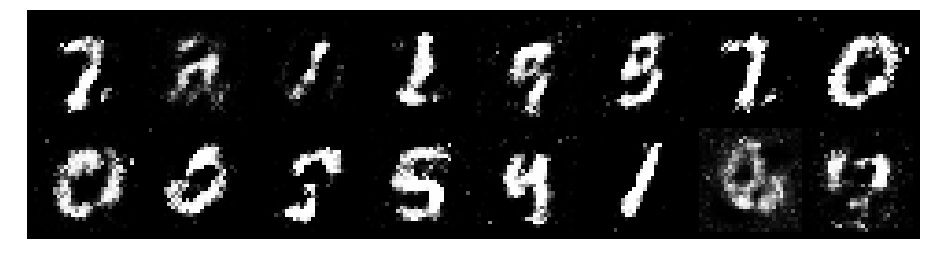

Epoch: [20/200], Batch Num: [100/600]
Discriminator Loss: 0.8467, Generator Loss: 1.3912
D(x): 0.7609, D(G(z)): 0.3418


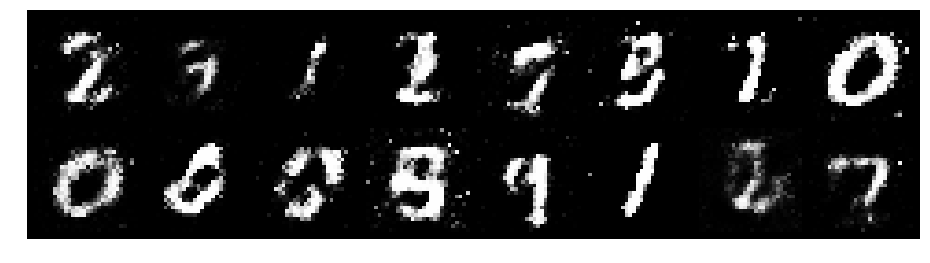

Epoch: [20/200], Batch Num: [200/600]
Discriminator Loss: 0.8258, Generator Loss: 1.4495
D(x): 0.7818, D(G(z)): 0.3013


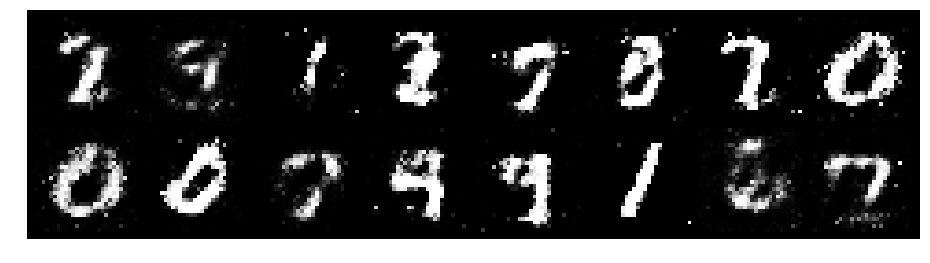

Epoch: [20/200], Batch Num: [300/600]
Discriminator Loss: 0.7866, Generator Loss: 2.3012
D(x): 0.7673, D(G(z)): 0.2595


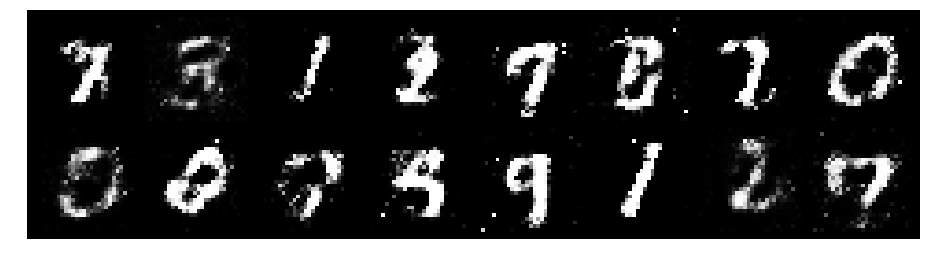

Epoch: [20/200], Batch Num: [400/600]
Discriminator Loss: 1.0425, Generator Loss: 1.5562
D(x): 0.6660, D(G(z)): 0.3066


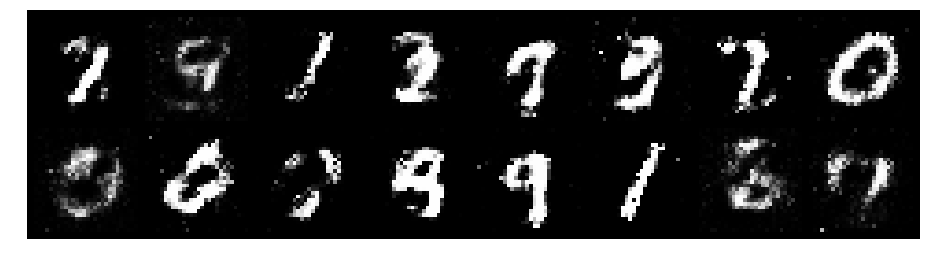

Epoch: [20/200], Batch Num: [500/600]
Discriminator Loss: 0.9819, Generator Loss: 1.4492
D(x): 0.7224, D(G(z)): 0.3624


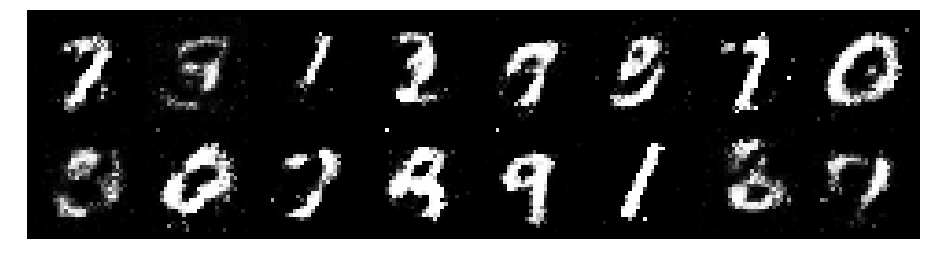

Epoch: [21/200], Batch Num: [0/600]
Discriminator Loss: 0.7568, Generator Loss: 2.0993
D(x): 0.7028, D(G(z)): 0.2130


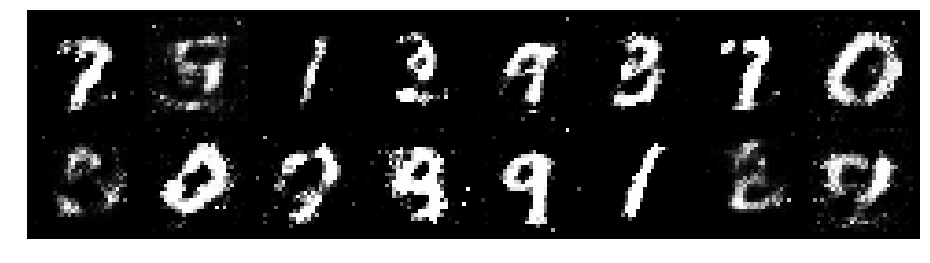

Epoch: [21/200], Batch Num: [100/600]
Discriminator Loss: 1.1163, Generator Loss: 1.2497
D(x): 0.6794, D(G(z)): 0.3849


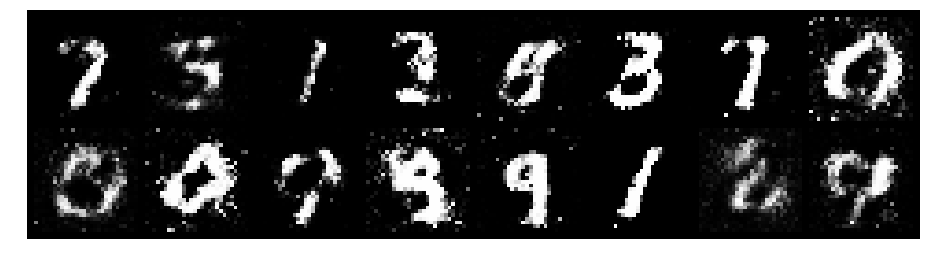

Epoch: [21/200], Batch Num: [200/600]
Discriminator Loss: 0.9546, Generator Loss: 2.0197
D(x): 0.7182, D(G(z)): 0.3311


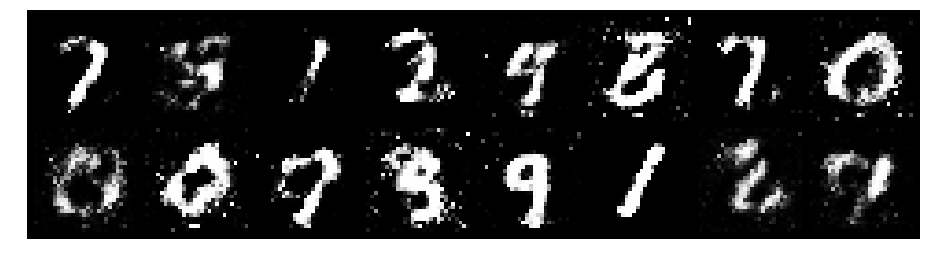

Epoch: [21/200], Batch Num: [300/600]
Discriminator Loss: 1.0159, Generator Loss: 1.6504
D(x): 0.5899, D(G(z)): 0.1738


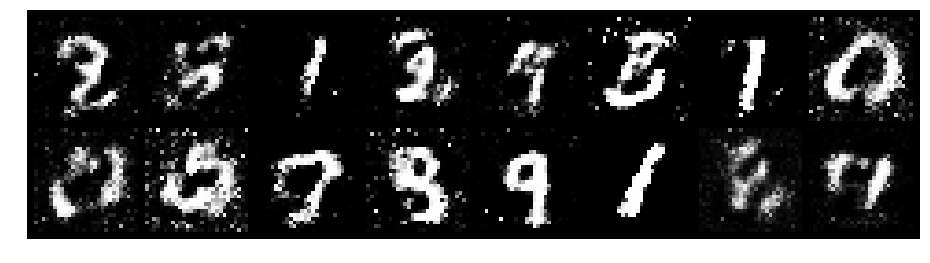

Epoch: [21/200], Batch Num: [400/600]
Discriminator Loss: 0.8837, Generator Loss: 1.5606
D(x): 0.7503, D(G(z)): 0.3382


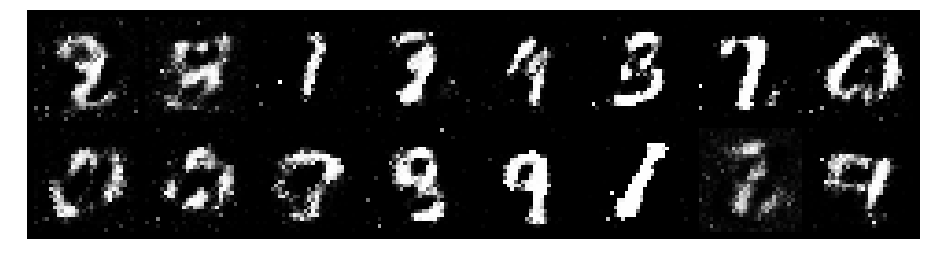

Epoch: [21/200], Batch Num: [500/600]
Discriminator Loss: 0.7907, Generator Loss: 2.0343
D(x): 0.6869, D(G(z)): 0.2091


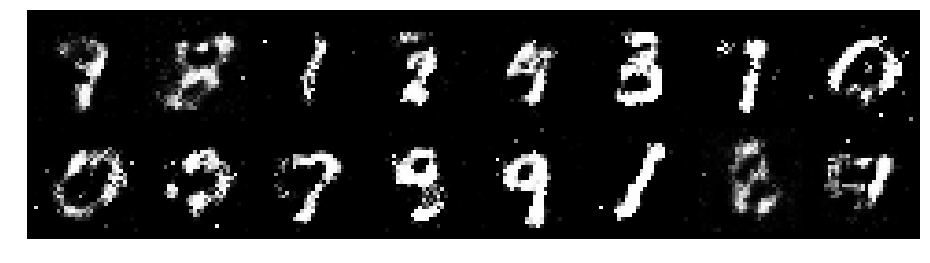

Epoch: [22/200], Batch Num: [0/600]
Discriminator Loss: 0.8809, Generator Loss: 1.6537
D(x): 0.6369, D(G(z)): 0.1900


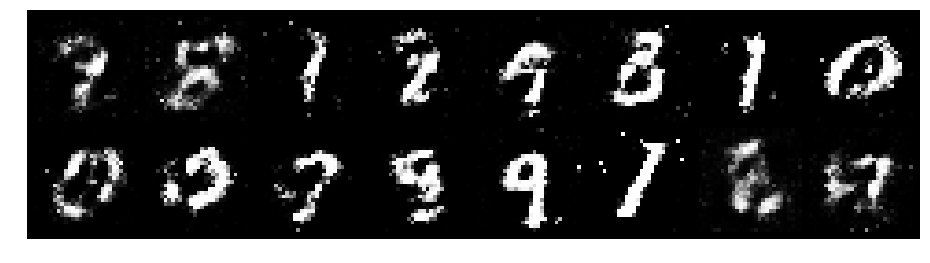

Epoch: [22/200], Batch Num: [100/600]
Discriminator Loss: 0.8699, Generator Loss: 1.0578
D(x): 0.7389, D(G(z)): 0.3167


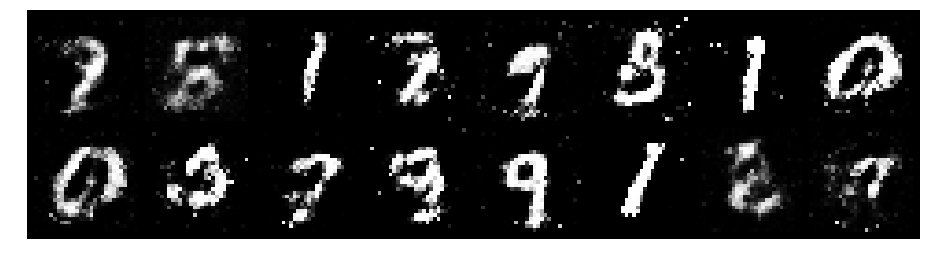

Epoch: [22/200], Batch Num: [200/600]
Discriminator Loss: 0.9891, Generator Loss: 1.8082
D(x): 0.6609, D(G(z)): 0.2939


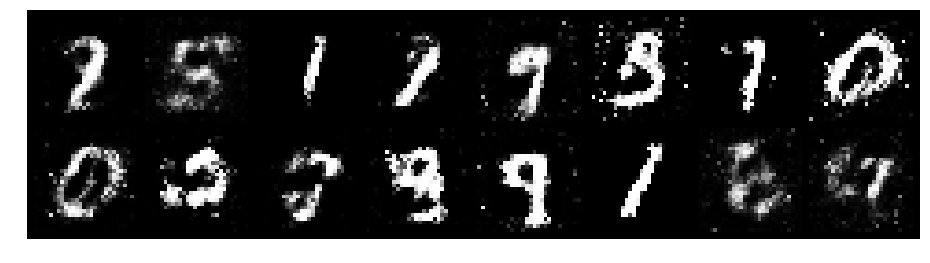

Epoch: [22/200], Batch Num: [300/600]
Discriminator Loss: 1.2173, Generator Loss: 1.0798
D(x): 0.6411, D(G(z)): 0.4197


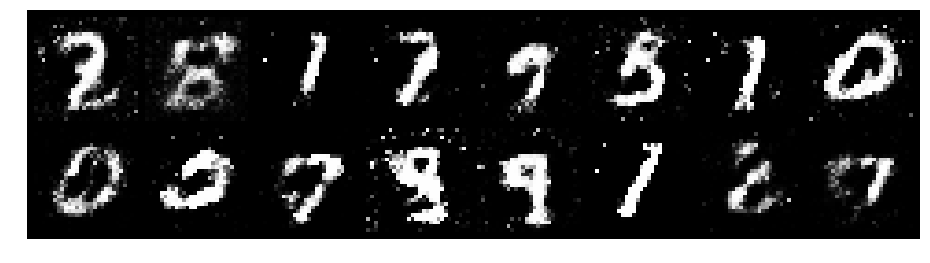

Epoch: [22/200], Batch Num: [400/600]
Discriminator Loss: 1.0591, Generator Loss: 1.4066
D(x): 0.6365, D(G(z)): 0.2951


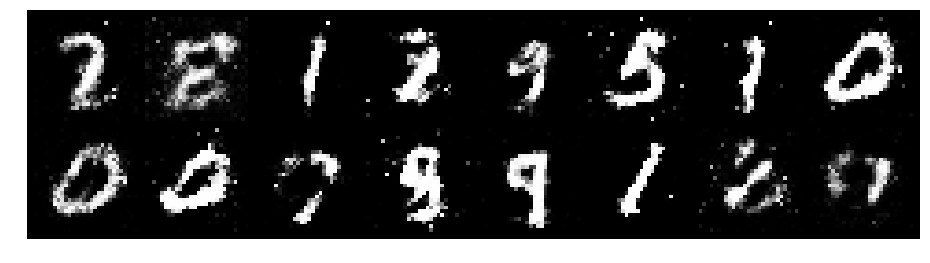

Epoch: [22/200], Batch Num: [500/600]
Discriminator Loss: 0.8705, Generator Loss: 1.4094
D(x): 0.6690, D(G(z)): 0.2546


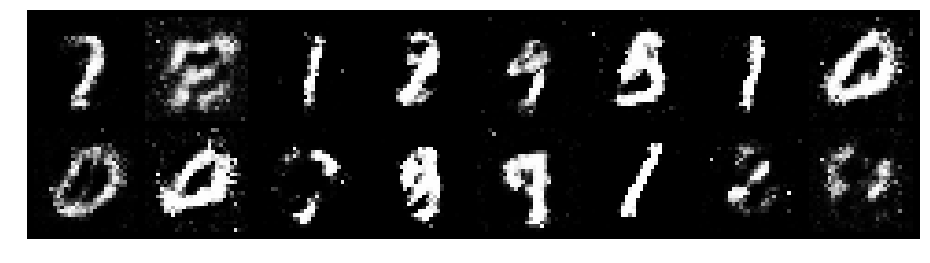

Epoch: [23/200], Batch Num: [0/600]
Discriminator Loss: 1.0029, Generator Loss: 2.0932
D(x): 0.6846, D(G(z)): 0.3229


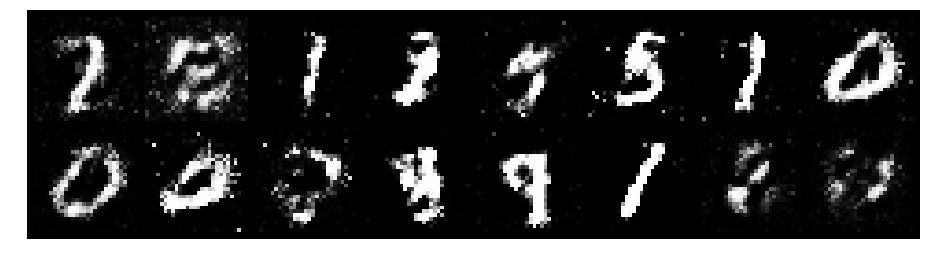

Epoch: [23/200], Batch Num: [100/600]
Discriminator Loss: 1.0871, Generator Loss: 1.7816
D(x): 0.6696, D(G(z)): 0.3424


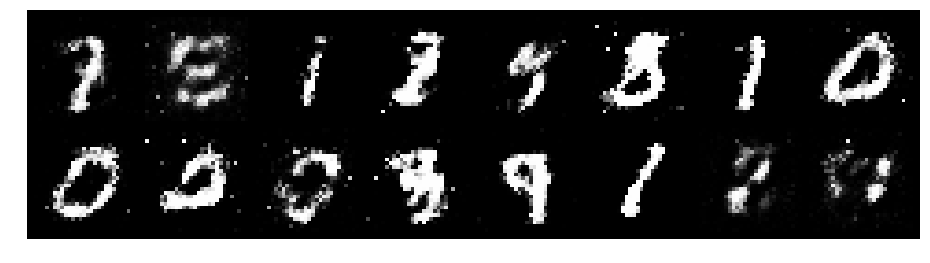

Epoch: [23/200], Batch Num: [200/600]
Discriminator Loss: 0.9177, Generator Loss: 1.4248
D(x): 0.6651, D(G(z)): 0.2847


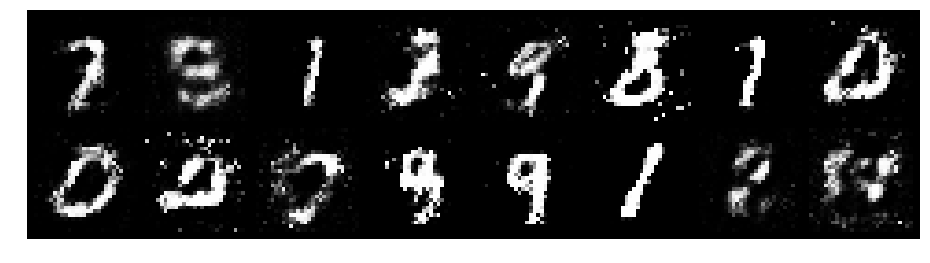

Epoch: [23/200], Batch Num: [300/600]
Discriminator Loss: 0.9342, Generator Loss: 1.4635
D(x): 0.6622, D(G(z)): 0.3220


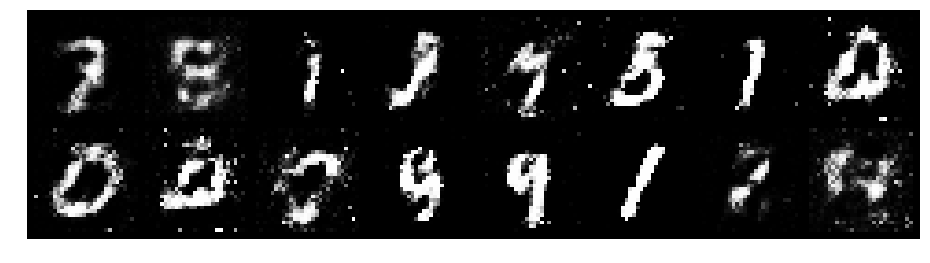

Epoch: [23/200], Batch Num: [400/600]
Discriminator Loss: 0.8252, Generator Loss: 1.6872
D(x): 0.7462, D(G(z)): 0.2453


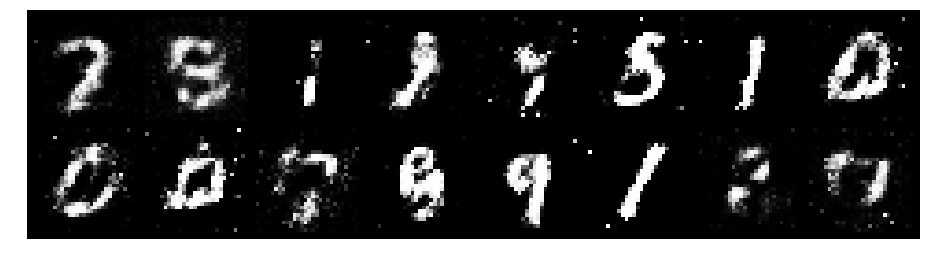

Epoch: [23/200], Batch Num: [500/600]
Discriminator Loss: 0.8103, Generator Loss: 1.7682
D(x): 0.7648, D(G(z)): 0.2626


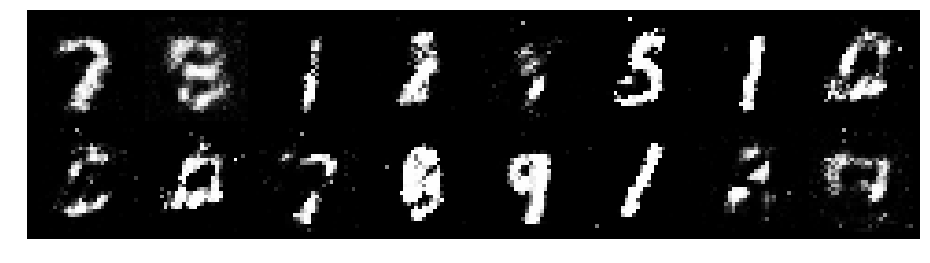

Epoch: [24/200], Batch Num: [0/600]
Discriminator Loss: 0.8896, Generator Loss: 1.5933
D(x): 0.6860, D(G(z)): 0.2992


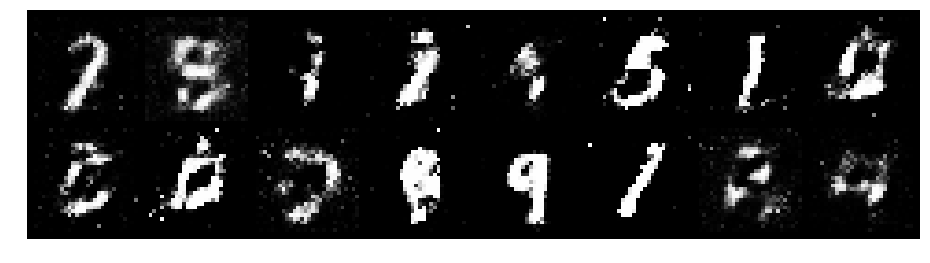

Epoch: [24/200], Batch Num: [100/600]
Discriminator Loss: 1.1386, Generator Loss: 1.0845
D(x): 0.6664, D(G(z)): 0.3828


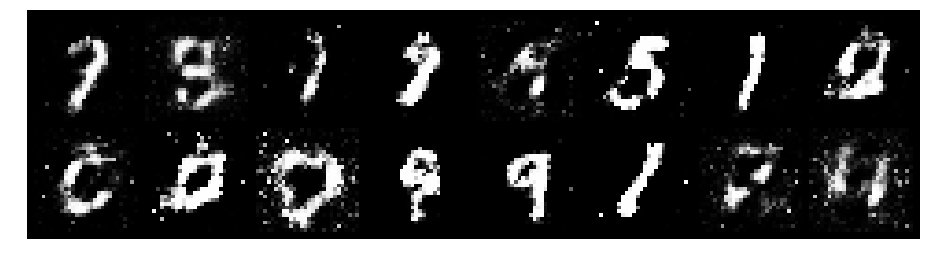

Epoch: [24/200], Batch Num: [200/600]
Discriminator Loss: 1.0534, Generator Loss: 1.2926
D(x): 0.6573, D(G(z)): 0.3314


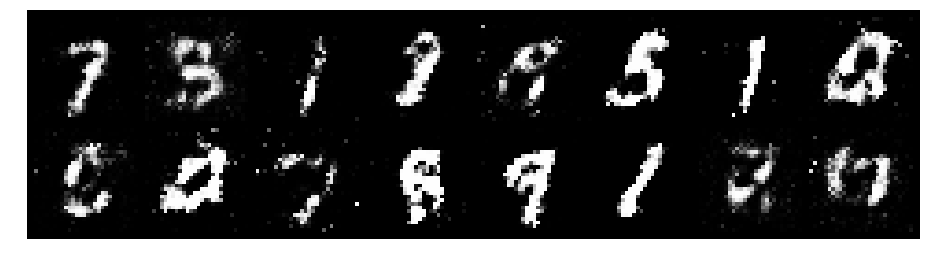

Epoch: [24/200], Batch Num: [300/600]
Discriminator Loss: 0.7331, Generator Loss: 1.5776
D(x): 0.7686, D(G(z)): 0.2836


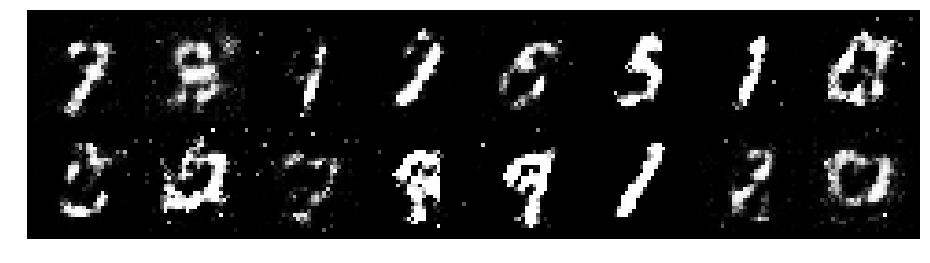

Epoch: [24/200], Batch Num: [400/600]
Discriminator Loss: 0.9839, Generator Loss: 1.8141
D(x): 0.7584, D(G(z)): 0.3643


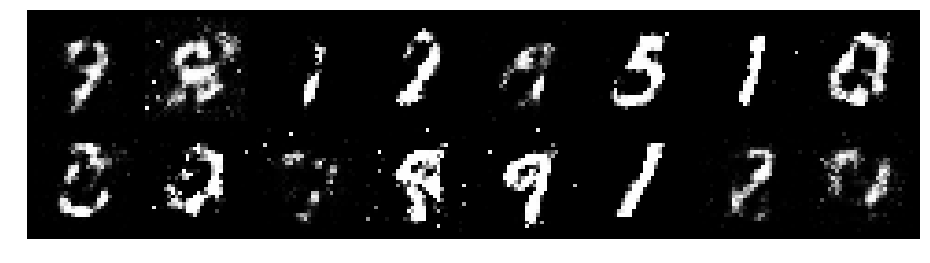

Epoch: [24/200], Batch Num: [500/600]
Discriminator Loss: 0.7998, Generator Loss: 1.5113
D(x): 0.7397, D(G(z)): 0.2802


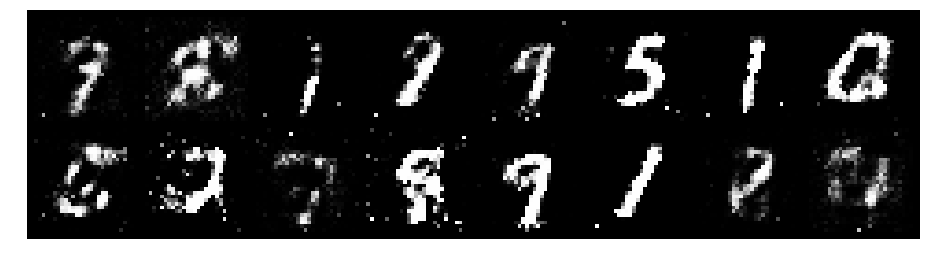

Epoch: [25/200], Batch Num: [0/600]
Discriminator Loss: 0.9200, Generator Loss: 1.2615
D(x): 0.6903, D(G(z)): 0.3119


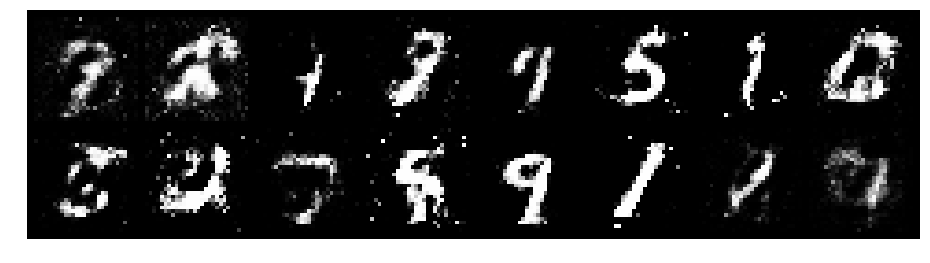

Epoch: [25/200], Batch Num: [100/600]
Discriminator Loss: 1.0239, Generator Loss: 1.0148
D(x): 0.6669, D(G(z)): 0.3829


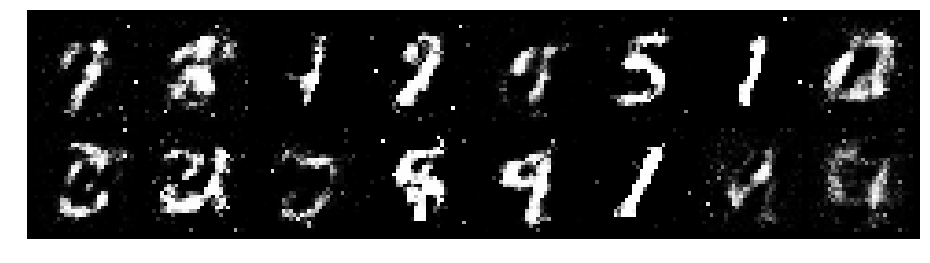

Epoch: [25/200], Batch Num: [200/600]
Discriminator Loss: 1.0634, Generator Loss: 1.3683
D(x): 0.6482, D(G(z)): 0.3513


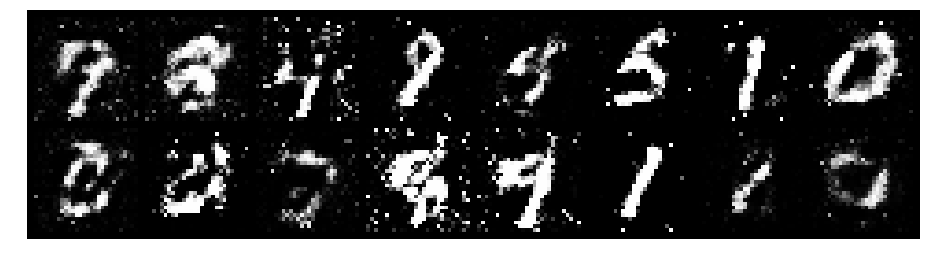

Epoch: [25/200], Batch Num: [300/600]
Discriminator Loss: 1.0526, Generator Loss: 1.6719
D(x): 0.6002, D(G(z)): 0.3003


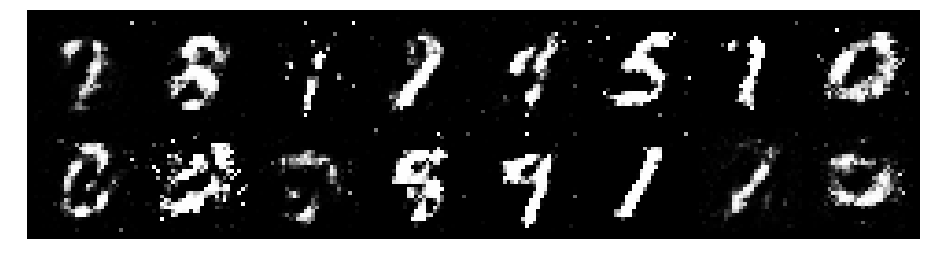

Epoch: [25/200], Batch Num: [400/600]
Discriminator Loss: 1.0397, Generator Loss: 1.6774
D(x): 0.6736, D(G(z)): 0.3325


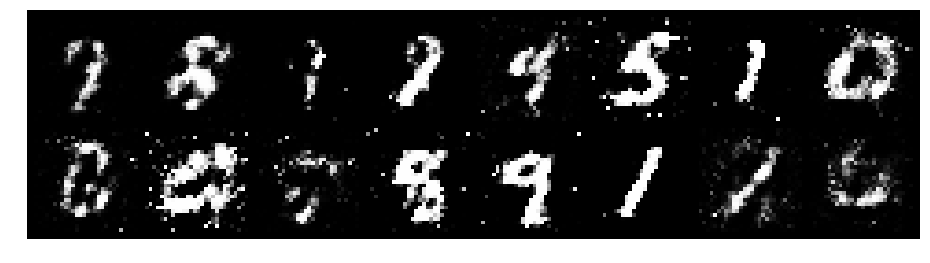

Epoch: [25/200], Batch Num: [500/600]
Discriminator Loss: 0.9764, Generator Loss: 1.4058
D(x): 0.7093, D(G(z)): 0.3525


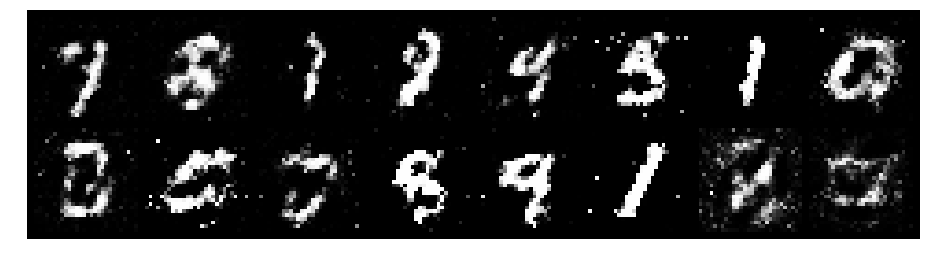

Epoch: [26/200], Batch Num: [0/600]
Discriminator Loss: 0.8195, Generator Loss: 1.8391
D(x): 0.7240, D(G(z)): 0.2914


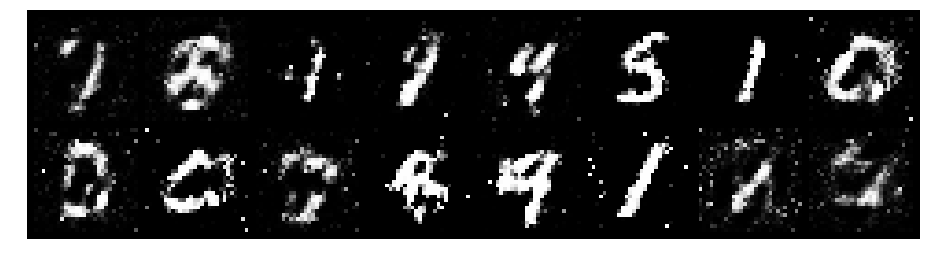

Epoch: [26/200], Batch Num: [100/600]
Discriminator Loss: 0.8097, Generator Loss: 1.7788
D(x): 0.7077, D(G(z)): 0.2837


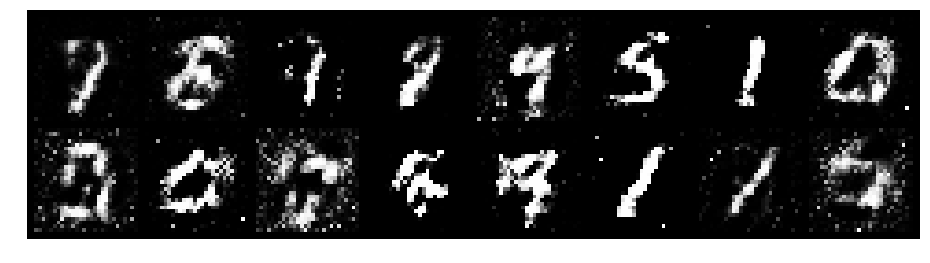

Epoch: [26/200], Batch Num: [200/600]
Discriminator Loss: 0.9218, Generator Loss: 1.6284
D(x): 0.6553, D(G(z)): 0.2772


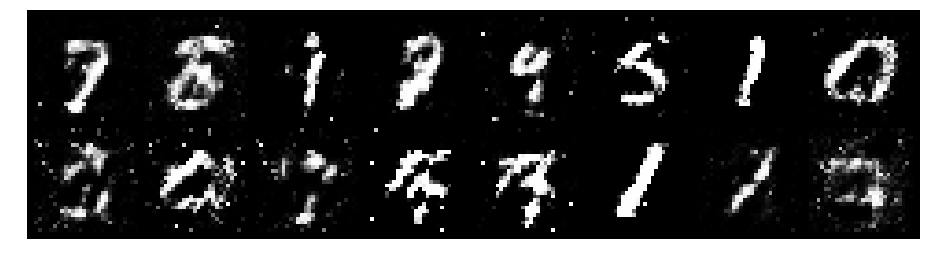

Epoch: [26/200], Batch Num: [300/600]
Discriminator Loss: 1.0144, Generator Loss: 2.0767
D(x): 0.7202, D(G(z)): 0.3618


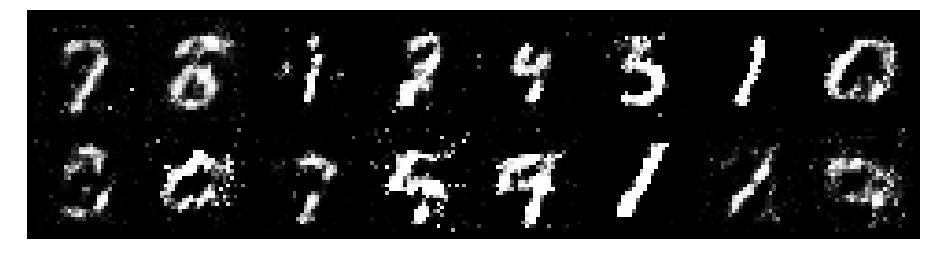

Epoch: [26/200], Batch Num: [400/600]
Discriminator Loss: 1.0564, Generator Loss: 1.5805
D(x): 0.6578, D(G(z)): 0.3027


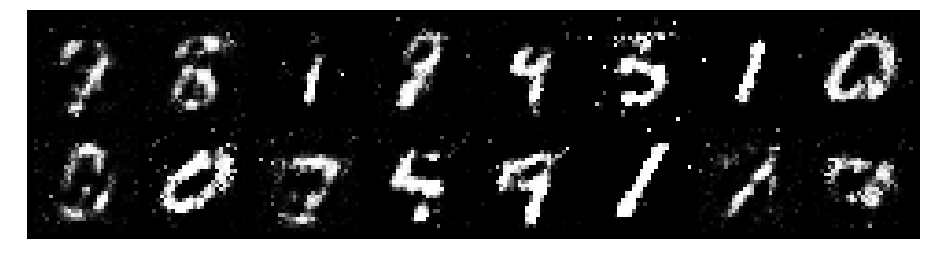

Epoch: [26/200], Batch Num: [500/600]
Discriminator Loss: 1.0136, Generator Loss: 0.9270
D(x): 0.7210, D(G(z)): 0.3852


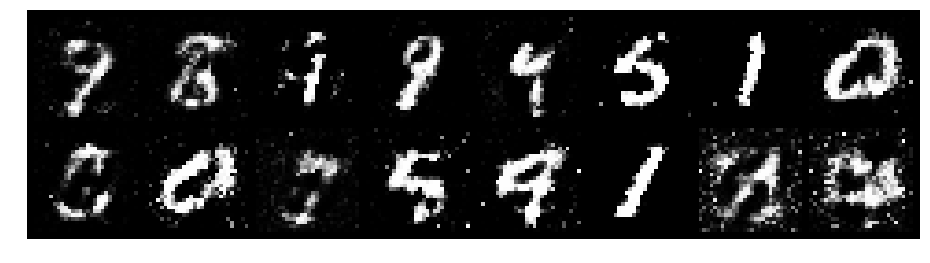

Epoch: [27/200], Batch Num: [0/600]
Discriminator Loss: 0.9384, Generator Loss: 1.5098
D(x): 0.7409, D(G(z)): 0.3653


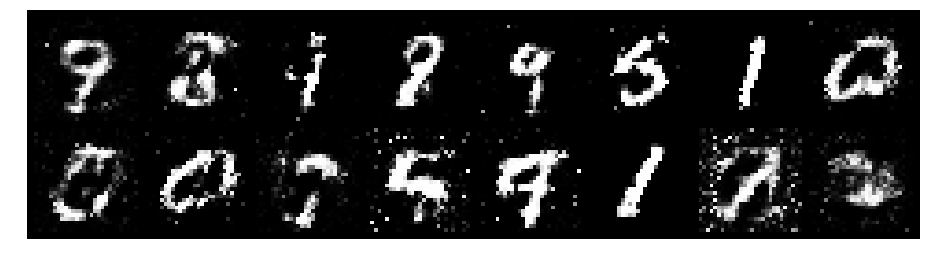

Epoch: [27/200], Batch Num: [100/600]
Discriminator Loss: 1.0669, Generator Loss: 1.5699
D(x): 0.6384, D(G(z)): 0.2957


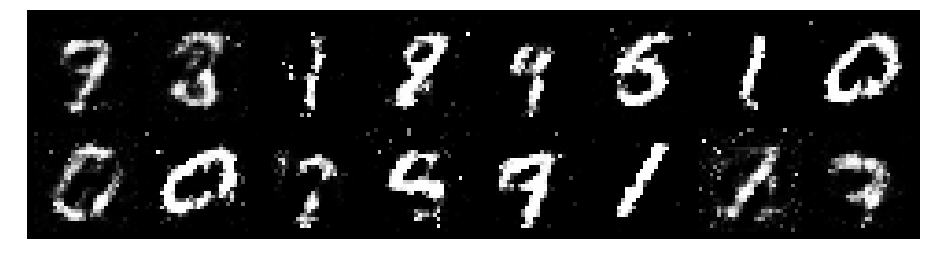

Epoch: [27/200], Batch Num: [200/600]
Discriminator Loss: 0.9409, Generator Loss: 1.3749
D(x): 0.6852, D(G(z)): 0.3083


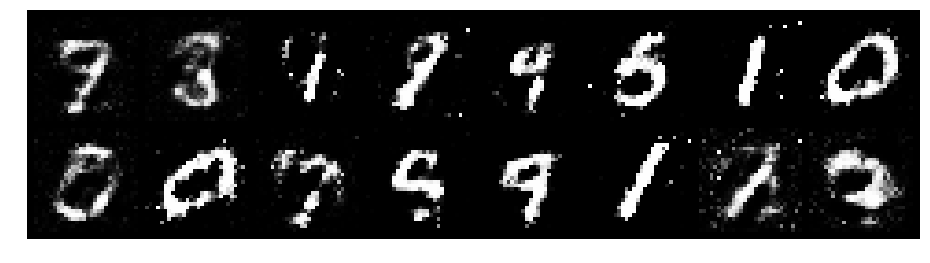

Epoch: [27/200], Batch Num: [300/600]
Discriminator Loss: 0.9426, Generator Loss: 1.6195
D(x): 0.7019, D(G(z)): 0.3203


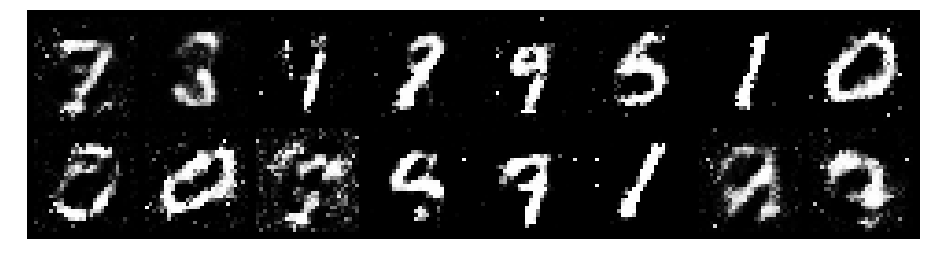

Epoch: [27/200], Batch Num: [400/600]
Discriminator Loss: 1.0900, Generator Loss: 1.4222
D(x): 0.6436, D(G(z)): 0.3541


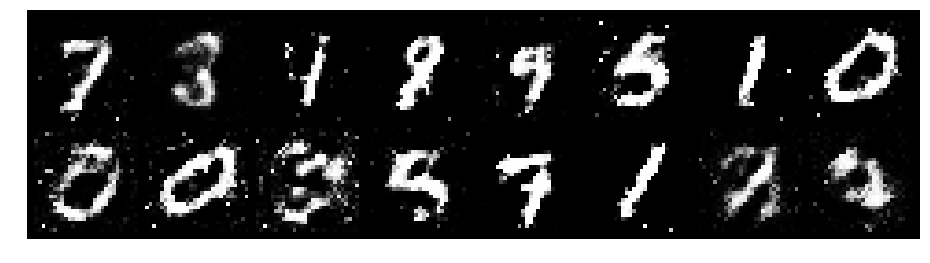

Epoch: [27/200], Batch Num: [500/600]
Discriminator Loss: 1.0287, Generator Loss: 2.0788
D(x): 0.7296, D(G(z)): 0.3595


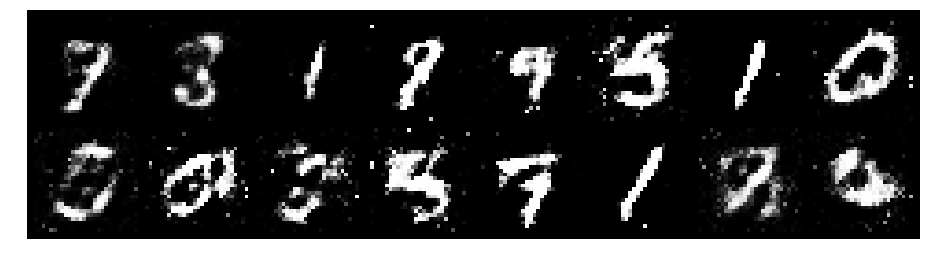

Epoch: [28/200], Batch Num: [0/600]
Discriminator Loss: 1.0109, Generator Loss: 1.4723
D(x): 0.6747, D(G(z)): 0.3312


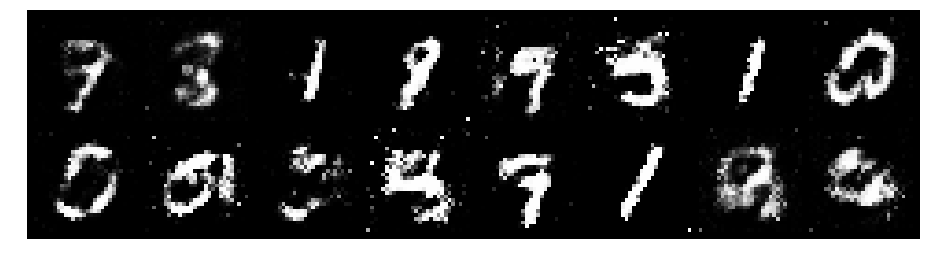

Epoch: [28/200], Batch Num: [100/600]
Discriminator Loss: 1.0470, Generator Loss: 1.6047
D(x): 0.7253, D(G(z)): 0.3297


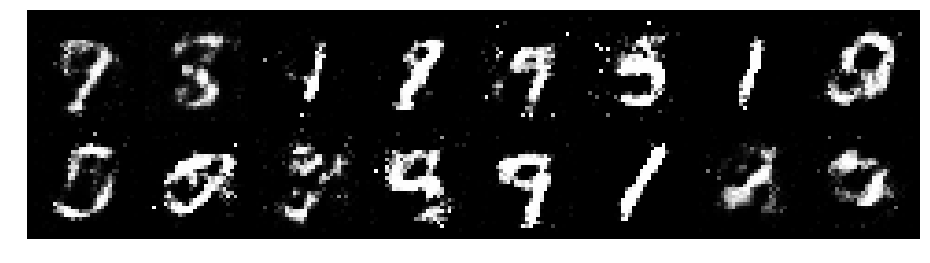

Epoch: [28/200], Batch Num: [200/600]
Discriminator Loss: 1.2084, Generator Loss: 1.3107
D(x): 0.5843, D(G(z)): 0.3289


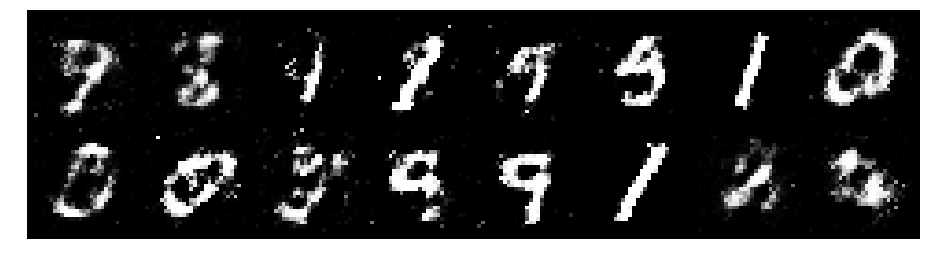

Epoch: [28/200], Batch Num: [300/600]
Discriminator Loss: 0.9138, Generator Loss: 1.5766
D(x): 0.6777, D(G(z)): 0.3122


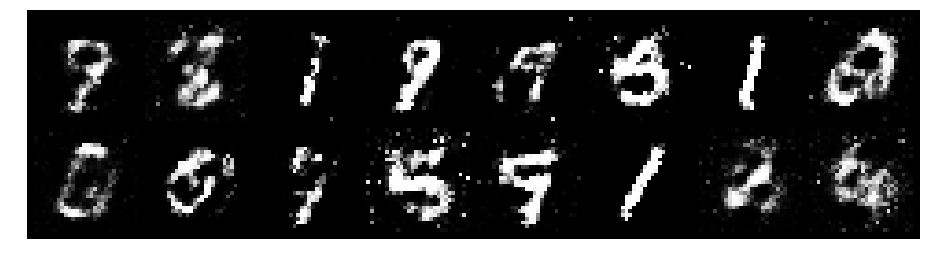

Epoch: [28/200], Batch Num: [400/600]
Discriminator Loss: 1.0476, Generator Loss: 1.5708
D(x): 0.5926, D(G(z)): 0.2826


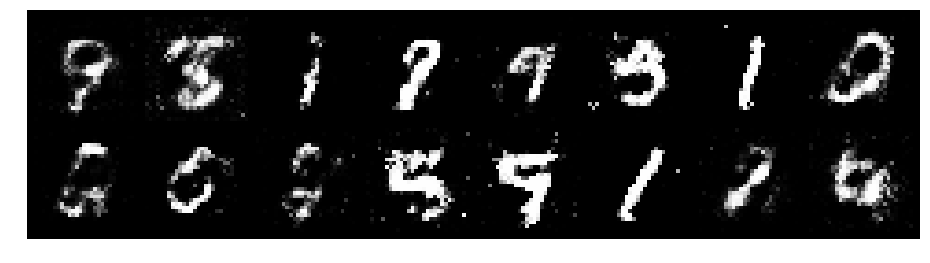

Epoch: [28/200], Batch Num: [500/600]
Discriminator Loss: 0.8643, Generator Loss: 1.4880
D(x): 0.6771, D(G(z)): 0.2723


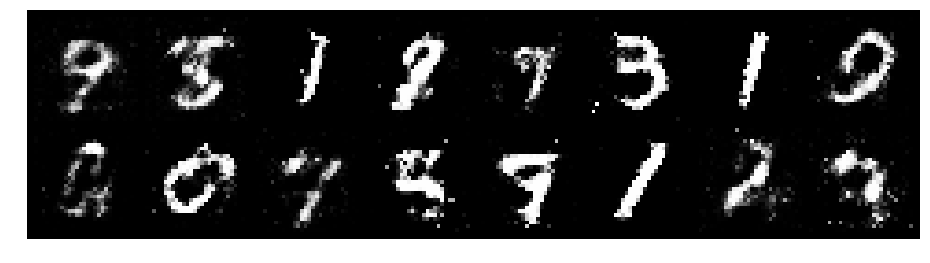

Epoch: [29/200], Batch Num: [0/600]
Discriminator Loss: 1.1199, Generator Loss: 1.0110
D(x): 0.6300, D(G(z)): 0.4082


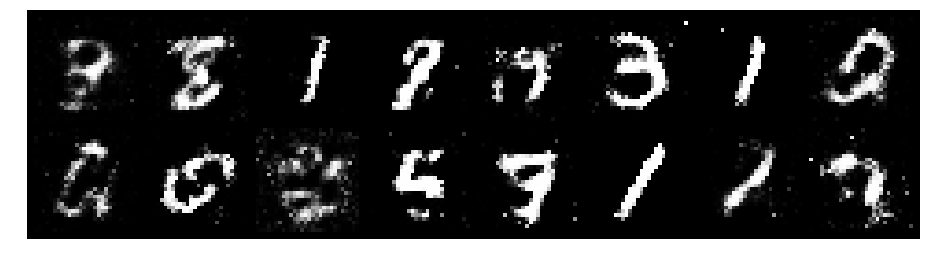

Epoch: [29/200], Batch Num: [100/600]
Discriminator Loss: 0.9487, Generator Loss: 1.6143
D(x): 0.6747, D(G(z)): 0.3025


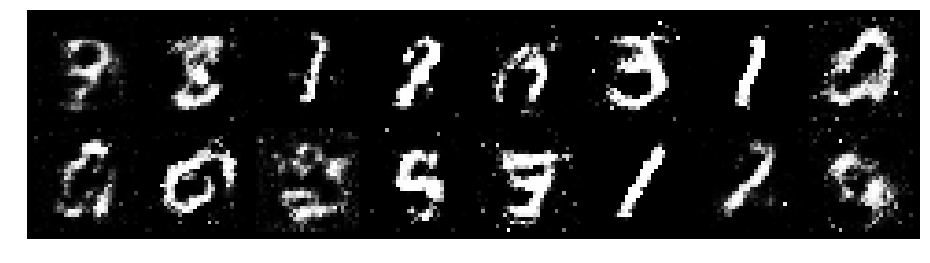

Epoch: [29/200], Batch Num: [200/600]
Discriminator Loss: 0.9093, Generator Loss: 1.7464
D(x): 0.7369, D(G(z)): 0.3380


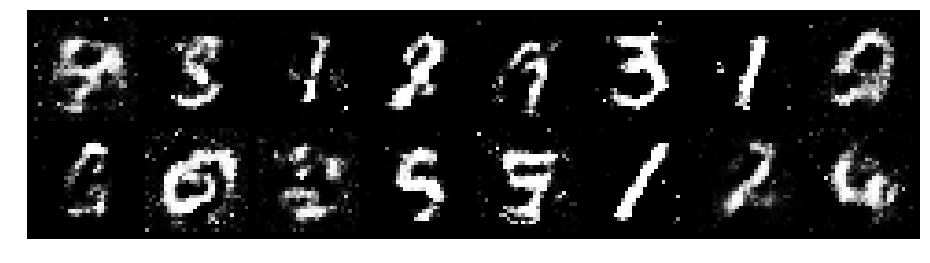

Epoch: [29/200], Batch Num: [300/600]
Discriminator Loss: 0.9558, Generator Loss: 1.5974
D(x): 0.7210, D(G(z)): 0.3362


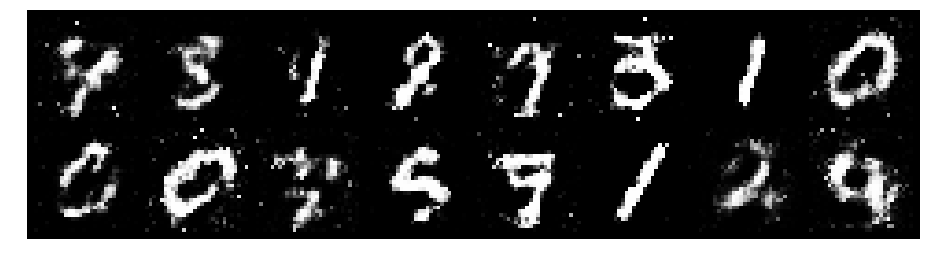

Epoch: [29/200], Batch Num: [400/600]
Discriminator Loss: 1.0378, Generator Loss: 1.3538
D(x): 0.6875, D(G(z)): 0.3487


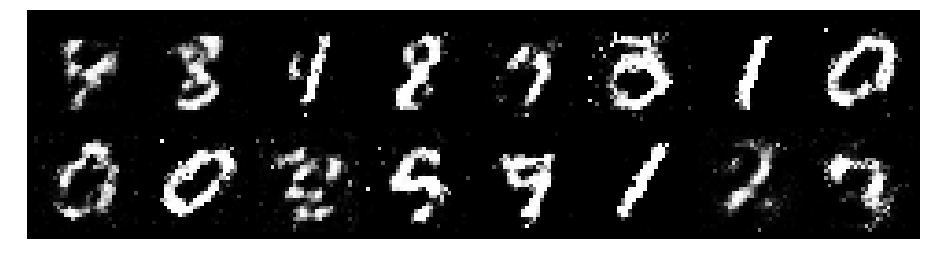

Epoch: [29/200], Batch Num: [500/600]
Discriminator Loss: 0.9184, Generator Loss: 1.3087
D(x): 0.6562, D(G(z)): 0.2863


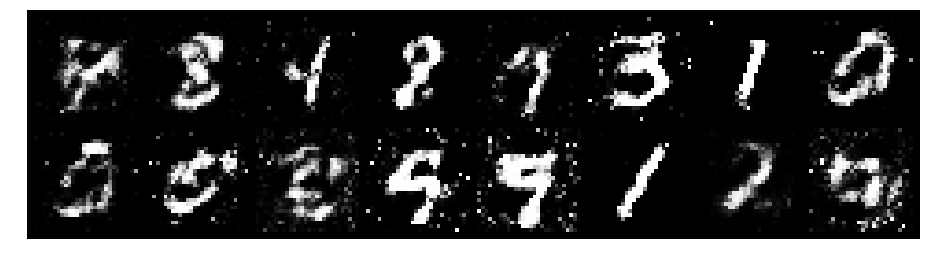

Epoch: [30/200], Batch Num: [0/600]
Discriminator Loss: 0.8664, Generator Loss: 1.3980
D(x): 0.6813, D(G(z)): 0.2779


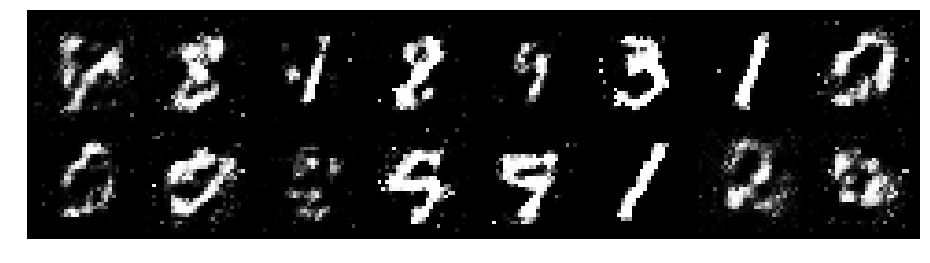

Epoch: [30/200], Batch Num: [100/600]
Discriminator Loss: 0.8472, Generator Loss: 1.4210
D(x): 0.6888, D(G(z)): 0.2980


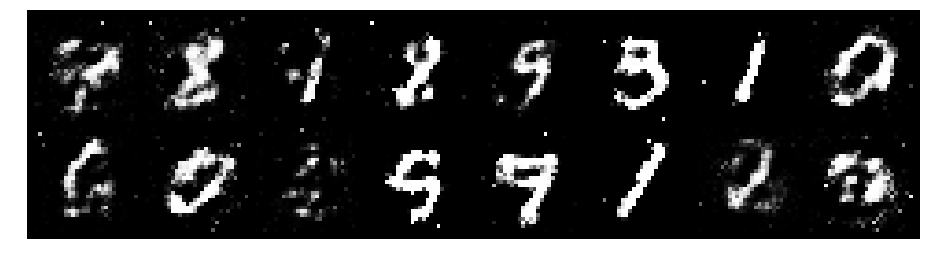

Epoch: [30/200], Batch Num: [200/600]
Discriminator Loss: 1.0516, Generator Loss: 1.4736
D(x): 0.6378, D(G(z)): 0.2885


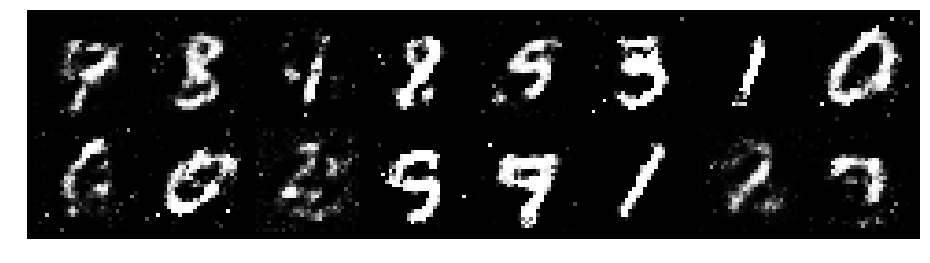

Epoch: [30/200], Batch Num: [300/600]
Discriminator Loss: 1.1610, Generator Loss: 1.3483
D(x): 0.6182, D(G(z)): 0.3637


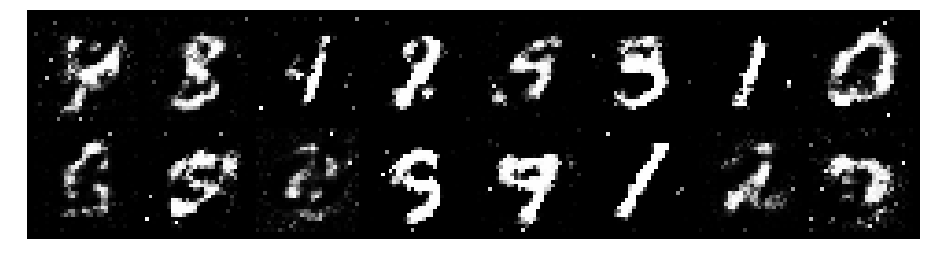

Epoch: [30/200], Batch Num: [400/600]
Discriminator Loss: 0.9455, Generator Loss: 1.2741
D(x): 0.6805, D(G(z)): 0.3472


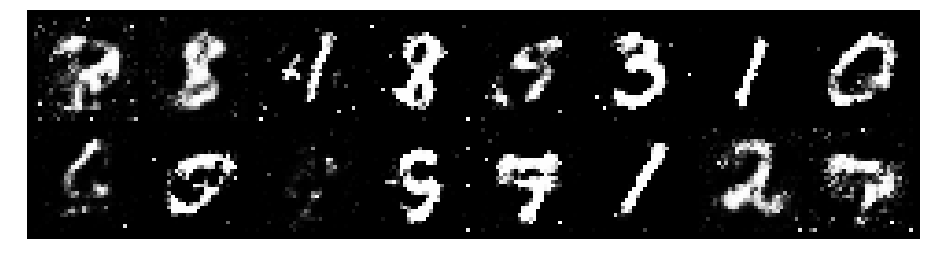

Epoch: [30/200], Batch Num: [500/600]
Discriminator Loss: 0.9724, Generator Loss: 1.4586
D(x): 0.6524, D(G(z)): 0.3063


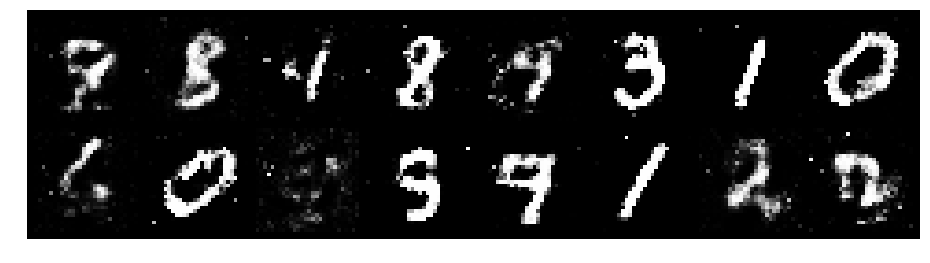

Epoch: [31/200], Batch Num: [0/600]
Discriminator Loss: 1.0776, Generator Loss: 1.5173
D(x): 0.6490, D(G(z)): 0.3352


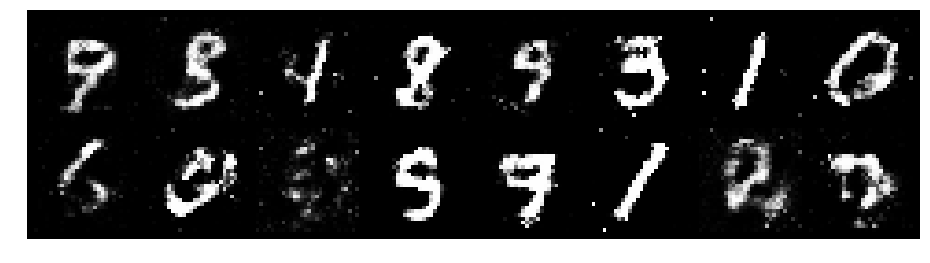

Epoch: [31/200], Batch Num: [100/600]
Discriminator Loss: 1.0524, Generator Loss: 1.4093
D(x): 0.6586, D(G(z)): 0.3510


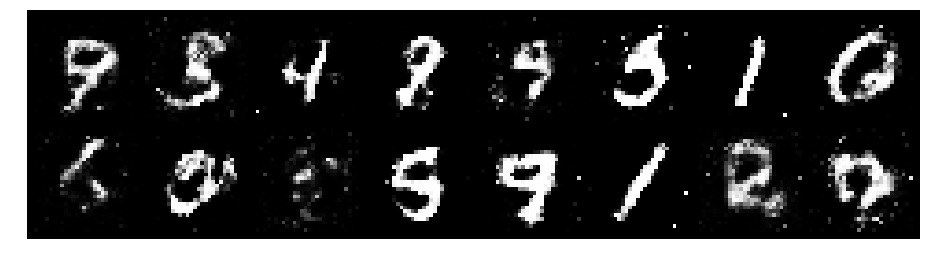

Epoch: [31/200], Batch Num: [200/600]
Discriminator Loss: 1.0821, Generator Loss: 1.2702
D(x): 0.6380, D(G(z)): 0.3664


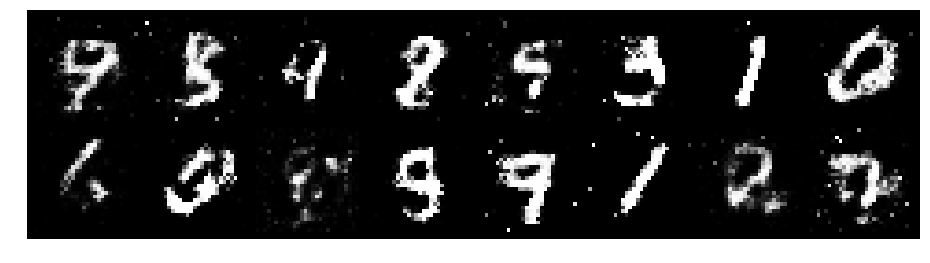

Epoch: [31/200], Batch Num: [300/600]
Discriminator Loss: 0.8836, Generator Loss: 1.5545
D(x): 0.6755, D(G(z)): 0.2583


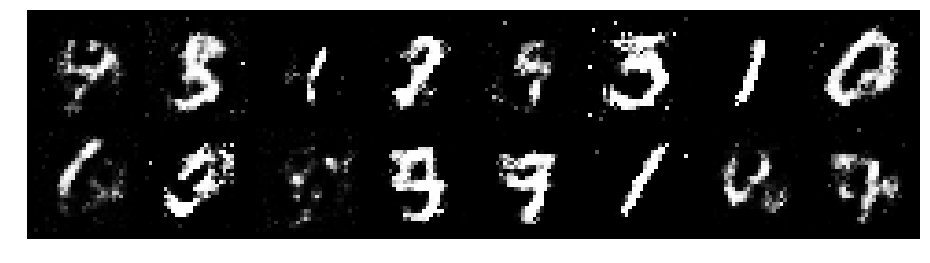

Epoch: [31/200], Batch Num: [400/600]
Discriminator Loss: 0.9390, Generator Loss: 1.1298
D(x): 0.6873, D(G(z)): 0.3410


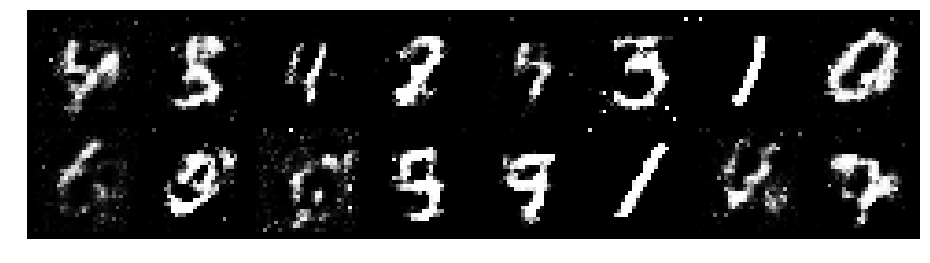

Epoch: [31/200], Batch Num: [500/600]
Discriminator Loss: 0.9883, Generator Loss: 1.3649
D(x): 0.7310, D(G(z)): 0.3998


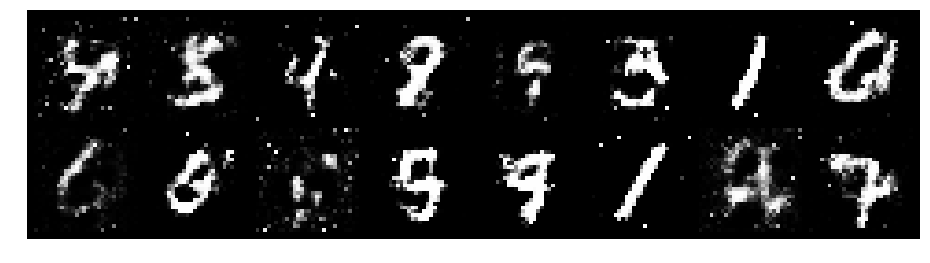

Epoch: [32/200], Batch Num: [0/600]
Discriminator Loss: 0.8587, Generator Loss: 1.5625
D(x): 0.7158, D(G(z)): 0.3266


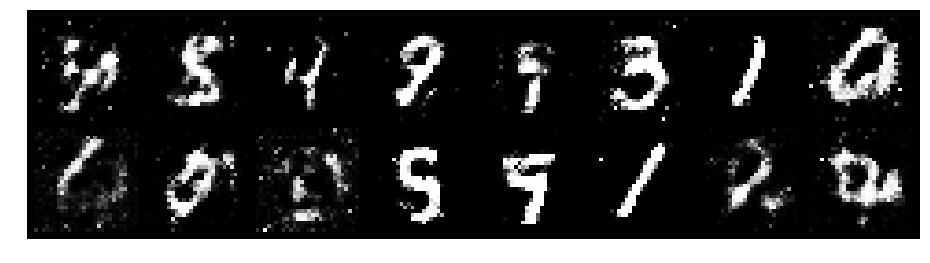

Epoch: [32/200], Batch Num: [100/600]
Discriminator Loss: 0.8880, Generator Loss: 1.5286
D(x): 0.7495, D(G(z)): 0.3652


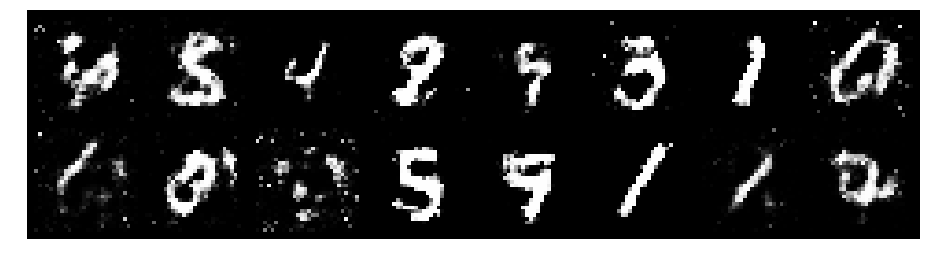

Epoch: [32/200], Batch Num: [200/600]
Discriminator Loss: 0.9262, Generator Loss: 1.2959
D(x): 0.6606, D(G(z)): 0.2956


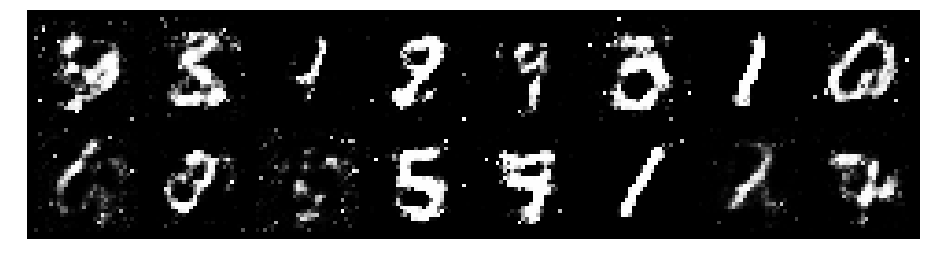

Epoch: [32/200], Batch Num: [300/600]
Discriminator Loss: 0.9874, Generator Loss: 1.3860
D(x): 0.6476, D(G(z)): 0.2754


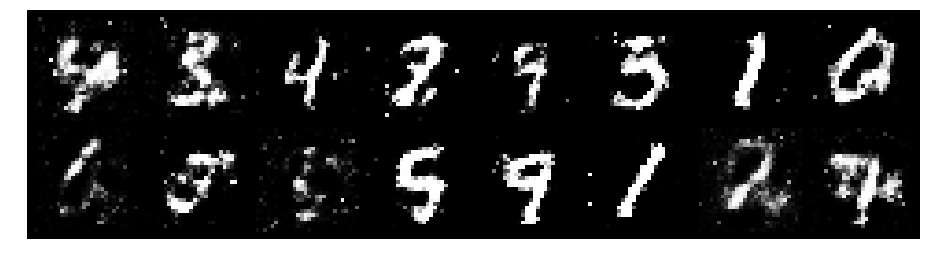

Epoch: [32/200], Batch Num: [400/600]
Discriminator Loss: 1.1182, Generator Loss: 1.2467
D(x): 0.6306, D(G(z)): 0.3487


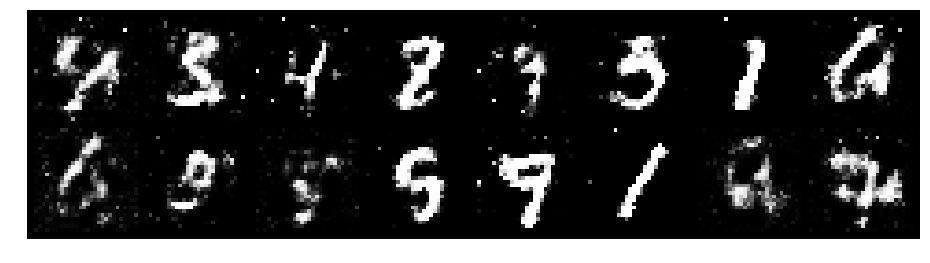

Epoch: [32/200], Batch Num: [500/600]
Discriminator Loss: 0.9357, Generator Loss: 1.3753
D(x): 0.6925, D(G(z)): 0.3162


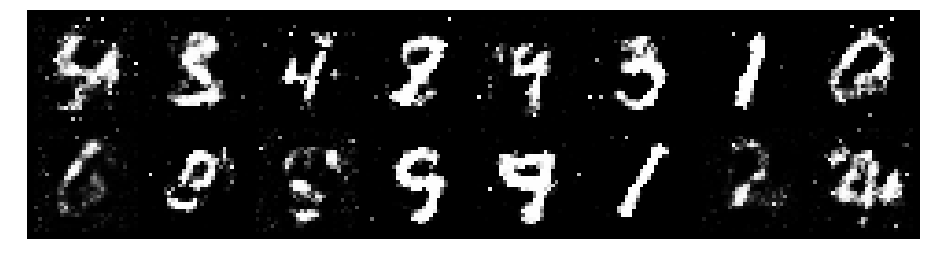

Epoch: [33/200], Batch Num: [0/600]
Discriminator Loss: 0.9988, Generator Loss: 1.1837
D(x): 0.6800, D(G(z)): 0.3677


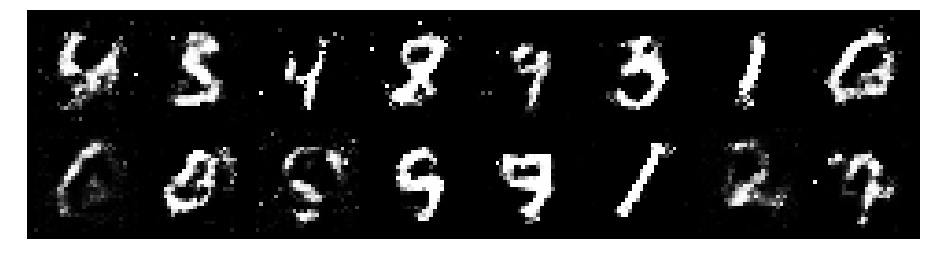

Epoch: [33/200], Batch Num: [100/600]
Discriminator Loss: 1.0349, Generator Loss: 1.4256
D(x): 0.6210, D(G(z)): 0.2881


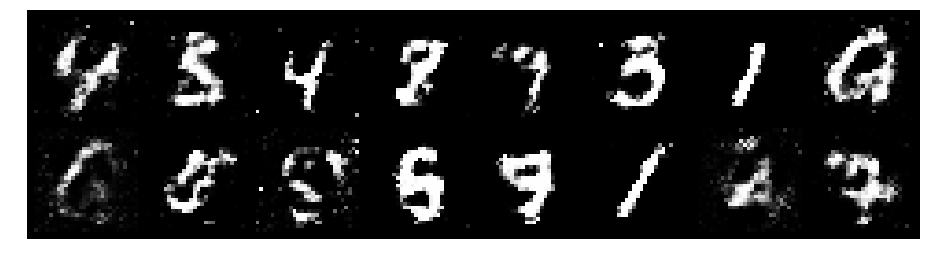

Epoch: [33/200], Batch Num: [200/600]
Discriminator Loss: 1.0021, Generator Loss: 1.5199
D(x): 0.7221, D(G(z)): 0.3763


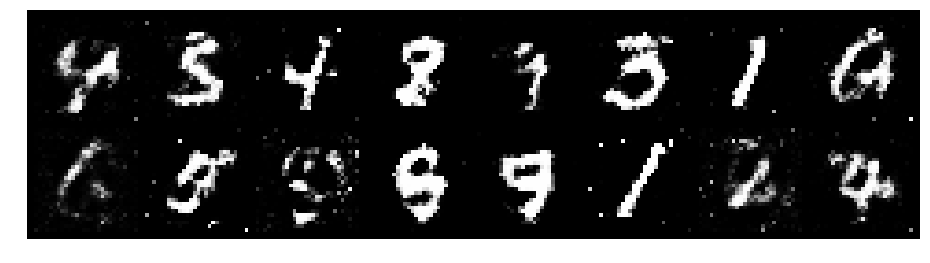

Epoch: [33/200], Batch Num: [300/600]
Discriminator Loss: 0.8631, Generator Loss: 1.4676
D(x): 0.7410, D(G(z)): 0.3451


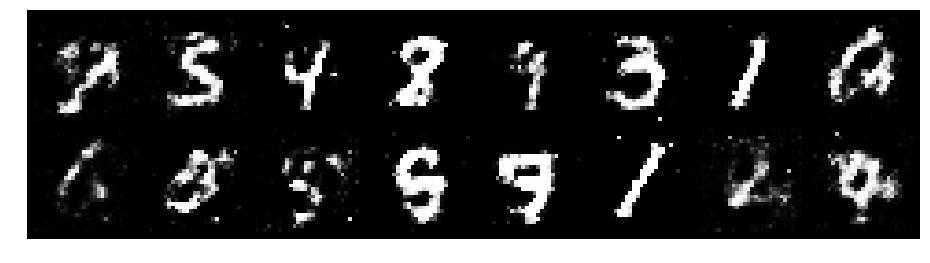

Epoch: [33/200], Batch Num: [400/600]
Discriminator Loss: 1.0125, Generator Loss: 1.2513
D(x): 0.6211, D(G(z)): 0.3192


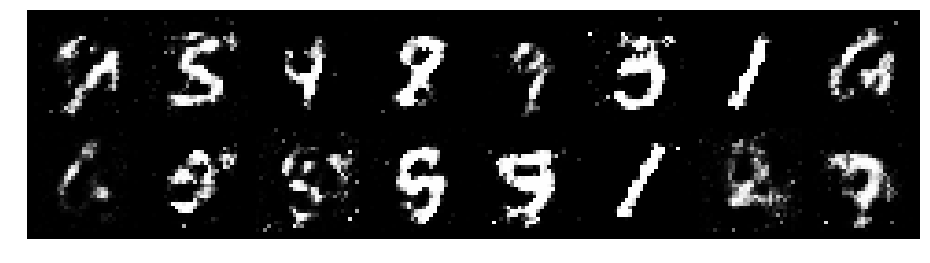

Epoch: [33/200], Batch Num: [500/600]
Discriminator Loss: 0.9955, Generator Loss: 1.1201
D(x): 0.6524, D(G(z)): 0.3102


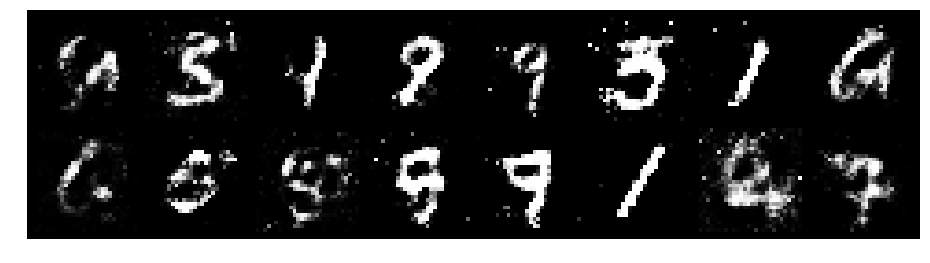

Epoch: [34/200], Batch Num: [0/600]
Discriminator Loss: 1.1593, Generator Loss: 1.0501
D(x): 0.6514, D(G(z)): 0.3999


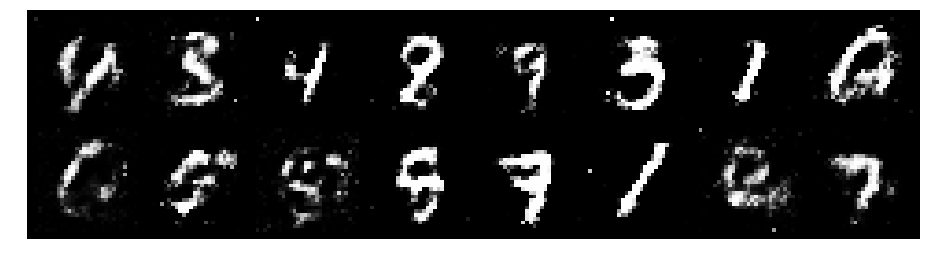

Epoch: [34/200], Batch Num: [100/600]
Discriminator Loss: 0.9447, Generator Loss: 1.3881
D(x): 0.6827, D(G(z)): 0.3510


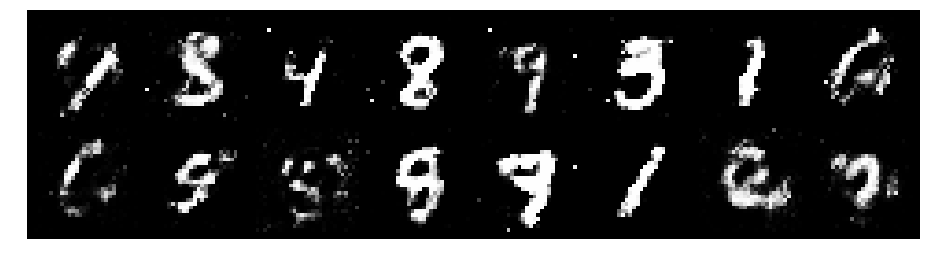

Epoch: [34/200], Batch Num: [200/600]
Discriminator Loss: 1.0263, Generator Loss: 1.0829
D(x): 0.6655, D(G(z)): 0.3594


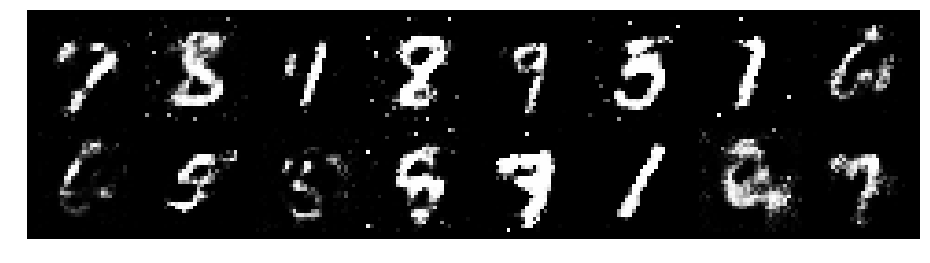

Epoch: [34/200], Batch Num: [300/600]
Discriminator Loss: 1.1632, Generator Loss: 1.4255
D(x): 0.6352, D(G(z)): 0.2947


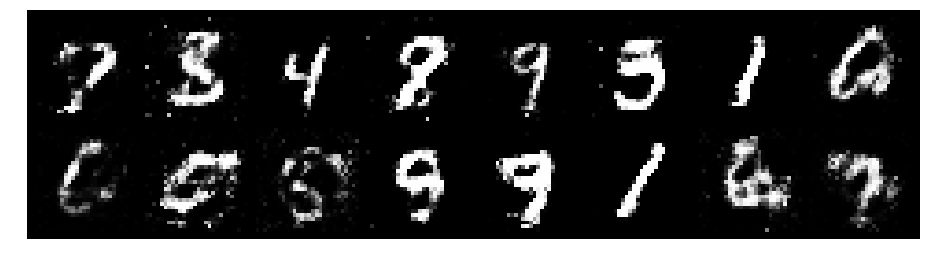

Epoch: [34/200], Batch Num: [400/600]
Discriminator Loss: 1.0197, Generator Loss: 1.4725
D(x): 0.6746, D(G(z)): 0.3256


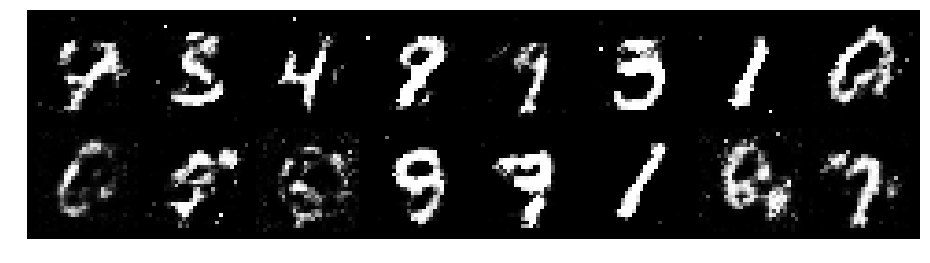

Epoch: [34/200], Batch Num: [500/600]
Discriminator Loss: 1.1002, Generator Loss: 1.3348
D(x): 0.5980, D(G(z)): 0.3425


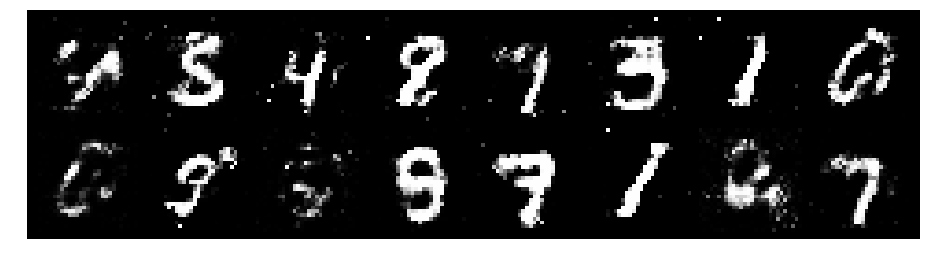

Epoch: [35/200], Batch Num: [0/600]
Discriminator Loss: 1.0170, Generator Loss: 1.3124
D(x): 0.6485, D(G(z)): 0.3263


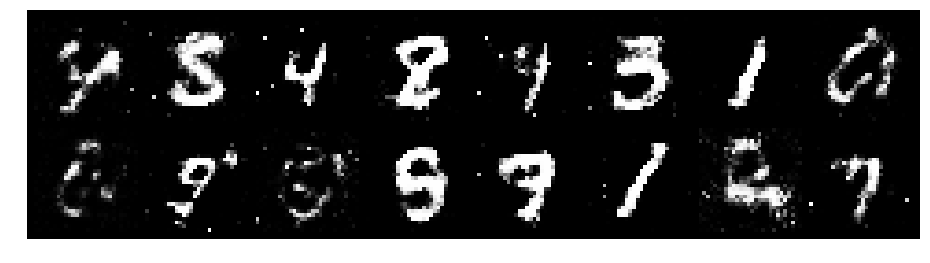

Epoch: [35/200], Batch Num: [100/600]
Discriminator Loss: 1.0565, Generator Loss: 1.1338
D(x): 0.6044, D(G(z)): 0.3731


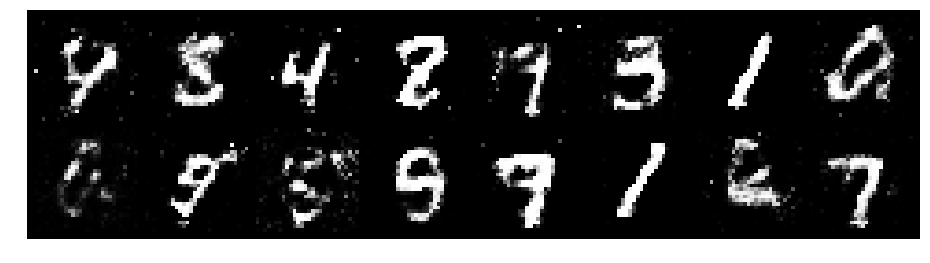

Epoch: [35/200], Batch Num: [200/600]
Discriminator Loss: 1.0866, Generator Loss: 1.3042
D(x): 0.5663, D(G(z)): 0.3186


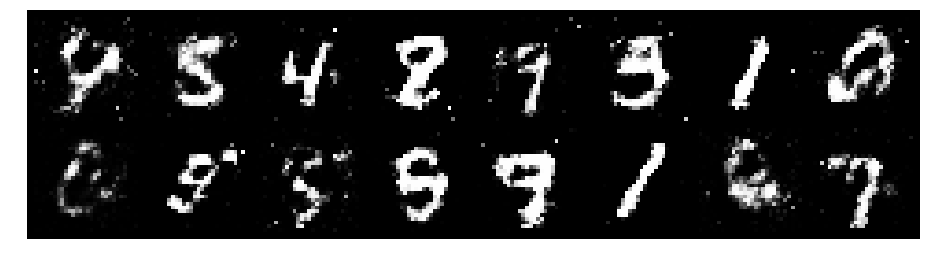

Epoch: [35/200], Batch Num: [300/600]
Discriminator Loss: 1.1507, Generator Loss: 1.0369
D(x): 0.6040, D(G(z)): 0.3847


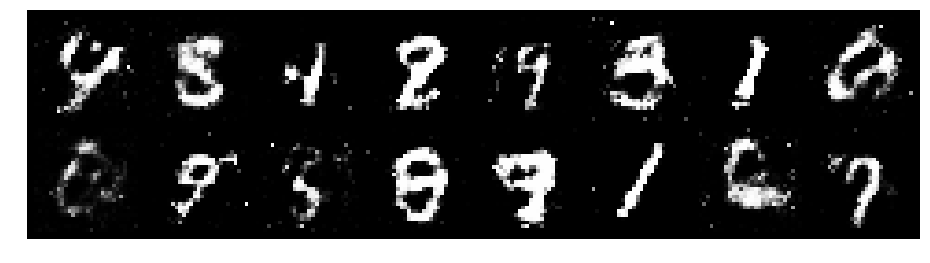

Epoch: [35/200], Batch Num: [400/600]
Discriminator Loss: 1.0209, Generator Loss: 1.6301
D(x): 0.6351, D(G(z)): 0.3289


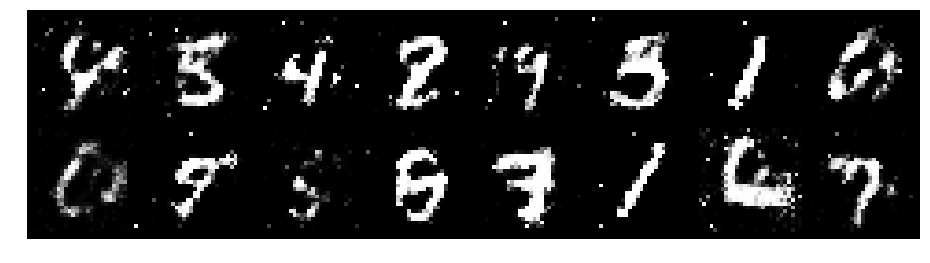

Epoch: [35/200], Batch Num: [500/600]
Discriminator Loss: 1.0553, Generator Loss: 1.4353
D(x): 0.6313, D(G(z)): 0.3226


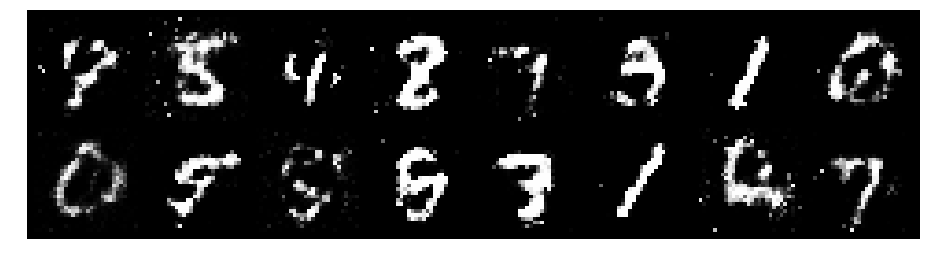

Epoch: [36/200], Batch Num: [0/600]
Discriminator Loss: 1.1497, Generator Loss: 1.2697
D(x): 0.6528, D(G(z)): 0.3935


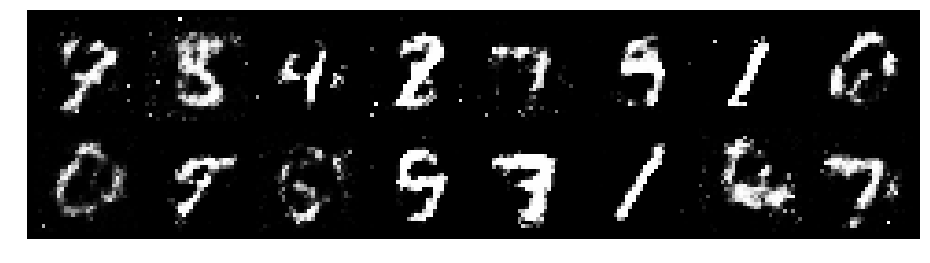

Epoch: [36/200], Batch Num: [100/600]
Discriminator Loss: 1.1578, Generator Loss: 1.2834
D(x): 0.6284, D(G(z)): 0.3882


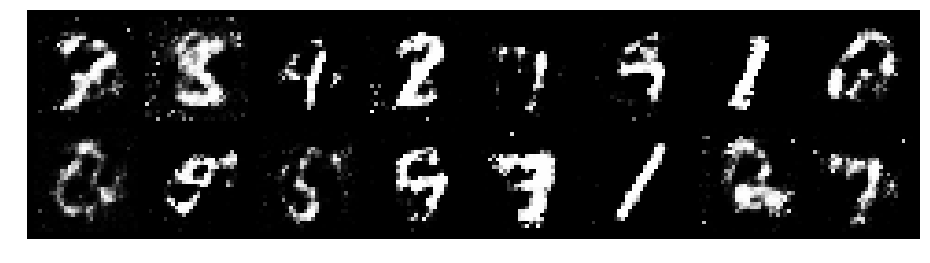

Epoch: [36/200], Batch Num: [200/600]
Discriminator Loss: 1.0785, Generator Loss: 1.3117
D(x): 0.6617, D(G(z)): 0.3858


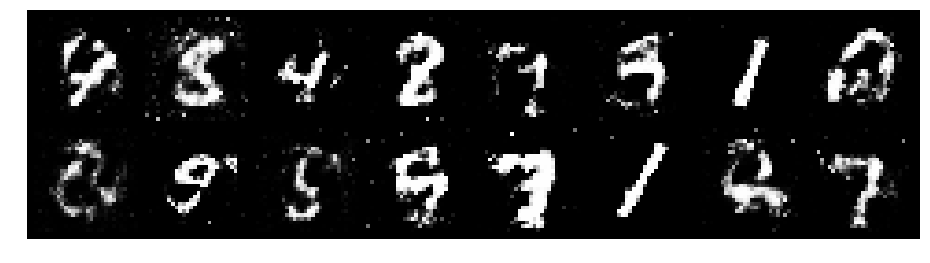

Epoch: [36/200], Batch Num: [300/600]
Discriminator Loss: 1.0534, Generator Loss: 1.3581
D(x): 0.6743, D(G(z)): 0.3799


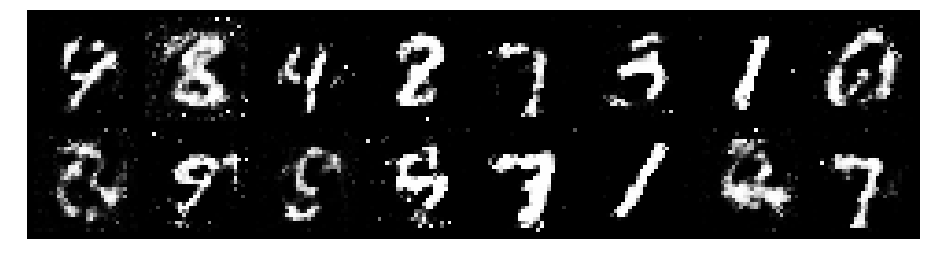

Epoch: [36/200], Batch Num: [400/600]
Discriminator Loss: 0.8439, Generator Loss: 1.8456
D(x): 0.6645, D(G(z)): 0.2489


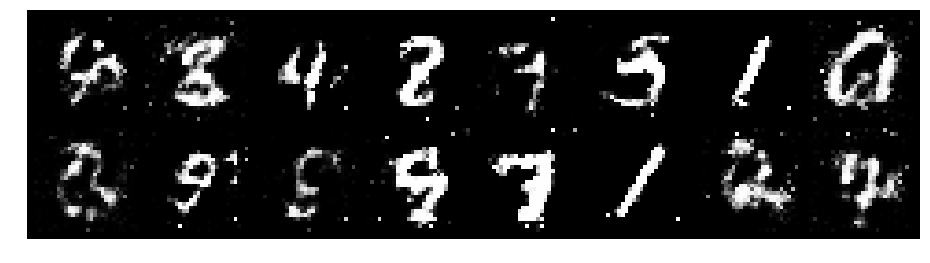

Epoch: [36/200], Batch Num: [500/600]
Discriminator Loss: 0.8529, Generator Loss: 1.5617
D(x): 0.7096, D(G(z)): 0.2868


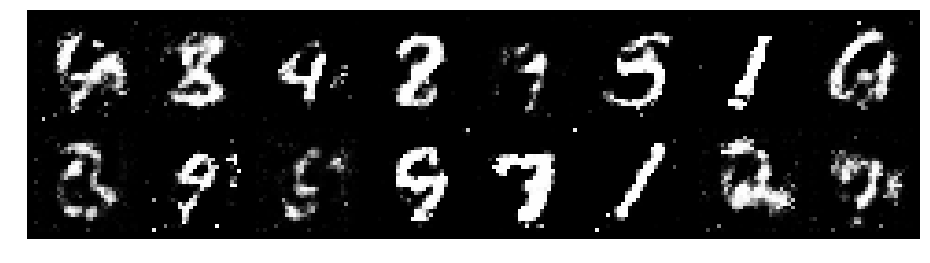

Epoch: [37/200], Batch Num: [0/600]
Discriminator Loss: 1.3148, Generator Loss: 1.3764
D(x): 0.5336, D(G(z)): 0.3270


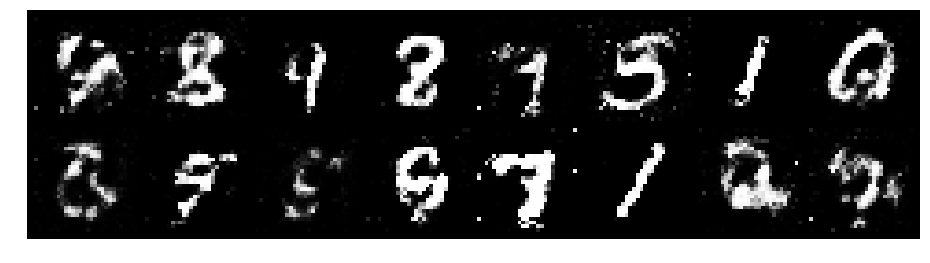

Epoch: [37/200], Batch Num: [100/600]
Discriminator Loss: 1.2262, Generator Loss: 0.9208
D(x): 0.6102, D(G(z)): 0.4394


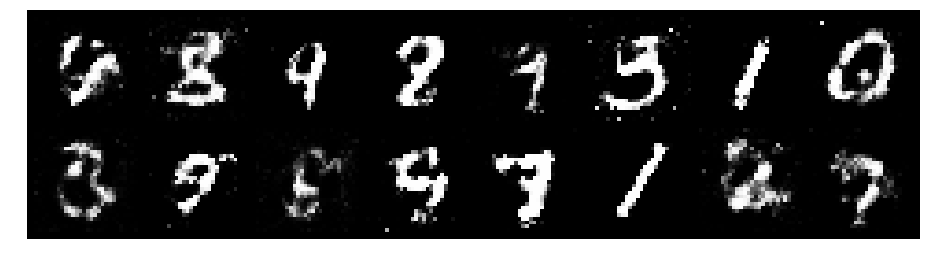

Epoch: [37/200], Batch Num: [200/600]
Discriminator Loss: 1.0921, Generator Loss: 1.0755
D(x): 0.6116, D(G(z)): 0.3795


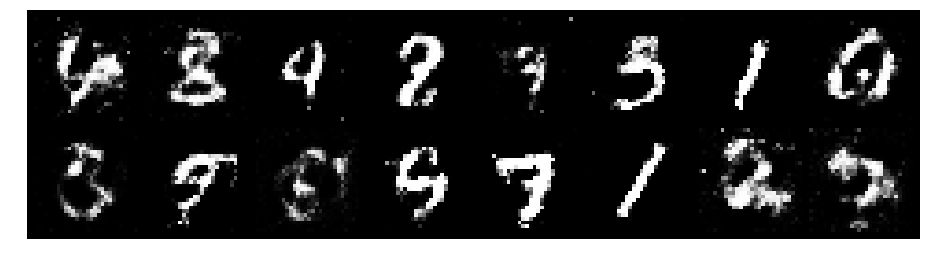

Epoch: [37/200], Batch Num: [300/600]
Discriminator Loss: 1.1563, Generator Loss: 1.1059
D(x): 0.6010, D(G(z)): 0.4036


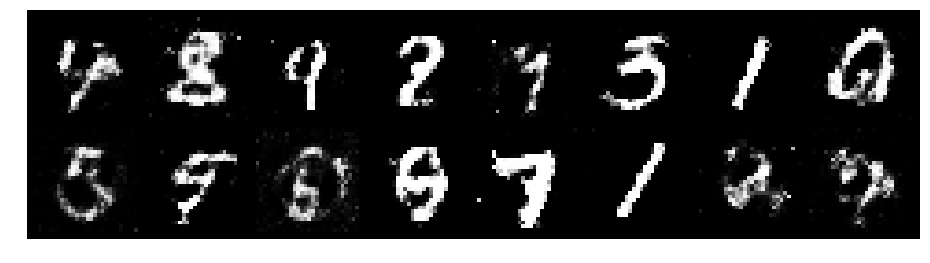

Epoch: [37/200], Batch Num: [400/600]
Discriminator Loss: 1.1991, Generator Loss: 1.1165
D(x): 0.5902, D(G(z)): 0.3965


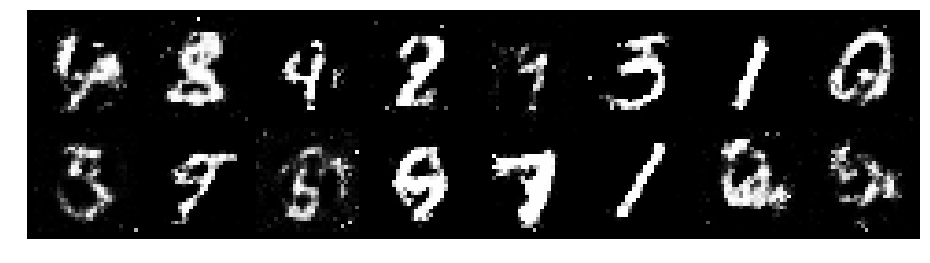

Epoch: [37/200], Batch Num: [500/600]
Discriminator Loss: 1.1759, Generator Loss: 1.1306
D(x): 0.6025, D(G(z)): 0.3838


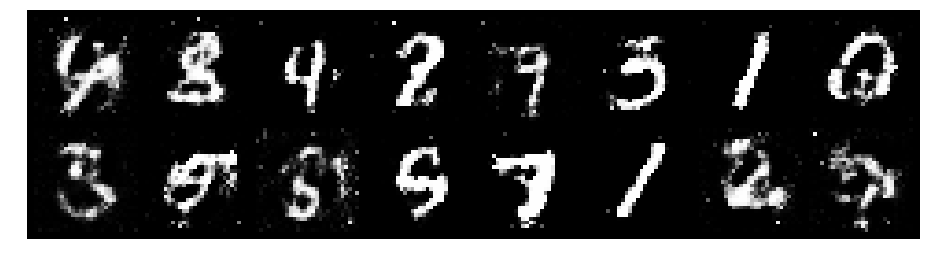

Epoch: [38/200], Batch Num: [0/600]
Discriminator Loss: 1.1201, Generator Loss: 1.1472
D(x): 0.6195, D(G(z)): 0.3824


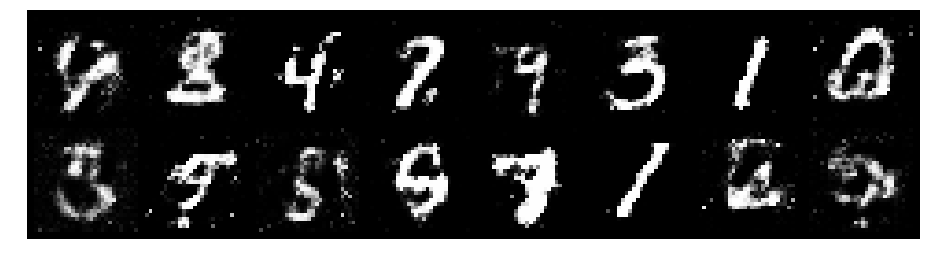

Epoch: [38/200], Batch Num: [100/600]
Discriminator Loss: 1.0389, Generator Loss: 1.3623
D(x): 0.6936, D(G(z)): 0.3570


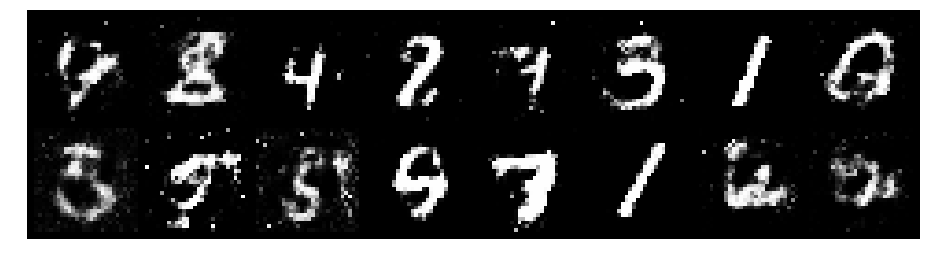

Epoch: [38/200], Batch Num: [200/600]
Discriminator Loss: 0.8102, Generator Loss: 1.5004
D(x): 0.6987, D(G(z)): 0.2872


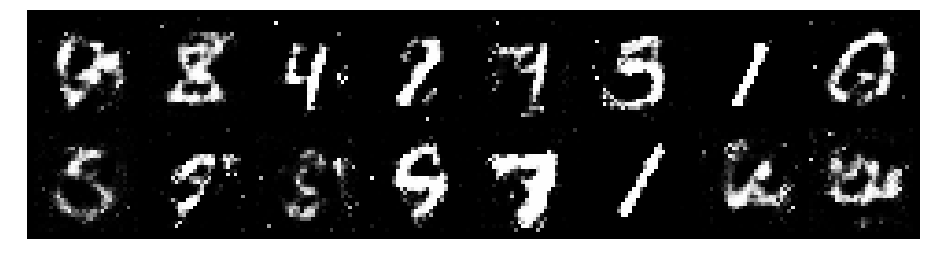

Epoch: [38/200], Batch Num: [300/600]
Discriminator Loss: 1.2038, Generator Loss: 1.3368
D(x): 0.5763, D(G(z)): 0.3773


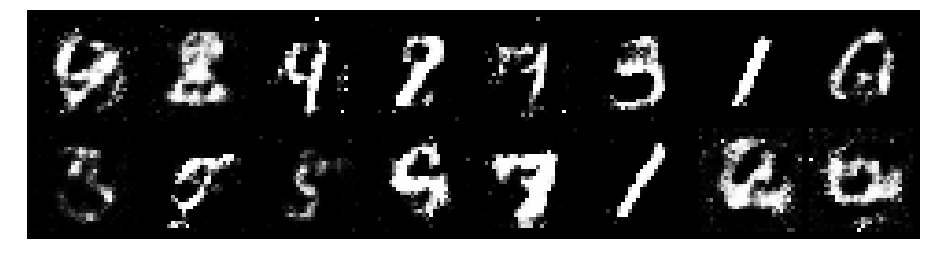

Epoch: [38/200], Batch Num: [400/600]
Discriminator Loss: 1.1946, Generator Loss: 1.0059
D(x): 0.6221, D(G(z)): 0.4439


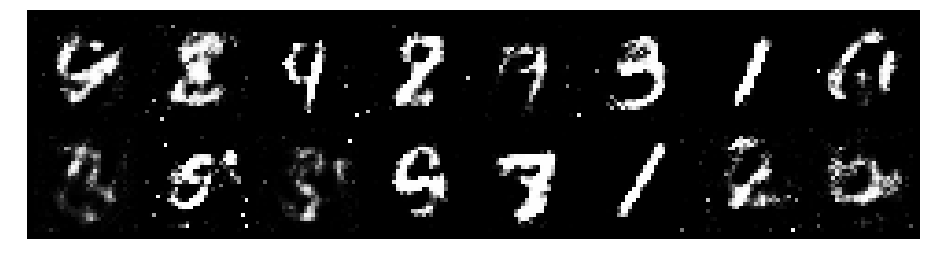

Epoch: [38/200], Batch Num: [500/600]
Discriminator Loss: 1.0641, Generator Loss: 1.1251
D(x): 0.6128, D(G(z)): 0.3705


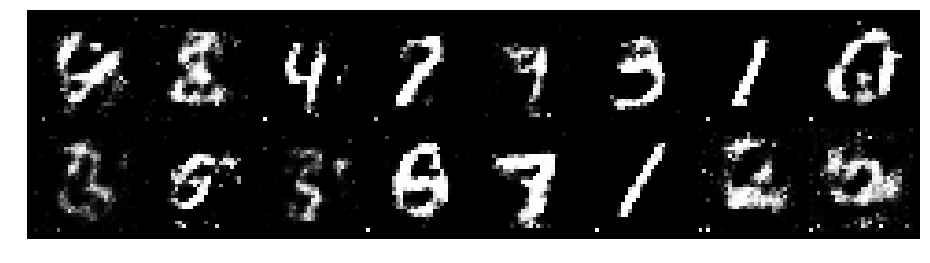

Epoch: [39/200], Batch Num: [0/600]
Discriminator Loss: 1.0982, Generator Loss: 1.1841
D(x): 0.6033, D(G(z)): 0.3549


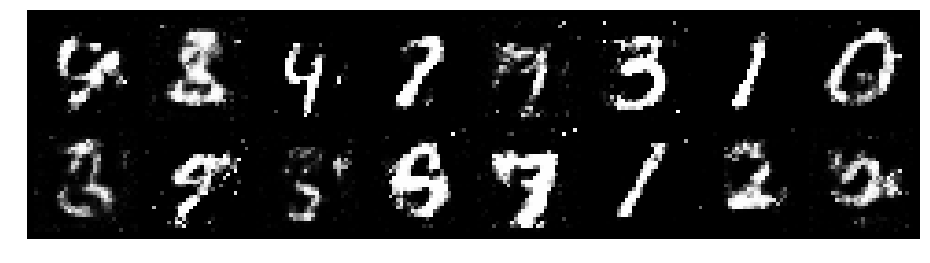

Epoch: [39/200], Batch Num: [100/600]
Discriminator Loss: 1.0009, Generator Loss: 1.3776
D(x): 0.6759, D(G(z)): 0.3806


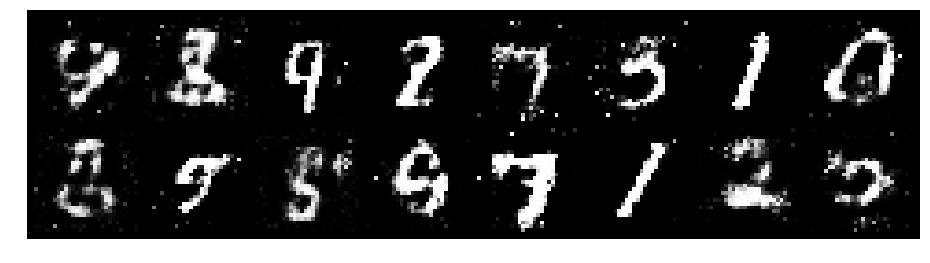

Epoch: [39/200], Batch Num: [200/600]
Discriminator Loss: 0.9739, Generator Loss: 1.4904
D(x): 0.6615, D(G(z)): 0.3420


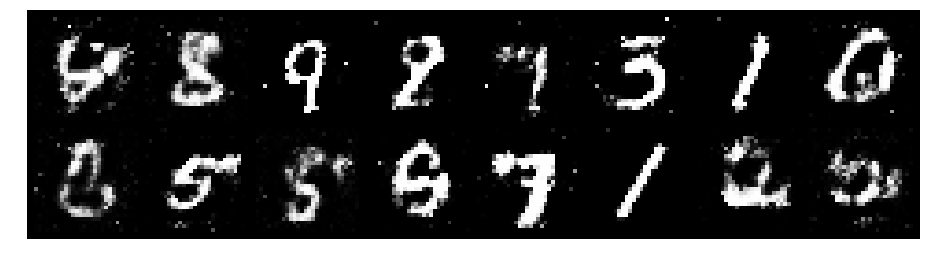

Epoch: [39/200], Batch Num: [300/600]
Discriminator Loss: 1.1169, Generator Loss: 1.1334
D(x): 0.6702, D(G(z)): 0.4105


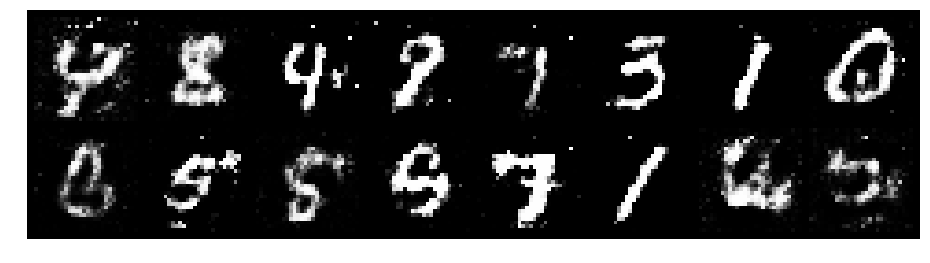

Epoch: [39/200], Batch Num: [400/600]
Discriminator Loss: 0.9824, Generator Loss: 1.2079
D(x): 0.6406, D(G(z)): 0.3208


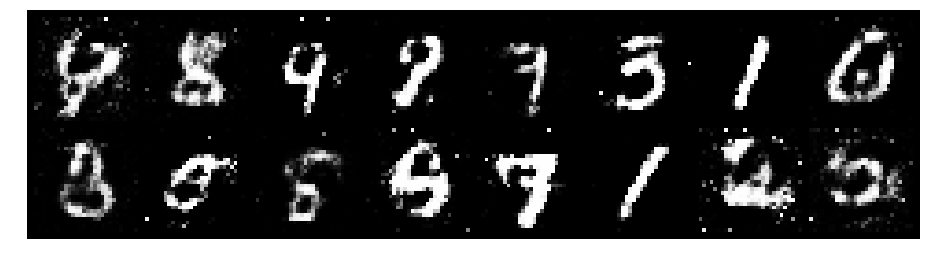

Epoch: [39/200], Batch Num: [500/600]
Discriminator Loss: 1.1696, Generator Loss: 1.2980
D(x): 0.5898, D(G(z)): 0.3484


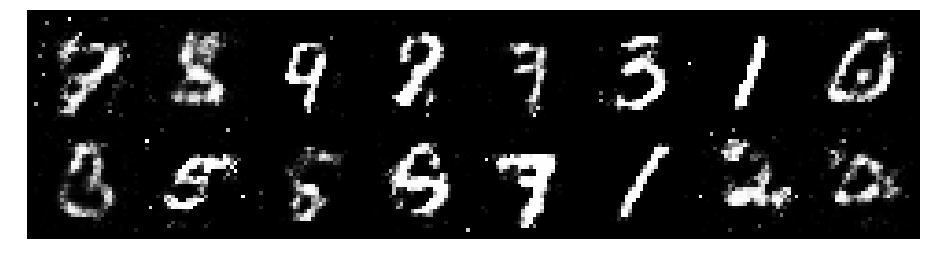

Epoch: [40/200], Batch Num: [0/600]
Discriminator Loss: 1.1778, Generator Loss: 1.0312
D(x): 0.6172, D(G(z)): 0.4002


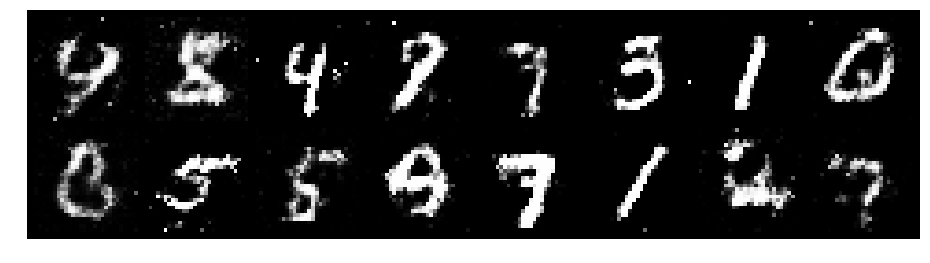

Epoch: [40/200], Batch Num: [100/600]
Discriminator Loss: 1.1087, Generator Loss: 1.0156
D(x): 0.6168, D(G(z)): 0.3634


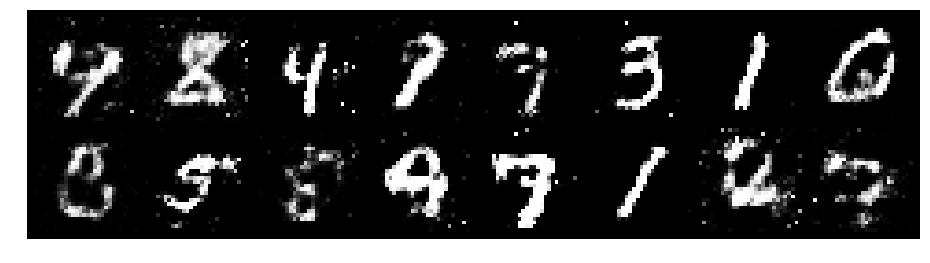

Epoch: [40/200], Batch Num: [200/600]
Discriminator Loss: 1.1746, Generator Loss: 1.0799
D(x): 0.5832, D(G(z)): 0.3983


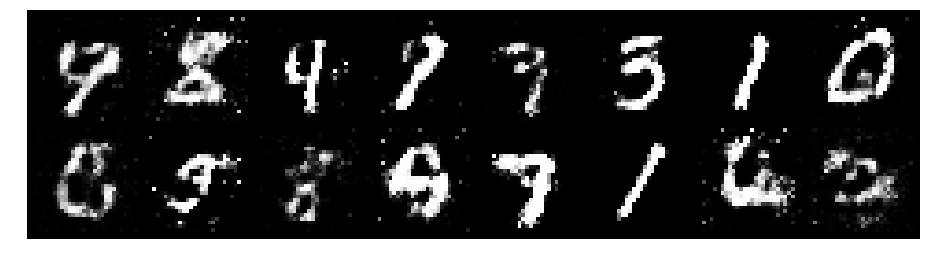

Epoch: [40/200], Batch Num: [300/600]
Discriminator Loss: 1.0742, Generator Loss: 1.1751
D(x): 0.6262, D(G(z)): 0.3847


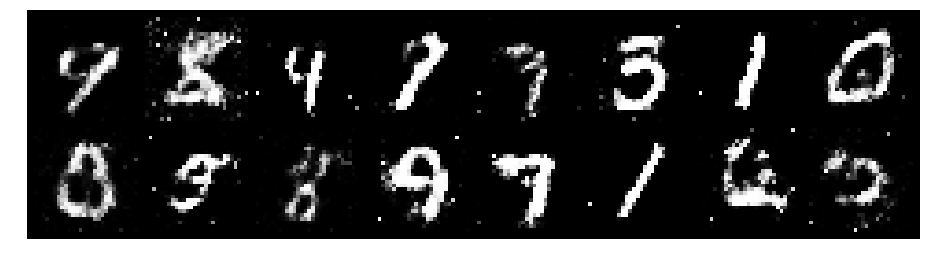

Epoch: [40/200], Batch Num: [400/600]
Discriminator Loss: 1.1368, Generator Loss: 1.1362
D(x): 0.6185, D(G(z)): 0.4013


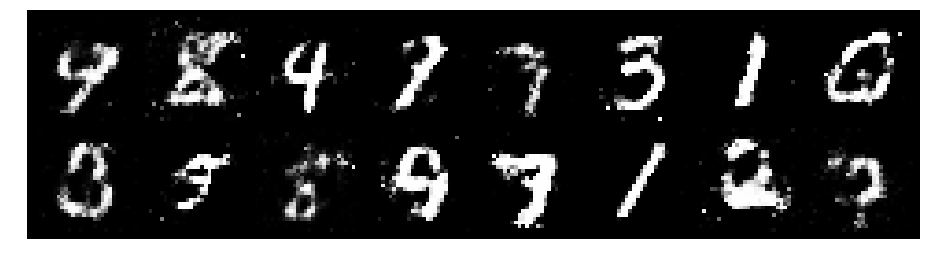

Epoch: [40/200], Batch Num: [500/600]
Discriminator Loss: 1.0516, Generator Loss: 1.0261
D(x): 0.6750, D(G(z)): 0.4087


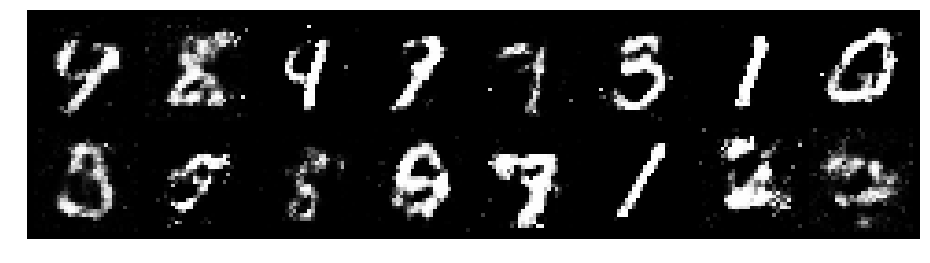

Epoch: [41/200], Batch Num: [0/600]
Discriminator Loss: 0.9611, Generator Loss: 1.0033
D(x): 0.6706, D(G(z)): 0.3705


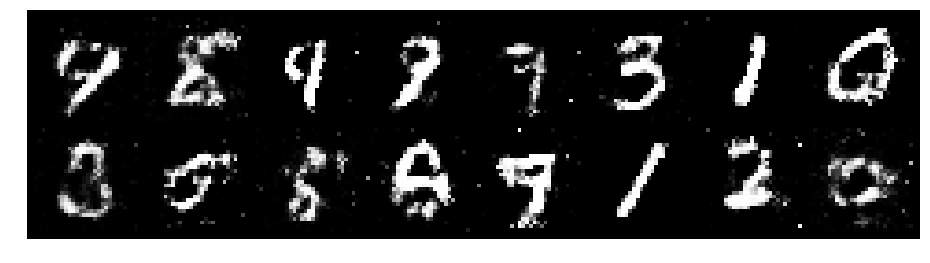

Epoch: [41/200], Batch Num: [100/600]
Discriminator Loss: 1.1860, Generator Loss: 1.3065
D(x): 0.6061, D(G(z)): 0.3616


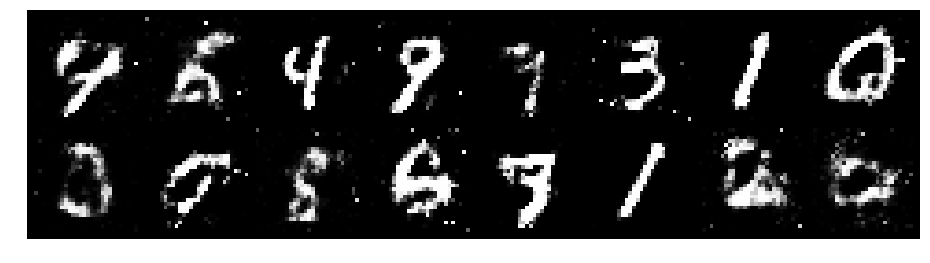

Epoch: [41/200], Batch Num: [200/600]
Discriminator Loss: 1.1901, Generator Loss: 1.1846
D(x): 0.6252, D(G(z)): 0.4194


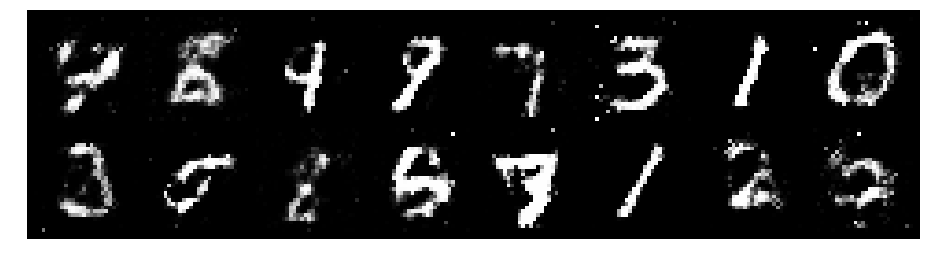

Epoch: [41/200], Batch Num: [300/600]
Discriminator Loss: 1.0179, Generator Loss: 1.1303
D(x): 0.6698, D(G(z)): 0.3904


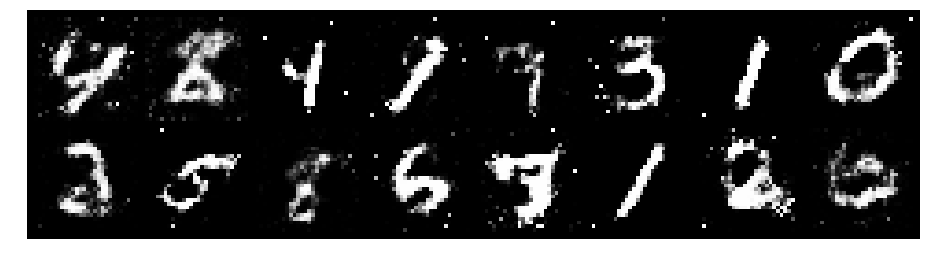

Epoch: [41/200], Batch Num: [400/600]
Discriminator Loss: 1.0516, Generator Loss: 1.0998
D(x): 0.6065, D(G(z)): 0.3697


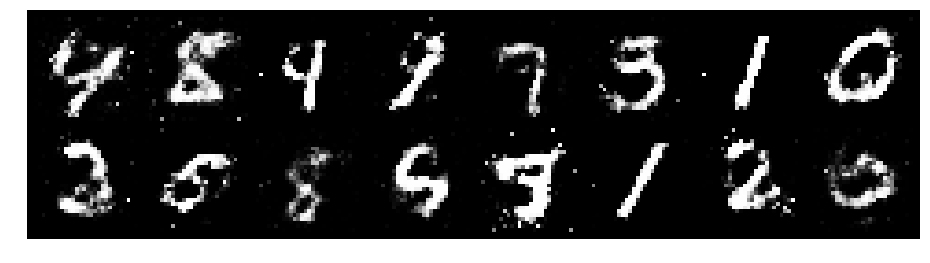

Epoch: [41/200], Batch Num: [500/600]
Discriminator Loss: 1.1412, Generator Loss: 1.1841
D(x): 0.5358, D(G(z)): 0.3168


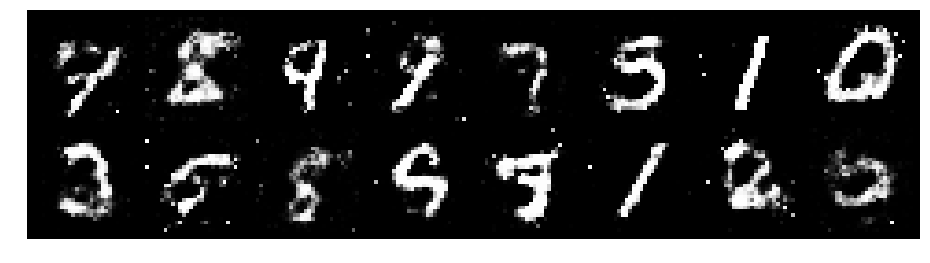

Epoch: [42/200], Batch Num: [0/600]
Discriminator Loss: 1.1654, Generator Loss: 1.0249
D(x): 0.5595, D(G(z)): 0.3767


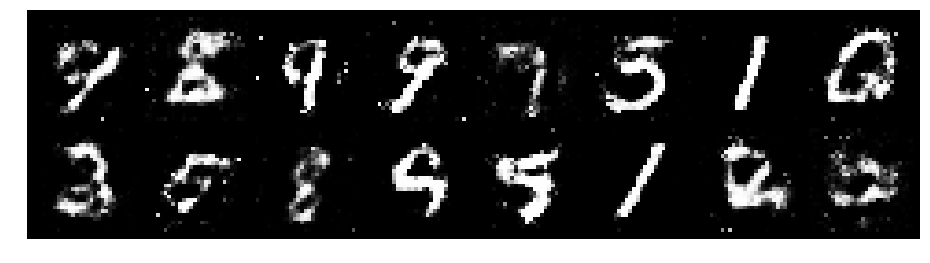

Epoch: [42/200], Batch Num: [100/600]
Discriminator Loss: 1.1599, Generator Loss: 1.0748
D(x): 0.6059, D(G(z)): 0.3785


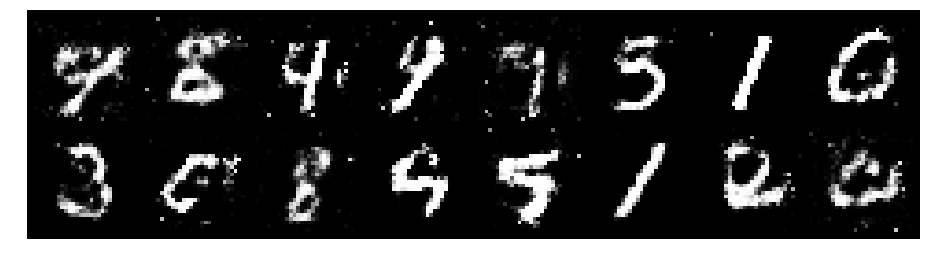

Epoch: [42/200], Batch Num: [200/600]
Discriminator Loss: 1.1799, Generator Loss: 0.9499
D(x): 0.6536, D(G(z)): 0.4462


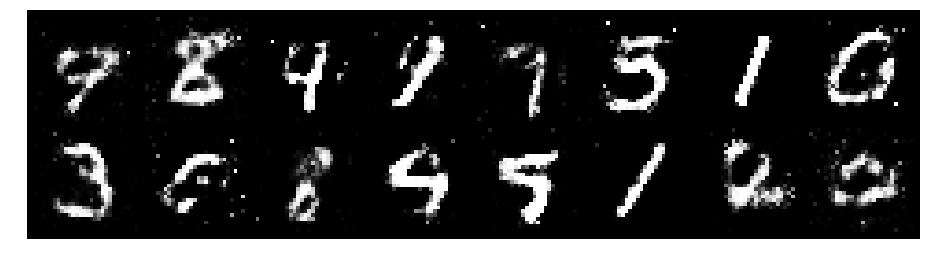

Epoch: [42/200], Batch Num: [300/600]
Discriminator Loss: 1.1358, Generator Loss: 1.0571
D(x): 0.6321, D(G(z)): 0.3988


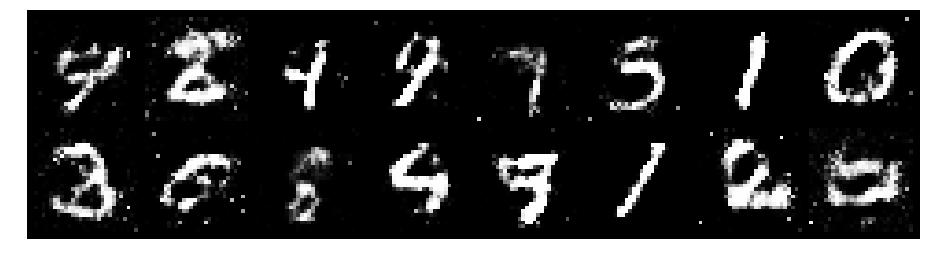

Epoch: [42/200], Batch Num: [400/600]
Discriminator Loss: 1.2234, Generator Loss: 1.1863
D(x): 0.5093, D(G(z)): 0.3103


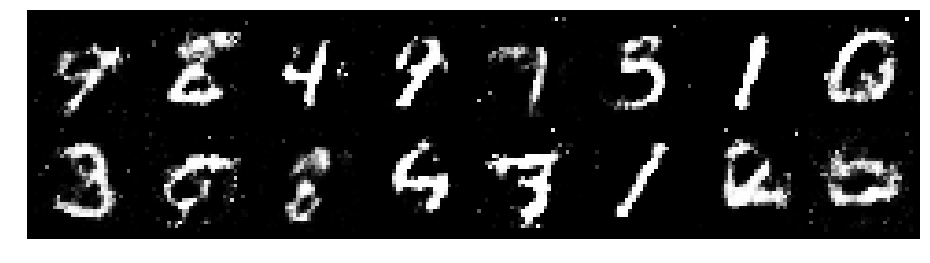

Epoch: [42/200], Batch Num: [500/600]
Discriminator Loss: 1.1265, Generator Loss: 1.2351
D(x): 0.5752, D(G(z)): 0.3210


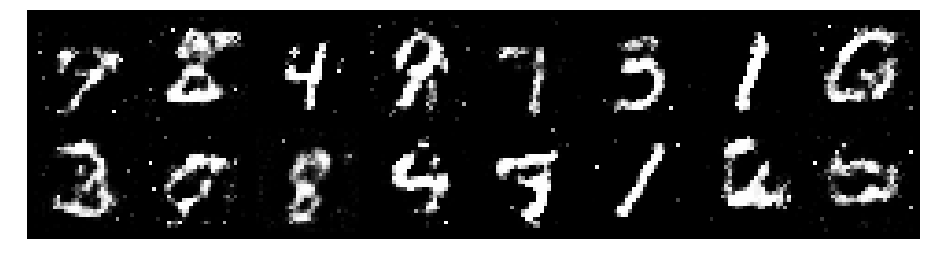

Epoch: [43/200], Batch Num: [0/600]
Discriminator Loss: 1.1574, Generator Loss: 1.0783
D(x): 0.5914, D(G(z)): 0.4028


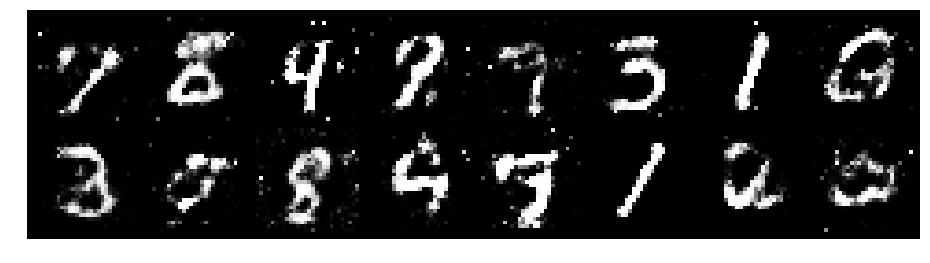

Epoch: [43/200], Batch Num: [100/600]
Discriminator Loss: 1.1733, Generator Loss: 0.8730
D(x): 0.6019, D(G(z)): 0.4159


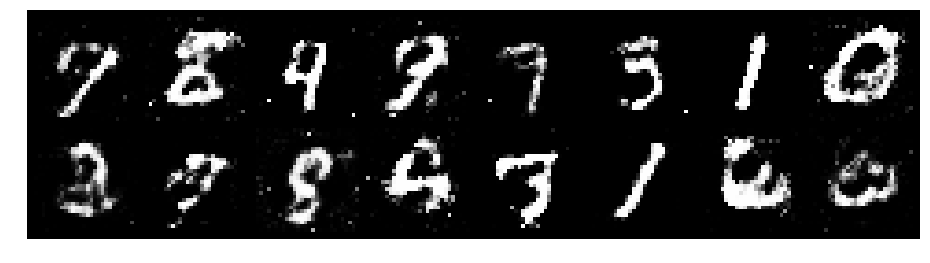

Epoch: [43/200], Batch Num: [200/600]
Discriminator Loss: 1.2152, Generator Loss: 1.0559
D(x): 0.5723, D(G(z)): 0.4067


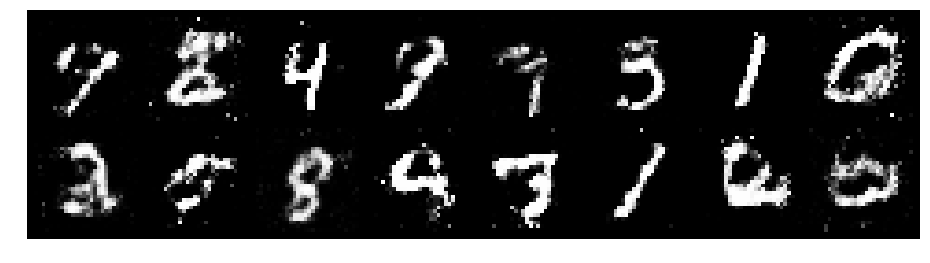

Epoch: [43/200], Batch Num: [300/600]
Discriminator Loss: 1.1797, Generator Loss: 1.0054
D(x): 0.5797, D(G(z)): 0.4011


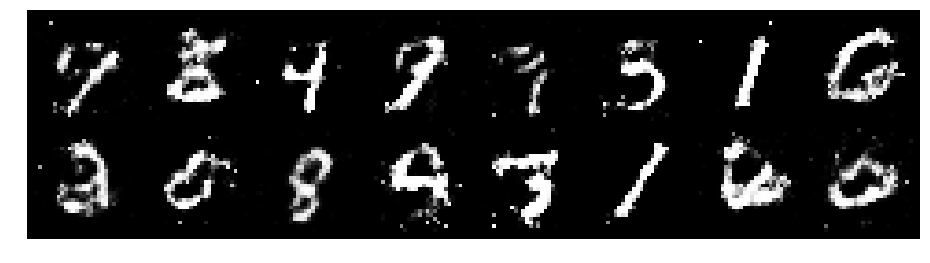

Epoch: [43/200], Batch Num: [400/600]
Discriminator Loss: 1.1011, Generator Loss: 1.2888
D(x): 0.5988, D(G(z)): 0.3665


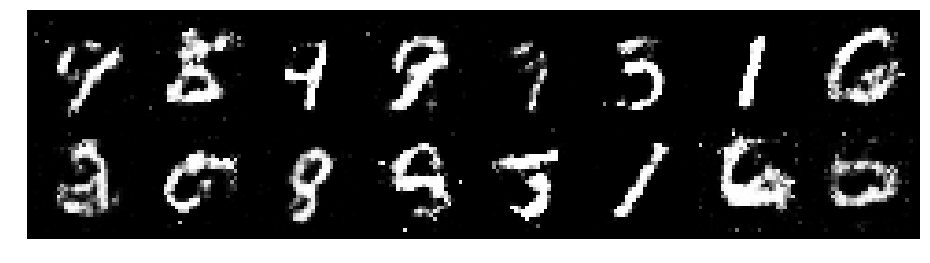

Epoch: [43/200], Batch Num: [500/600]
Discriminator Loss: 1.1908, Generator Loss: 1.0713
D(x): 0.5727, D(G(z)): 0.3875


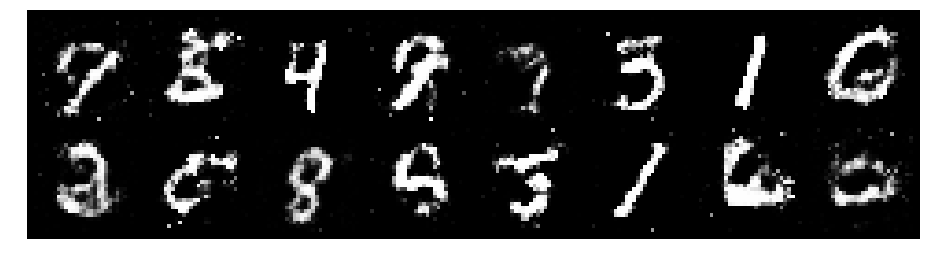

Epoch: [44/200], Batch Num: [0/600]
Discriminator Loss: 1.0946, Generator Loss: 1.0885
D(x): 0.6569, D(G(z)): 0.4023


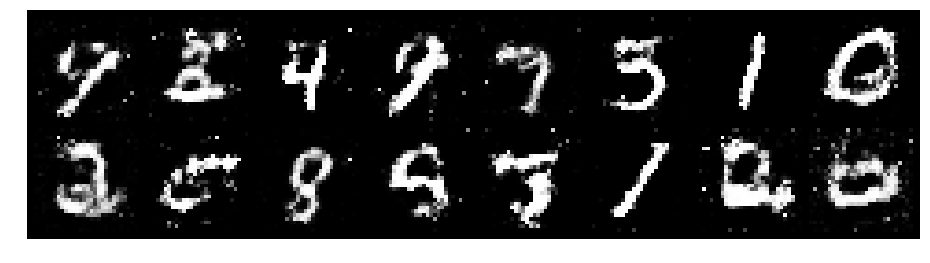

Epoch: [44/200], Batch Num: [100/600]
Discriminator Loss: 1.0735, Generator Loss: 1.1635
D(x): 0.6428, D(G(z)): 0.3539


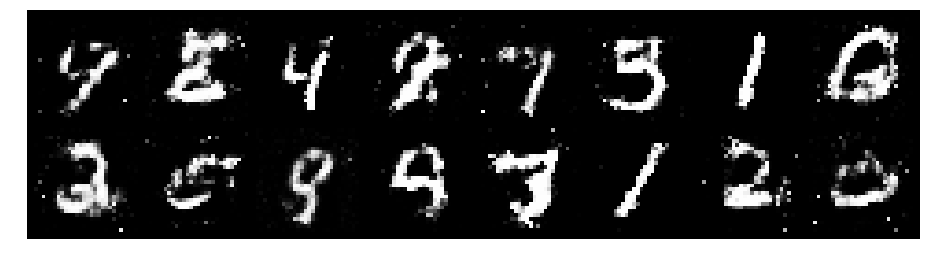

Epoch: [44/200], Batch Num: [200/600]
Discriminator Loss: 0.9750, Generator Loss: 1.4362
D(x): 0.6203, D(G(z)): 0.2756


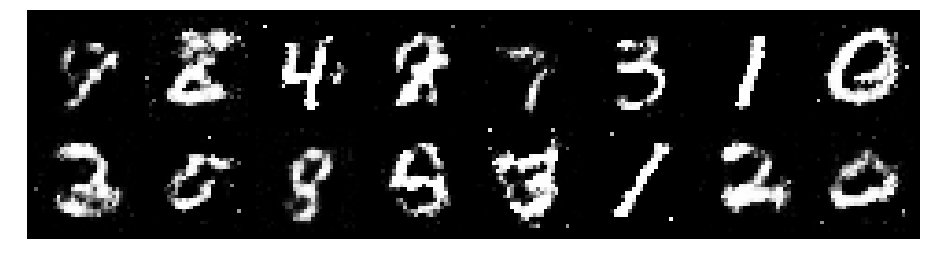

Epoch: [44/200], Batch Num: [300/600]
Discriminator Loss: 1.2045, Generator Loss: 1.1378
D(x): 0.6109, D(G(z)): 0.4315


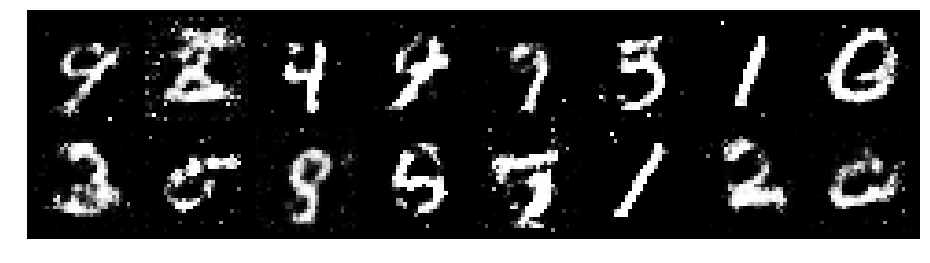

Epoch: [44/200], Batch Num: [400/600]
Discriminator Loss: 1.2502, Generator Loss: 1.2044
D(x): 0.6860, D(G(z)): 0.4531


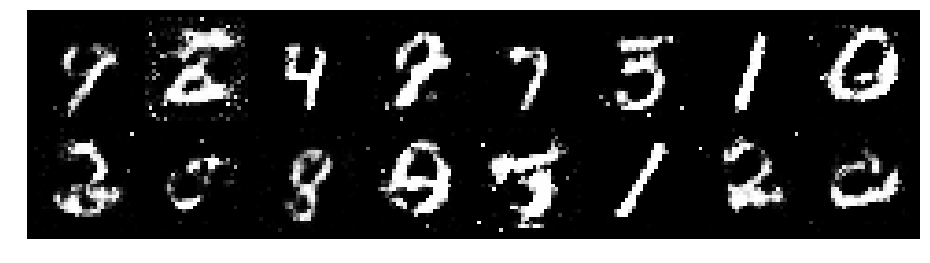

Epoch: [44/200], Batch Num: [500/600]
Discriminator Loss: 1.3717, Generator Loss: 1.0210
D(x): 0.5562, D(G(z)): 0.4562


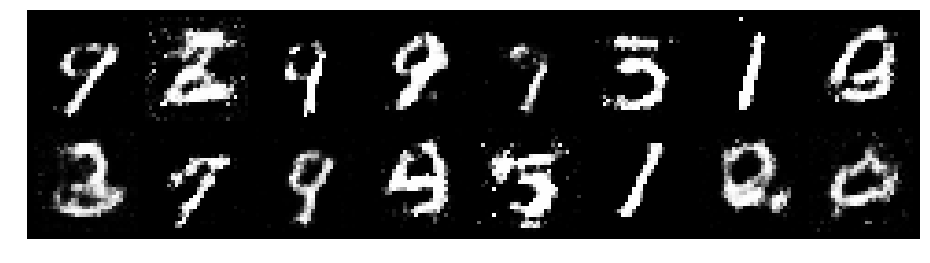

Epoch: [45/200], Batch Num: [0/600]
Discriminator Loss: 1.1041, Generator Loss: 1.0252
D(x): 0.6231, D(G(z)): 0.3918


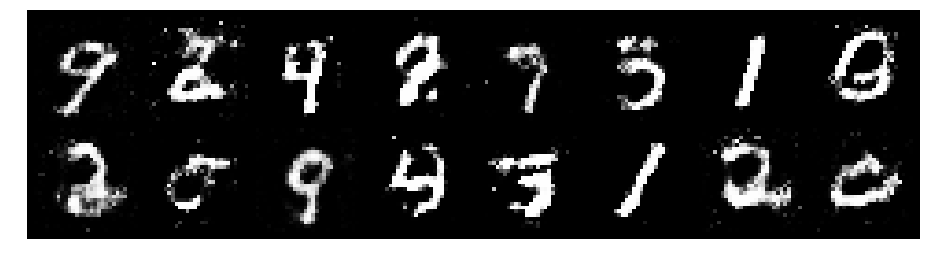

Epoch: [45/200], Batch Num: [100/600]
Discriminator Loss: 1.0859, Generator Loss: 1.1832
D(x): 0.6492, D(G(z)): 0.3833


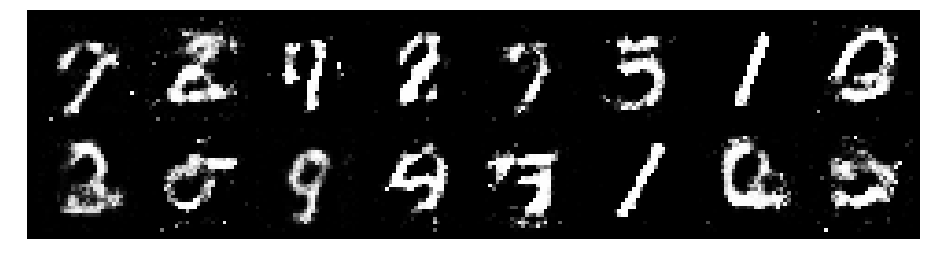

Epoch: [45/200], Batch Num: [200/600]
Discriminator Loss: 1.1547, Generator Loss: 0.9201
D(x): 0.5987, D(G(z)): 0.4286


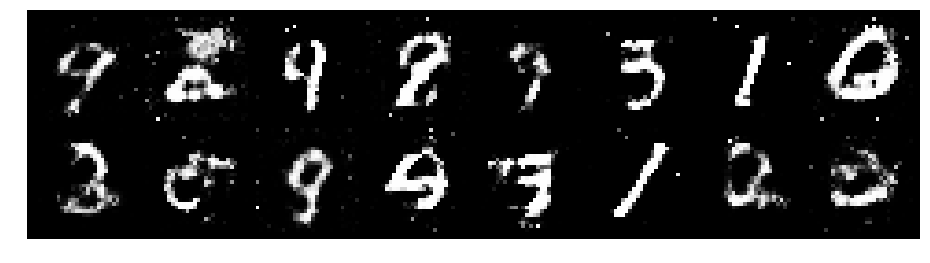

Epoch: [45/200], Batch Num: [300/600]
Discriminator Loss: 1.1771, Generator Loss: 0.9620
D(x): 0.6554, D(G(z)): 0.4478


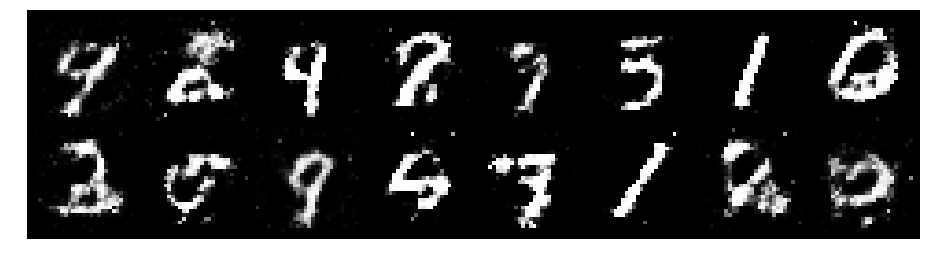

Epoch: [45/200], Batch Num: [400/600]
Discriminator Loss: 1.2249, Generator Loss: 1.0367
D(x): 0.5985, D(G(z)): 0.3923


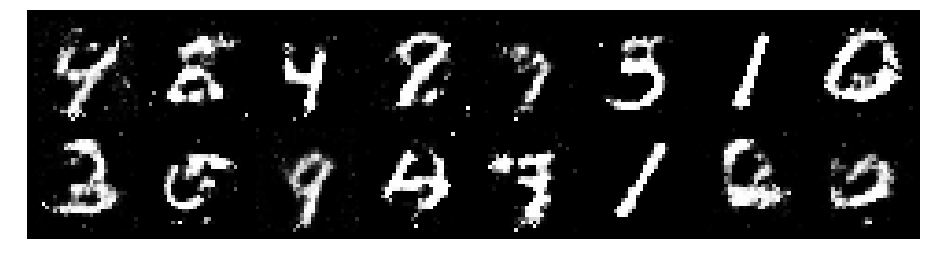

Epoch: [45/200], Batch Num: [500/600]
Discriminator Loss: 1.3333, Generator Loss: 1.0896
D(x): 0.5309, D(G(z)): 0.4317


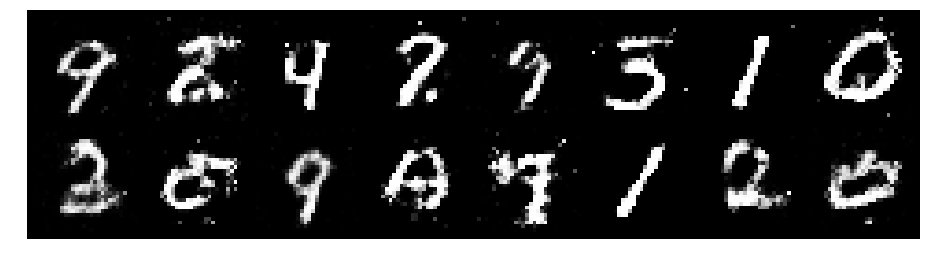

Epoch: [46/200], Batch Num: [0/600]
Discriminator Loss: 1.1410, Generator Loss: 0.8803
D(x): 0.6394, D(G(z)): 0.4346


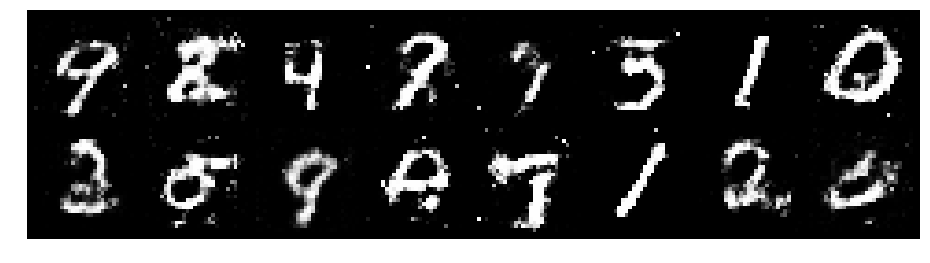

Epoch: [46/200], Batch Num: [100/600]
Discriminator Loss: 1.1929, Generator Loss: 1.0636
D(x): 0.5728, D(G(z)): 0.3969


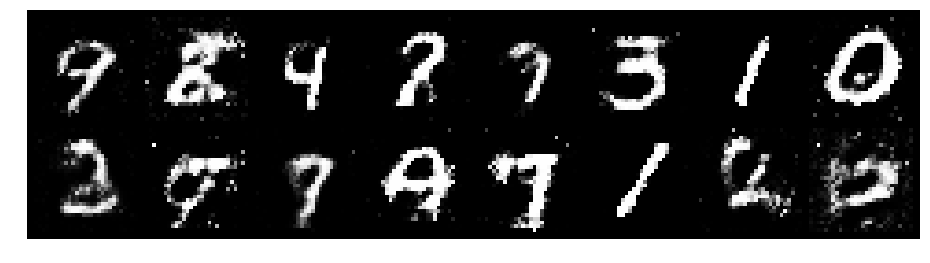

Epoch: [46/200], Batch Num: [200/600]
Discriminator Loss: 1.2624, Generator Loss: 0.9041
D(x): 0.6365, D(G(z)): 0.4531


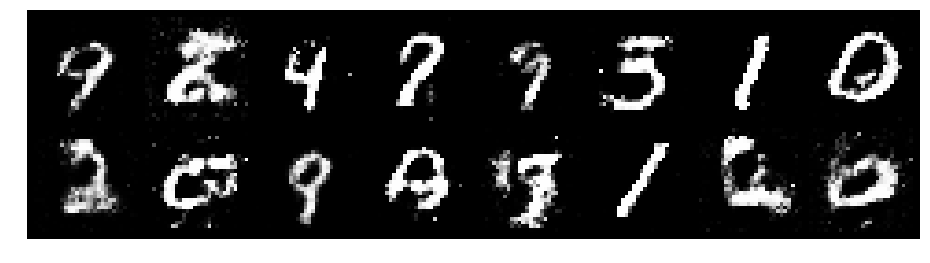

Epoch: [46/200], Batch Num: [300/600]
Discriminator Loss: 1.1615, Generator Loss: 1.0025
D(x): 0.6273, D(G(z)): 0.4253


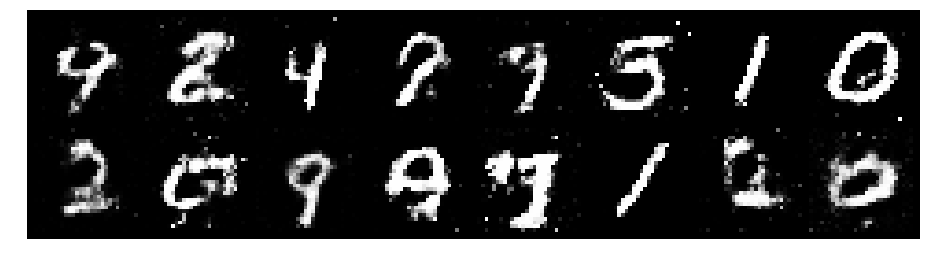

Epoch: [46/200], Batch Num: [400/600]
Discriminator Loss: 1.1016, Generator Loss: 1.0704
D(x): 0.6114, D(G(z)): 0.3862


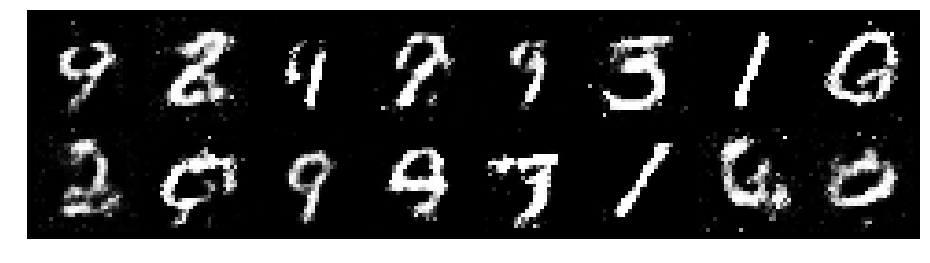

Epoch: [46/200], Batch Num: [500/600]
Discriminator Loss: 1.1942, Generator Loss: 1.1478
D(x): 0.5891, D(G(z)): 0.4026


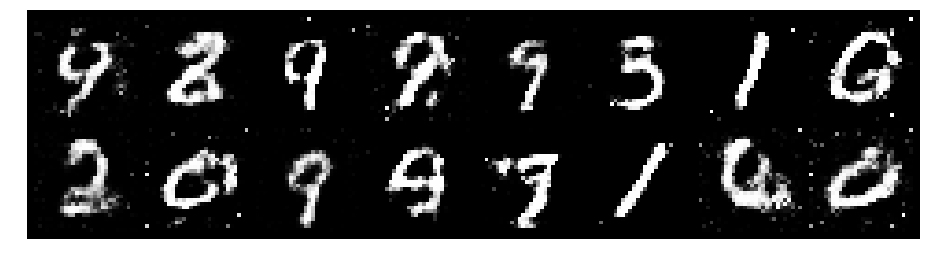

Epoch: [47/200], Batch Num: [0/600]
Discriminator Loss: 1.2317, Generator Loss: 1.0907
D(x): 0.6726, D(G(z)): 0.4810


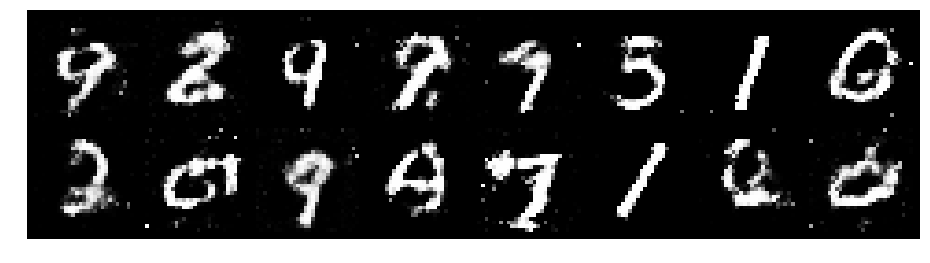

Epoch: [47/200], Batch Num: [100/600]
Discriminator Loss: 1.2588, Generator Loss: 0.8524
D(x): 0.6592, D(G(z)): 0.4748


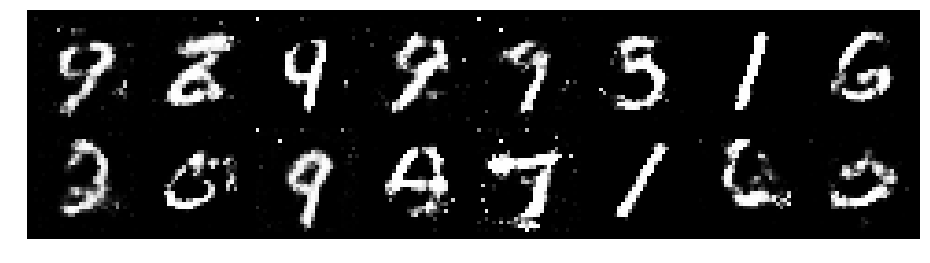

Epoch: [47/200], Batch Num: [200/600]
Discriminator Loss: 1.0998, Generator Loss: 1.1091
D(x): 0.5925, D(G(z)): 0.3390


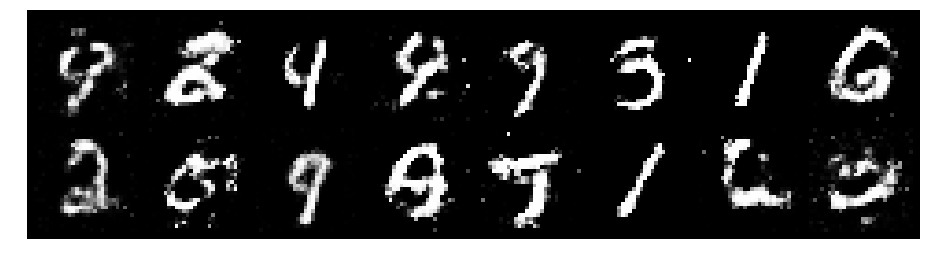

Epoch: [47/200], Batch Num: [300/600]
Discriminator Loss: 1.1221, Generator Loss: 0.9153
D(x): 0.6201, D(G(z)): 0.4131


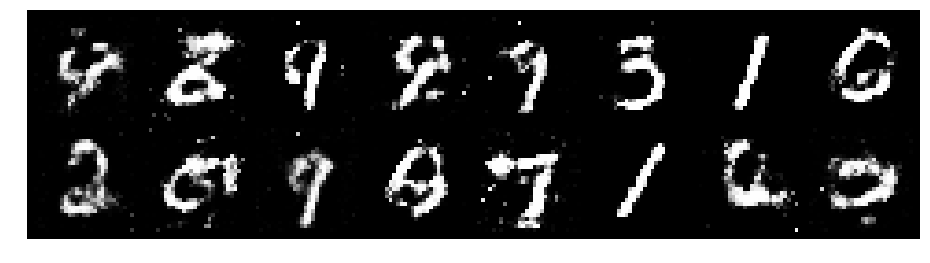

Epoch: [47/200], Batch Num: [400/600]
Discriminator Loss: 1.1877, Generator Loss: 1.1412
D(x): 0.5989, D(G(z)): 0.4106


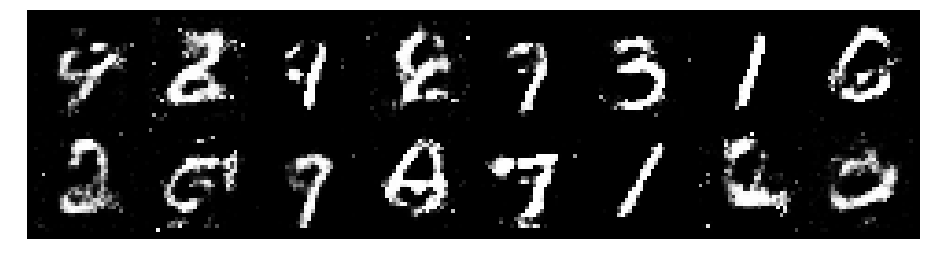

Epoch: [47/200], Batch Num: [500/600]
Discriminator Loss: 1.1277, Generator Loss: 0.9746
D(x): 0.5884, D(G(z)): 0.3872


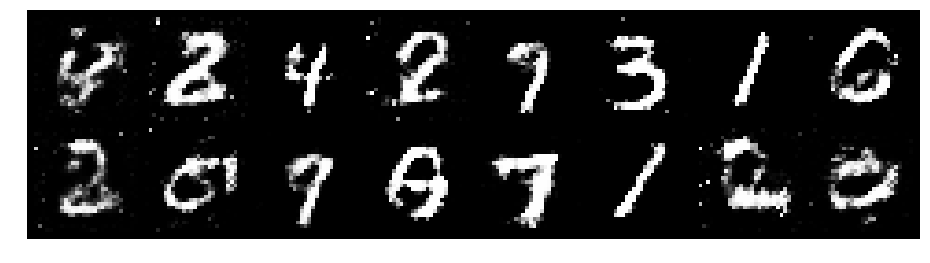

Epoch: [48/200], Batch Num: [0/600]
Discriminator Loss: 1.1645, Generator Loss: 1.0744
D(x): 0.5841, D(G(z)): 0.3826


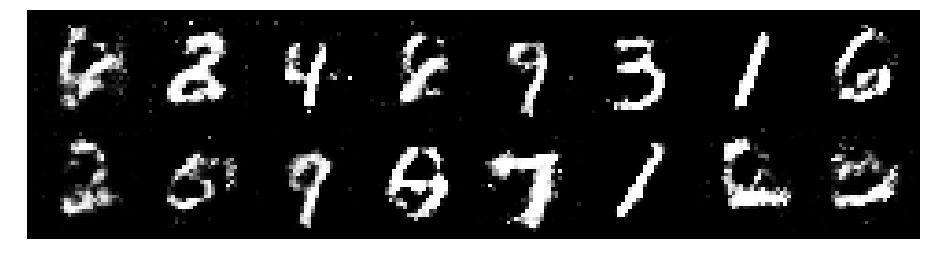

Epoch: [48/200], Batch Num: [100/600]
Discriminator Loss: 1.2967, Generator Loss: 0.8510
D(x): 0.5641, D(G(z)): 0.4533


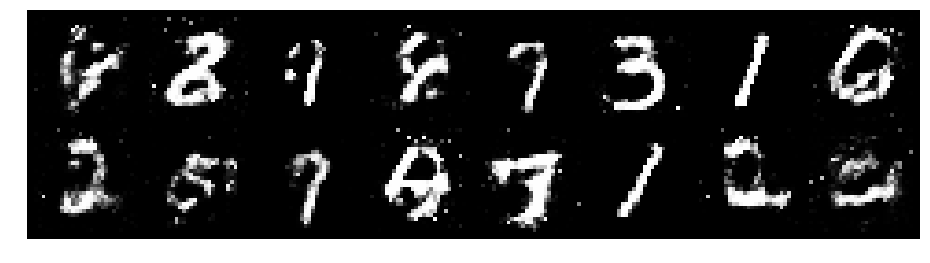

Epoch: [48/200], Batch Num: [200/600]
Discriminator Loss: 1.1647, Generator Loss: 1.0430
D(x): 0.6532, D(G(z)): 0.4343


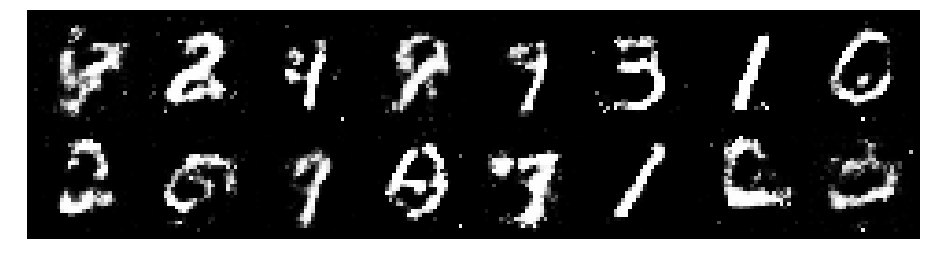

Epoch: [48/200], Batch Num: [300/600]
Discriminator Loss: 1.3435, Generator Loss: 0.9553
D(x): 0.5371, D(G(z)): 0.4475


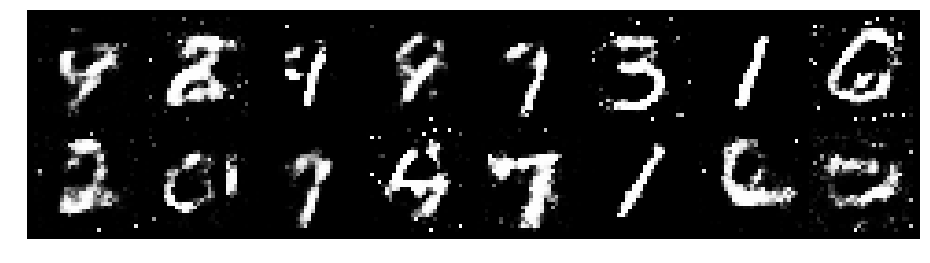

Epoch: [48/200], Batch Num: [400/600]
Discriminator Loss: 1.2855, Generator Loss: 1.0057
D(x): 0.5516, D(G(z)): 0.4078


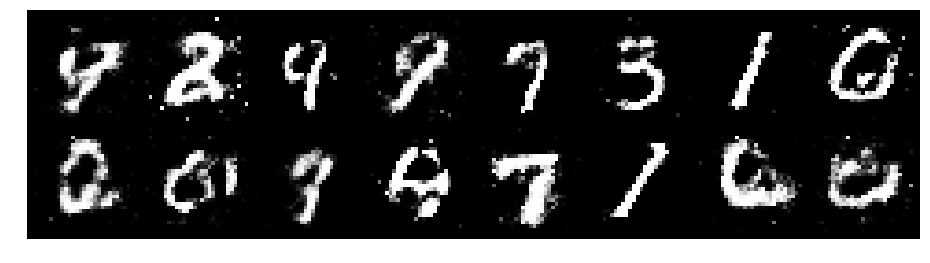

Epoch: [48/200], Batch Num: [500/600]
Discriminator Loss: 1.2691, Generator Loss: 1.1319
D(x): 0.5657, D(G(z)): 0.4076


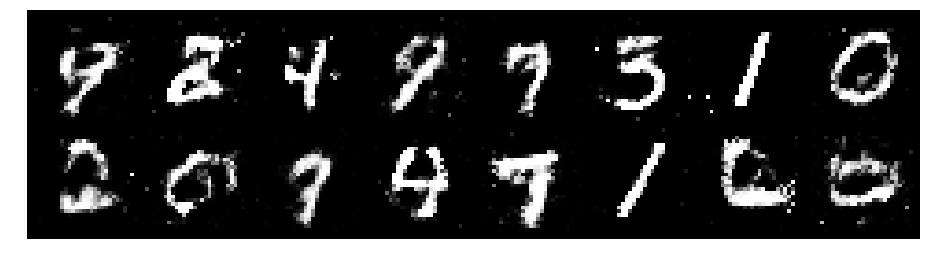

Epoch: [49/200], Batch Num: [0/600]
Discriminator Loss: 1.3002, Generator Loss: 1.0138
D(x): 0.5525, D(G(z)): 0.4220


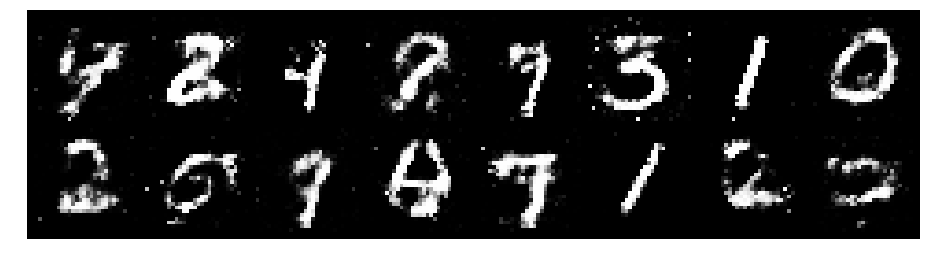

Epoch: [49/200], Batch Num: [100/600]
Discriminator Loss: 1.0795, Generator Loss: 1.0268
D(x): 0.6235, D(G(z)): 0.3850


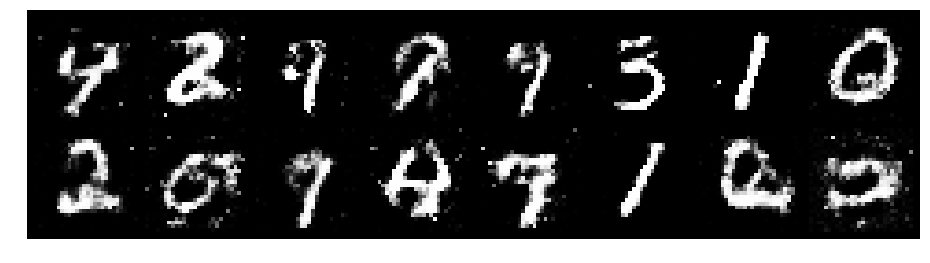

Epoch: [49/200], Batch Num: [200/600]
Discriminator Loss: 1.1137, Generator Loss: 1.0492
D(x): 0.6571, D(G(z)): 0.4105


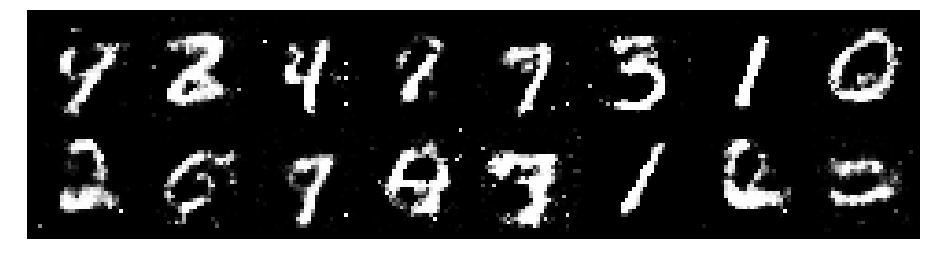

Epoch: [49/200], Batch Num: [300/600]
Discriminator Loss: 1.2541, Generator Loss: 0.9146
D(x): 0.5994, D(G(z)): 0.4562


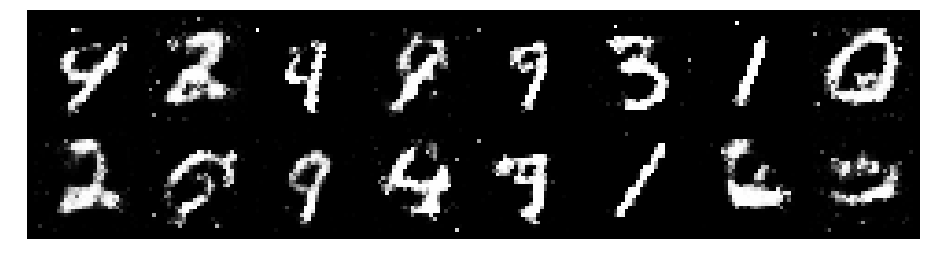

Epoch: [49/200], Batch Num: [400/600]
Discriminator Loss: 1.0199, Generator Loss: 1.0626
D(x): 0.6405, D(G(z)): 0.3654


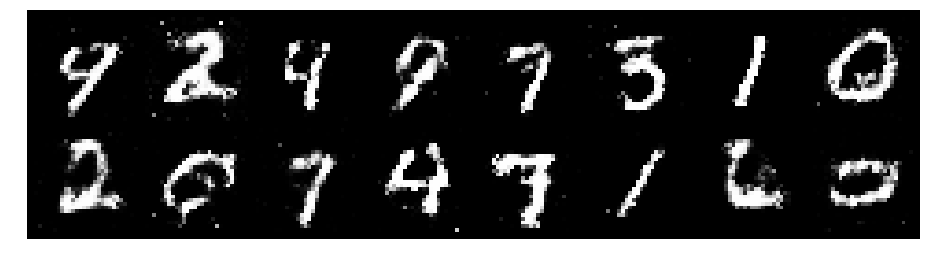

Epoch: [49/200], Batch Num: [500/600]
Discriminator Loss: 1.1196, Generator Loss: 1.0515
D(x): 0.6010, D(G(z)): 0.3830


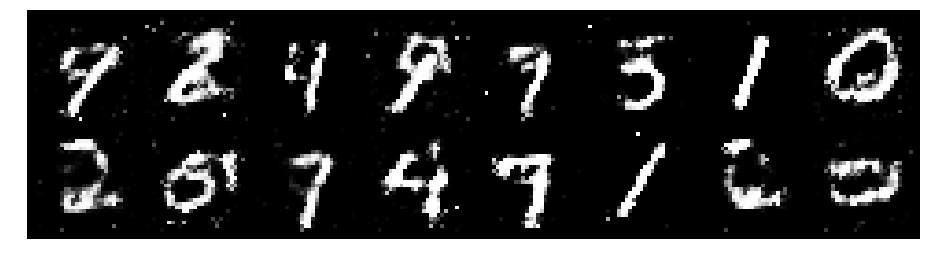

Epoch: [50/200], Batch Num: [0/600]
Discriminator Loss: 1.1374, Generator Loss: 1.0541
D(x): 0.5619, D(G(z)): 0.3783


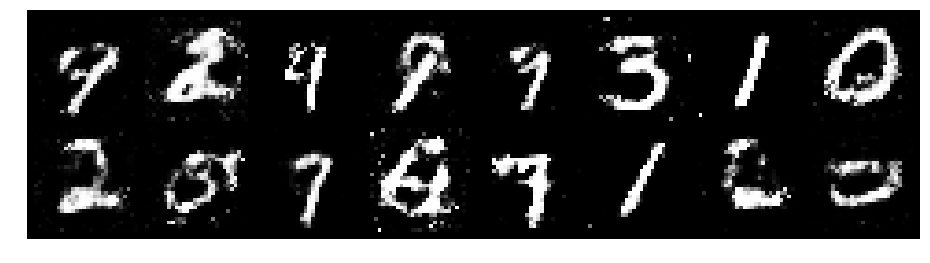

Epoch: [50/200], Batch Num: [100/600]
Discriminator Loss: 1.0445, Generator Loss: 1.3132
D(x): 0.6338, D(G(z)): 0.3389


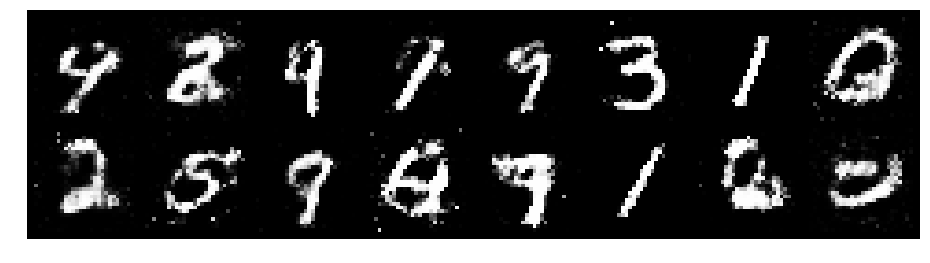

Epoch: [50/200], Batch Num: [200/600]
Discriminator Loss: 1.1854, Generator Loss: 0.9447
D(x): 0.5928, D(G(z)): 0.4093


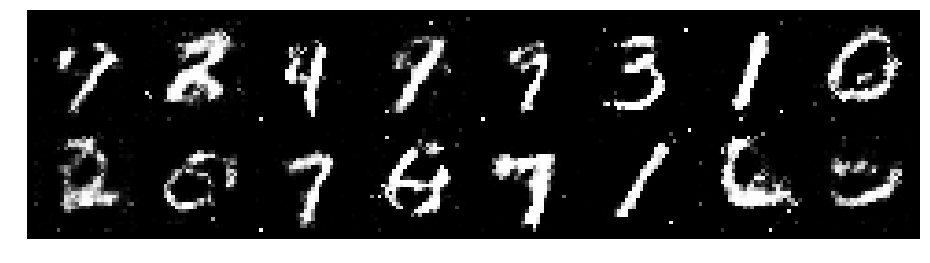

Epoch: [50/200], Batch Num: [300/600]
Discriminator Loss: 1.0474, Generator Loss: 1.2858
D(x): 0.6161, D(G(z)): 0.3482


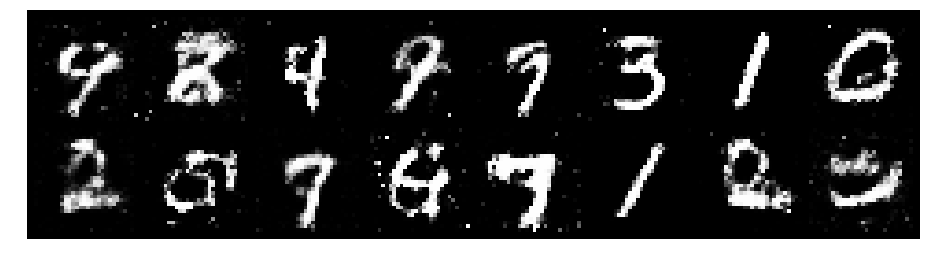

Epoch: [50/200], Batch Num: [400/600]
Discriminator Loss: 1.2495, Generator Loss: 1.1742
D(x): 0.5804, D(G(z)): 0.4052


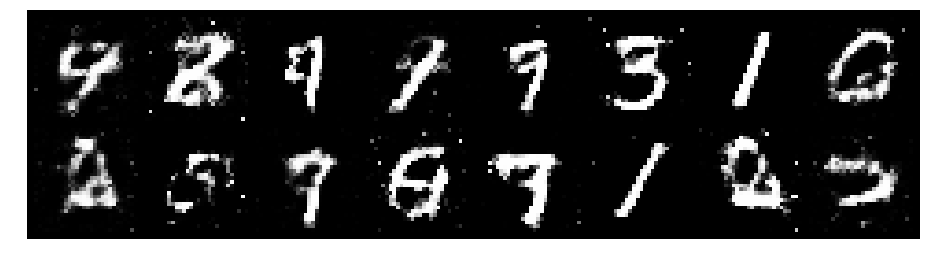

Epoch: [50/200], Batch Num: [500/600]
Discriminator Loss: 1.2976, Generator Loss: 0.9960
D(x): 0.6020, D(G(z)): 0.4516


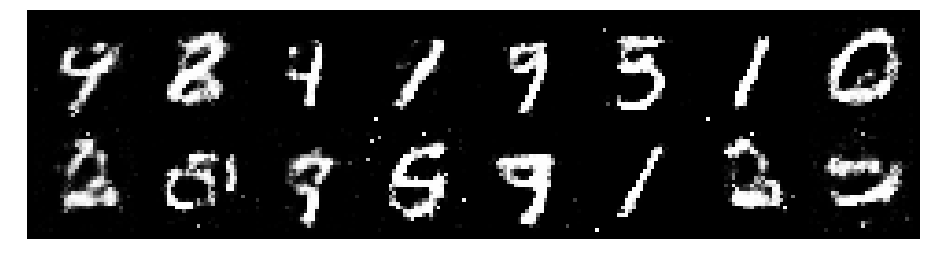

Epoch: [51/200], Batch Num: [0/600]
Discriminator Loss: 1.2943, Generator Loss: 0.8409
D(x): 0.6229, D(G(z)): 0.4917


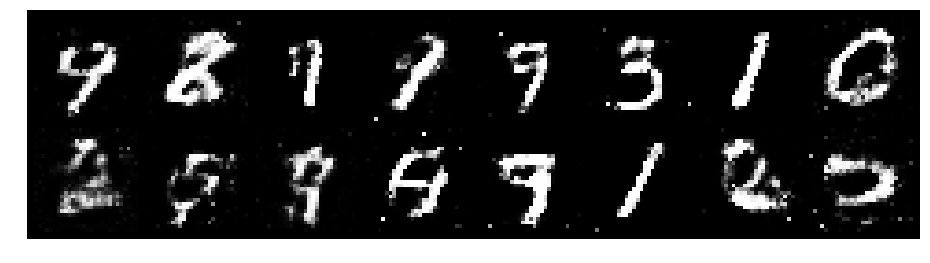

Epoch: [51/200], Batch Num: [100/600]
Discriminator Loss: 1.2806, Generator Loss: 0.9109
D(x): 0.5465, D(G(z)): 0.3938


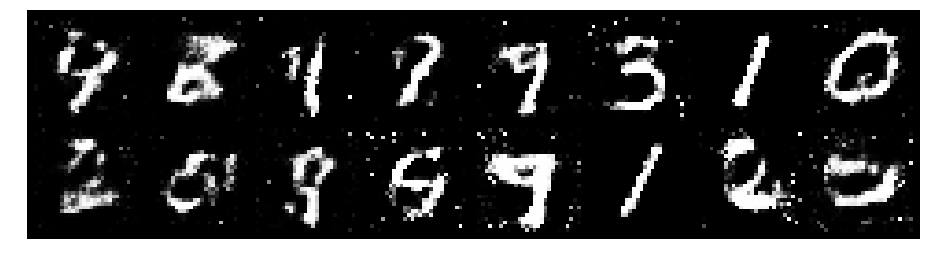

Epoch: [51/200], Batch Num: [200/600]
Discriminator Loss: 1.4220, Generator Loss: 1.0335
D(x): 0.5536, D(G(z)): 0.4728


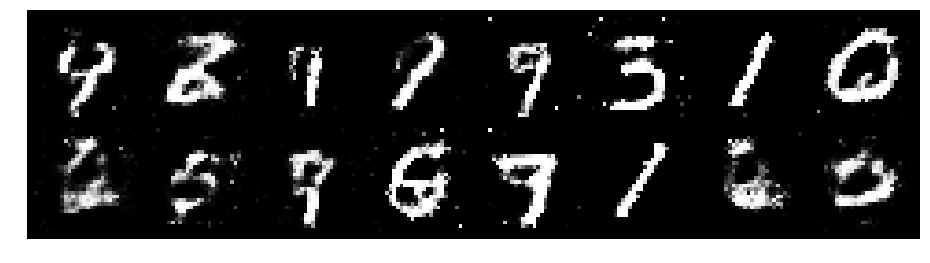

Epoch: [51/200], Batch Num: [300/600]
Discriminator Loss: 1.0824, Generator Loss: 1.0009
D(x): 0.6227, D(G(z)): 0.3953


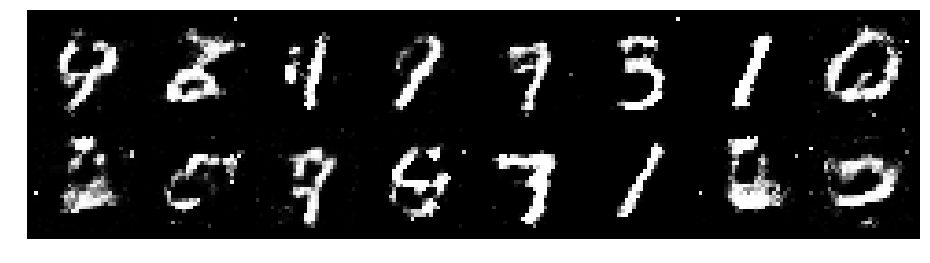

Epoch: [51/200], Batch Num: [400/600]
Discriminator Loss: 1.1115, Generator Loss: 1.0575
D(x): 0.6133, D(G(z)): 0.4041


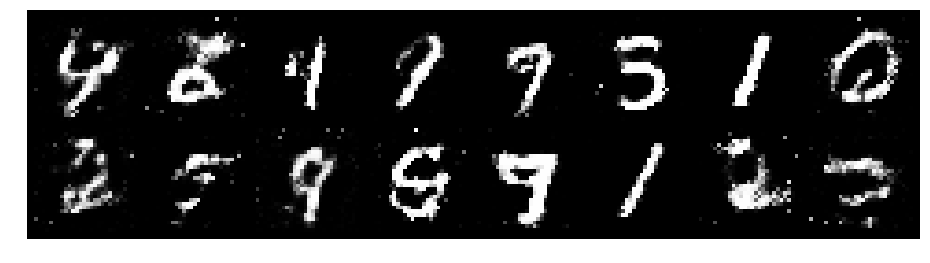

Epoch: [51/200], Batch Num: [500/600]
Discriminator Loss: 1.1686, Generator Loss: 0.8982
D(x): 0.5997, D(G(z)): 0.4437


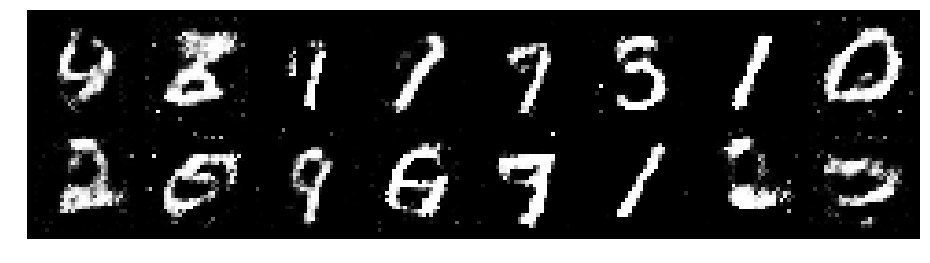

Epoch: [52/200], Batch Num: [0/600]
Discriminator Loss: 1.2192, Generator Loss: 0.9706
D(x): 0.5650, D(G(z)): 0.3977


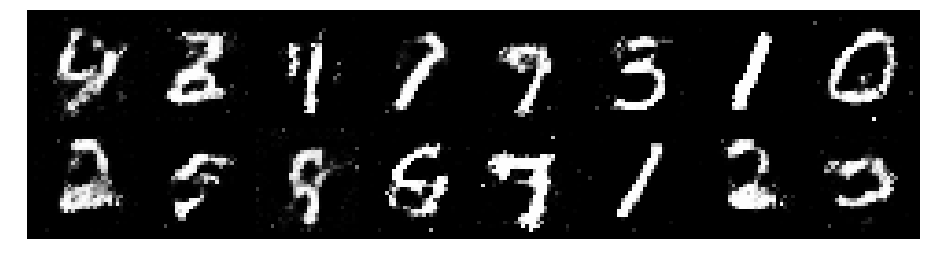

Epoch: [52/200], Batch Num: [100/600]
Discriminator Loss: 1.1252, Generator Loss: 0.9706
D(x): 0.5713, D(G(z)): 0.3728


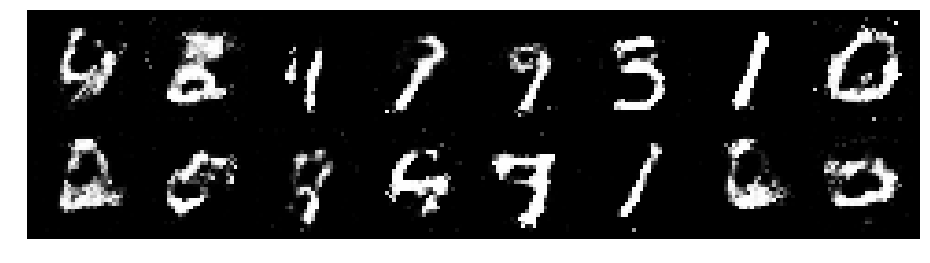

Epoch: [52/200], Batch Num: [200/600]
Discriminator Loss: 1.2286, Generator Loss: 1.5601
D(x): 0.6014, D(G(z)): 0.3921


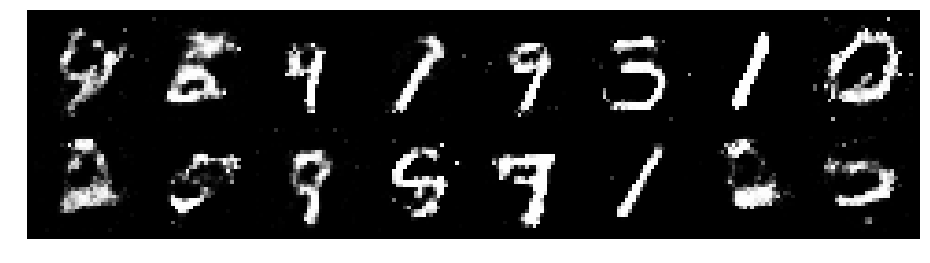

Epoch: [52/200], Batch Num: [300/600]
Discriminator Loss: 1.1985, Generator Loss: 1.2238
D(x): 0.5736, D(G(z)): 0.3957


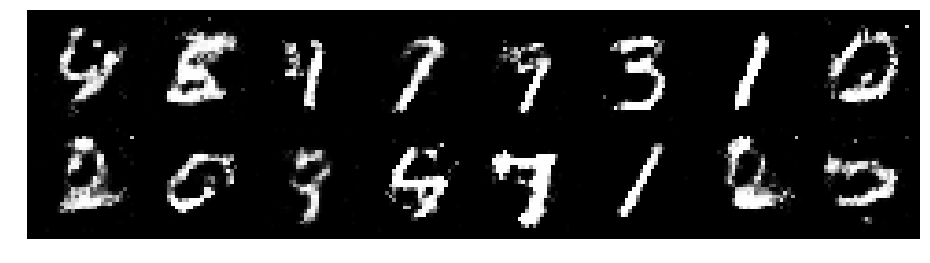

Epoch: [52/200], Batch Num: [400/600]
Discriminator Loss: 1.2306, Generator Loss: 0.9793
D(x): 0.5614, D(G(z)): 0.3897


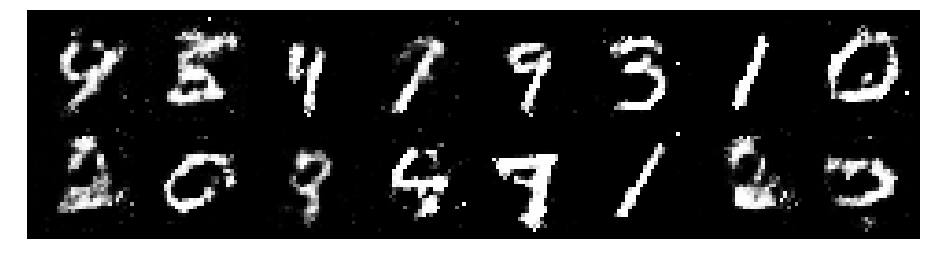

Epoch: [52/200], Batch Num: [500/600]
Discriminator Loss: 1.1467, Generator Loss: 1.1630
D(x): 0.6579, D(G(z)): 0.4231


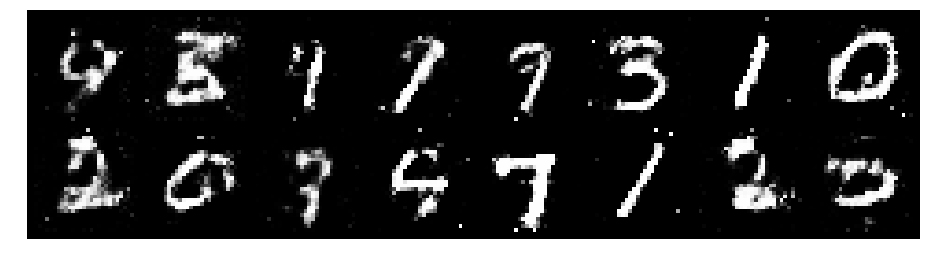

Epoch: [53/200], Batch Num: [0/600]
Discriminator Loss: 1.1513, Generator Loss: 1.0995
D(x): 0.5620, D(G(z)): 0.3664


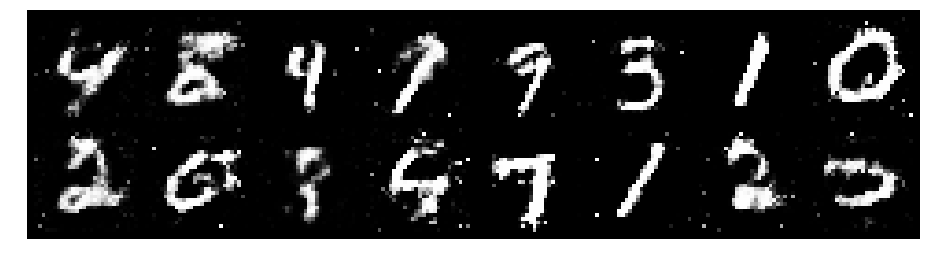

Epoch: [53/200], Batch Num: [100/600]
Discriminator Loss: 1.2445, Generator Loss: 0.9036
D(x): 0.5597, D(G(z)): 0.4176


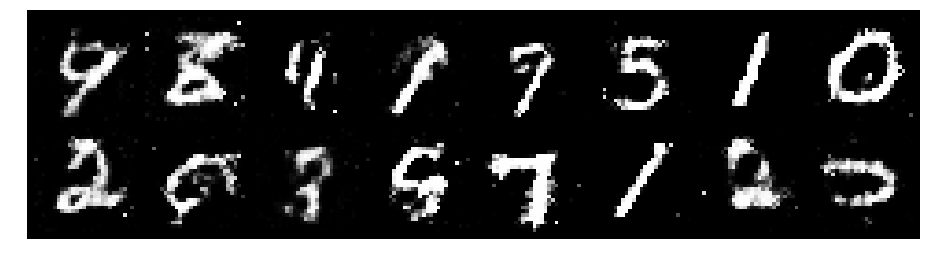

Epoch: [53/200], Batch Num: [200/600]
Discriminator Loss: 1.2693, Generator Loss: 0.8770
D(x): 0.5693, D(G(z)): 0.4314


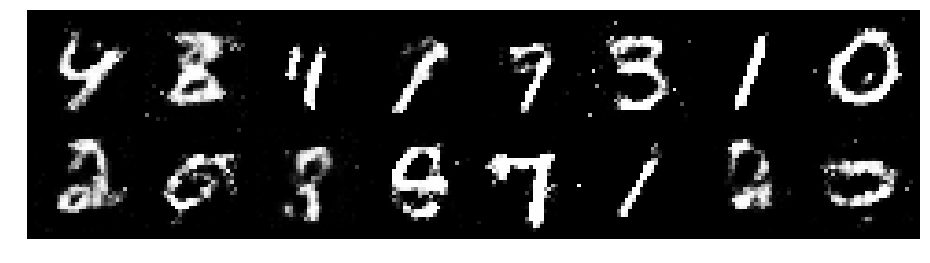

Epoch: [53/200], Batch Num: [300/600]
Discriminator Loss: 1.1928, Generator Loss: 1.0188
D(x): 0.6036, D(G(z)): 0.4116


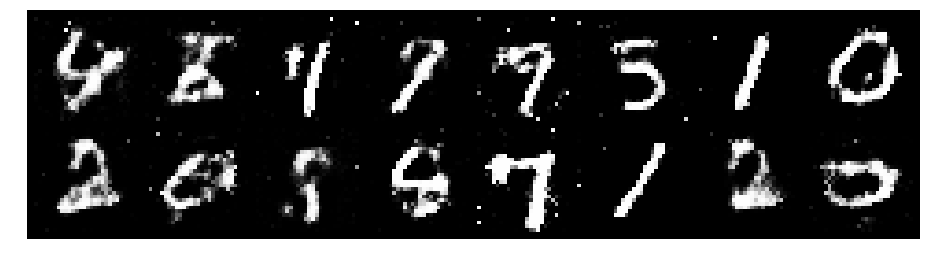

Epoch: [53/200], Batch Num: [400/600]
Discriminator Loss: 1.1015, Generator Loss: 0.9876
D(x): 0.6140, D(G(z)): 0.3743


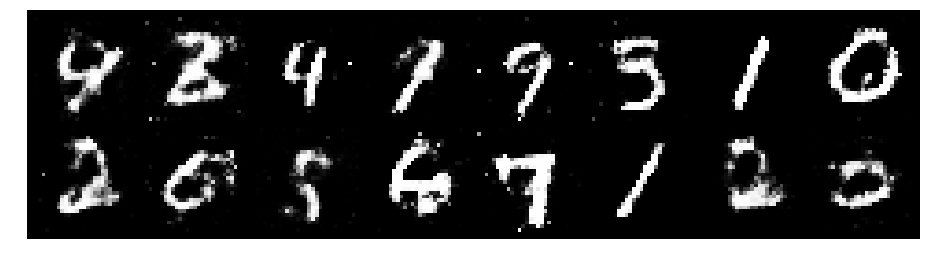

Epoch: [53/200], Batch Num: [500/600]
Discriminator Loss: 1.2713, Generator Loss: 0.8325
D(x): 0.5488, D(G(z)): 0.4499


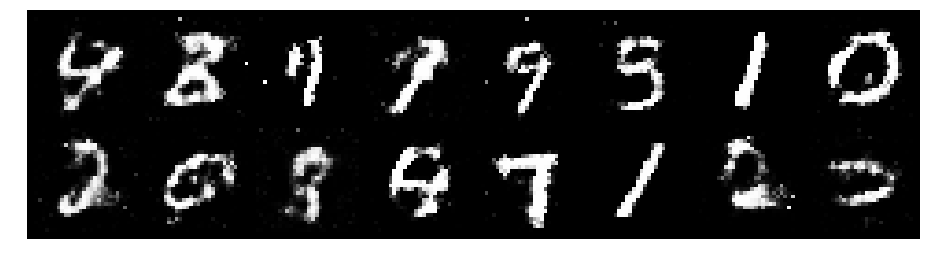

Epoch: [54/200], Batch Num: [0/600]
Discriminator Loss: 1.2791, Generator Loss: 1.0306
D(x): 0.5512, D(G(z)): 0.4313


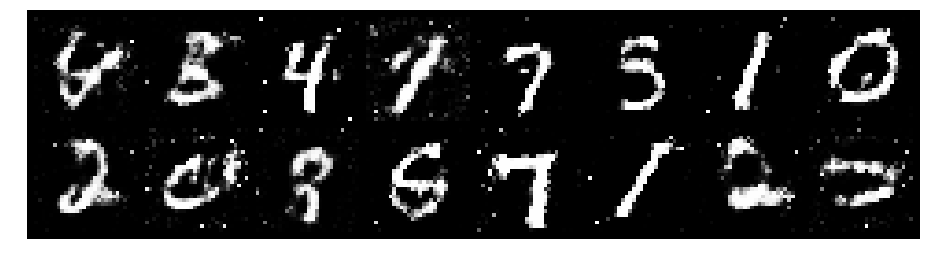

Epoch: [54/200], Batch Num: [100/600]
Discriminator Loss: 1.2649, Generator Loss: 0.9728
D(x): 0.5521, D(G(z)): 0.4476


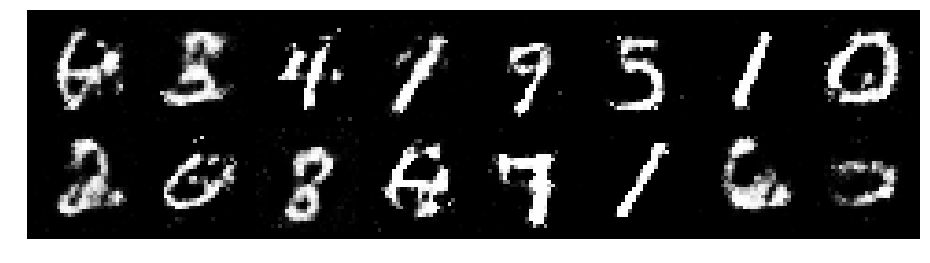

Epoch: [54/200], Batch Num: [200/600]
Discriminator Loss: 1.2403, Generator Loss: 1.0994
D(x): 0.5901, D(G(z)): 0.4424


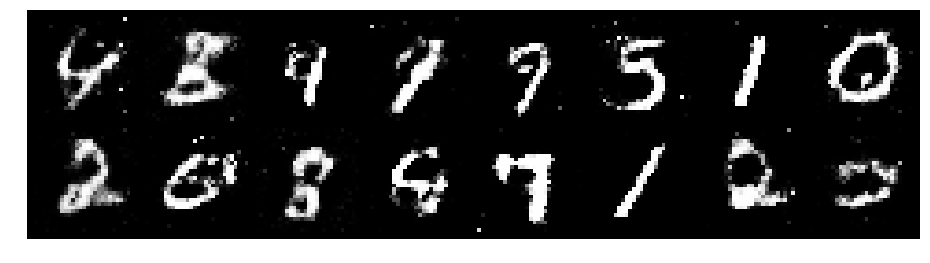

Epoch: [54/200], Batch Num: [300/600]
Discriminator Loss: 1.2435, Generator Loss: 1.0885
D(x): 0.5798, D(G(z)): 0.4122


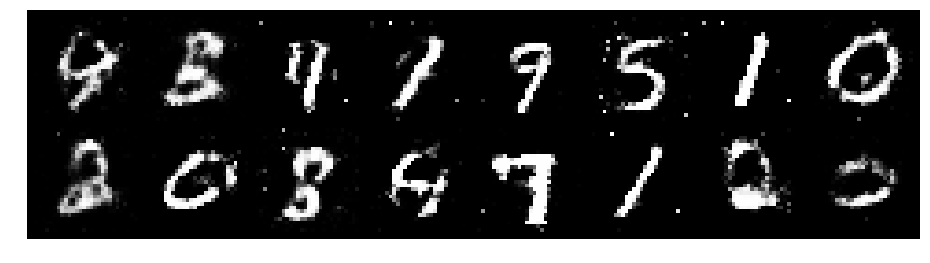

Epoch: [54/200], Batch Num: [400/600]
Discriminator Loss: 1.2399, Generator Loss: 1.0628
D(x): 0.6043, D(G(z)): 0.4201


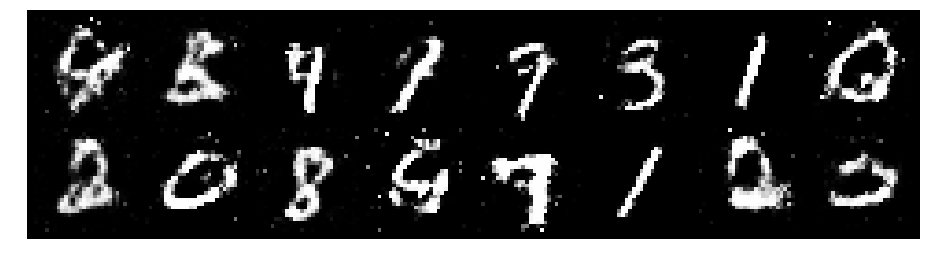

Epoch: [54/200], Batch Num: [500/600]
Discriminator Loss: 1.2530, Generator Loss: 1.1158
D(x): 0.6498, D(G(z)): 0.4711


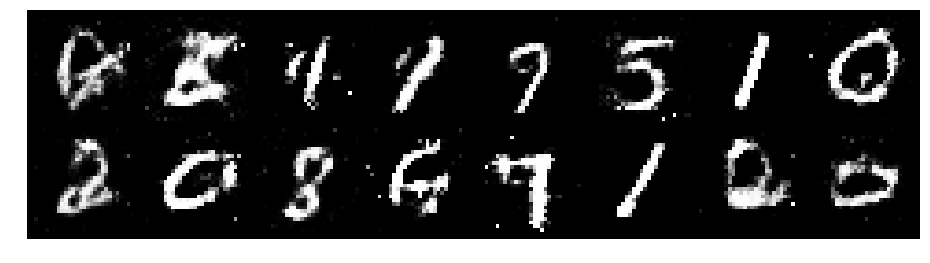

Epoch: [55/200], Batch Num: [0/600]
Discriminator Loss: 1.2113, Generator Loss: 0.9939
D(x): 0.6088, D(G(z)): 0.4589


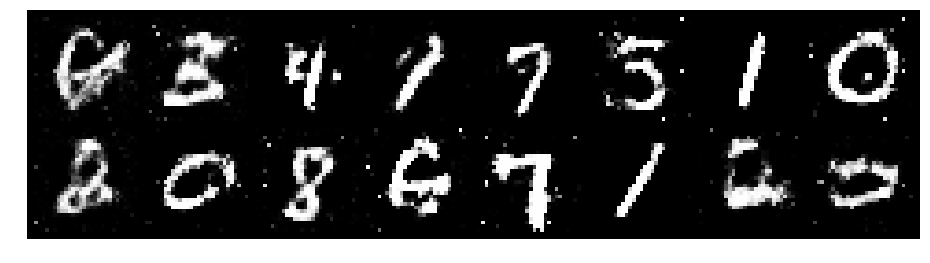

Epoch: [55/200], Batch Num: [100/600]
Discriminator Loss: 1.2429, Generator Loss: 0.9044
D(x): 0.5999, D(G(z)): 0.4483


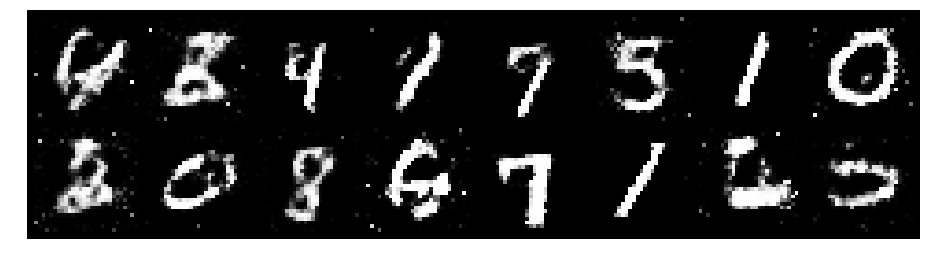

Epoch: [55/200], Batch Num: [200/600]
Discriminator Loss: 1.2746, Generator Loss: 0.9348
D(x): 0.5306, D(G(z)): 0.4241


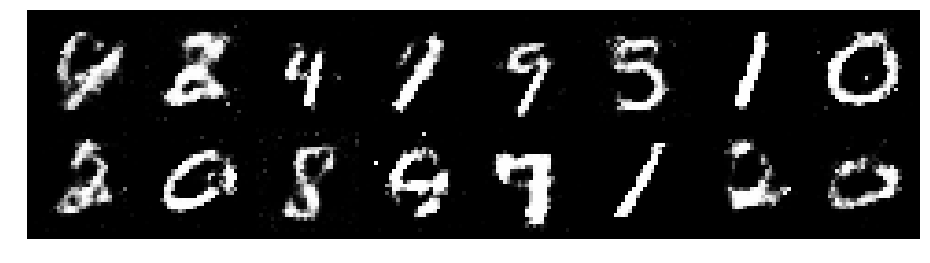

Epoch: [55/200], Batch Num: [300/600]
Discriminator Loss: 1.4037, Generator Loss: 0.9553
D(x): 0.5285, D(G(z)): 0.3961


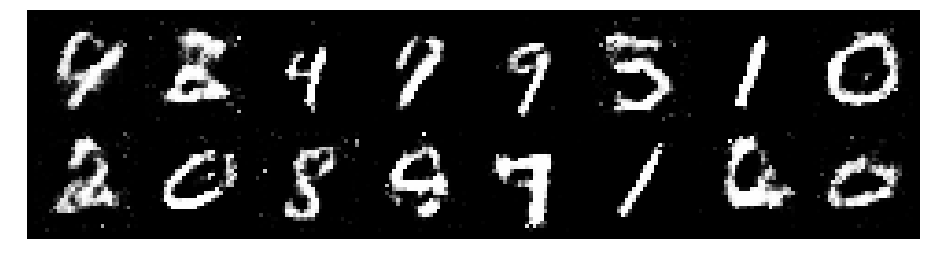

Epoch: [55/200], Batch Num: [400/600]
Discriminator Loss: 1.2801, Generator Loss: 1.0639
D(x): 0.5903, D(G(z)): 0.4336


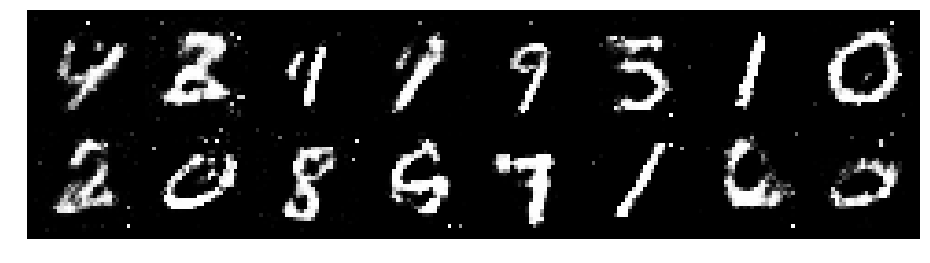

Epoch: [55/200], Batch Num: [500/600]
Discriminator Loss: 1.1182, Generator Loss: 1.0661
D(x): 0.5881, D(G(z)): 0.3806


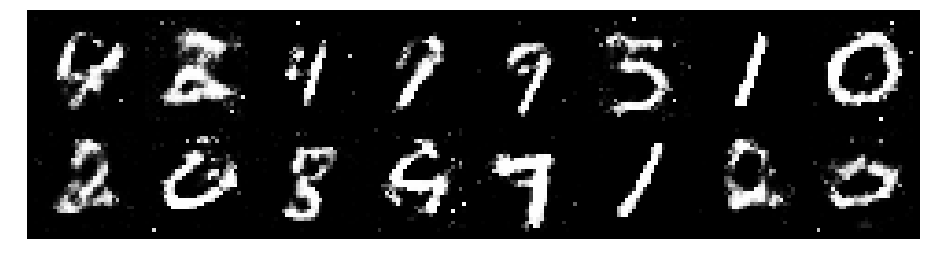

Epoch: [56/200], Batch Num: [0/600]
Discriminator Loss: 1.2359, Generator Loss: 1.0357
D(x): 0.5559, D(G(z)): 0.3997


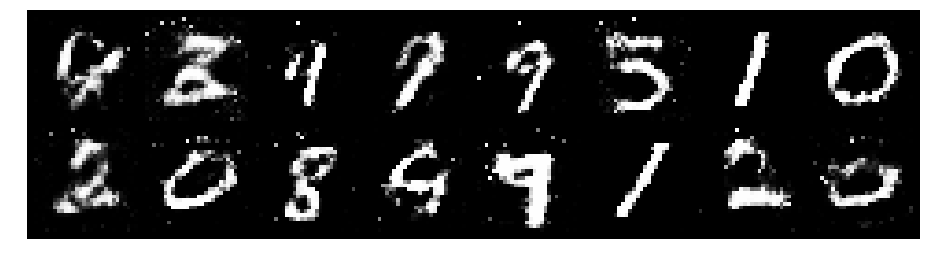

Epoch: [56/200], Batch Num: [100/600]
Discriminator Loss: 1.2276, Generator Loss: 1.0404
D(x): 0.6165, D(G(z)): 0.4558


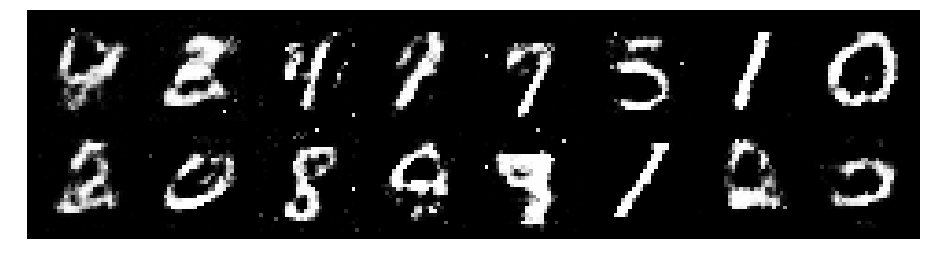

Epoch: [56/200], Batch Num: [200/600]
Discriminator Loss: 1.2031, Generator Loss: 1.1499
D(x): 0.5628, D(G(z)): 0.3700


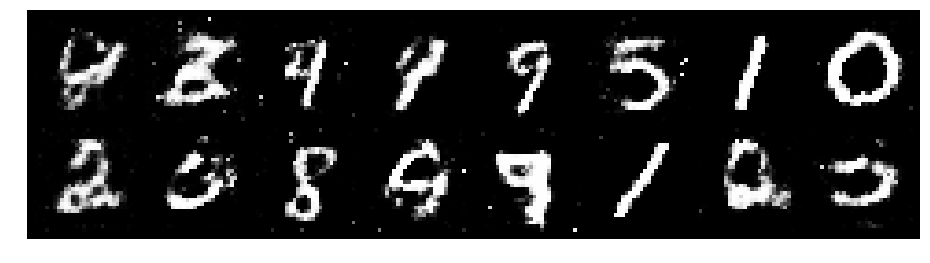

Epoch: [56/200], Batch Num: [300/600]
Discriminator Loss: 1.2388, Generator Loss: 0.9067
D(x): 0.6079, D(G(z)): 0.4589


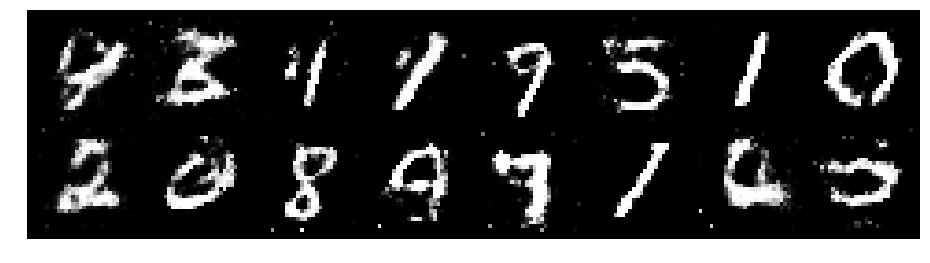

Epoch: [56/200], Batch Num: [400/600]
Discriminator Loss: 1.4144, Generator Loss: 0.9474
D(x): 0.5534, D(G(z)): 0.4710


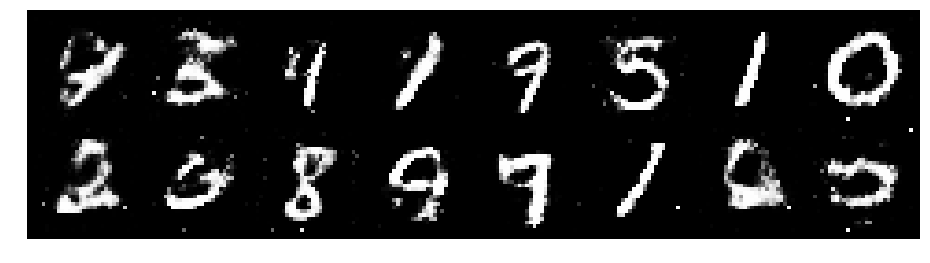

Epoch: [56/200], Batch Num: [500/600]
Discriminator Loss: 1.3701, Generator Loss: 0.9360
D(x): 0.5665, D(G(z)): 0.4517


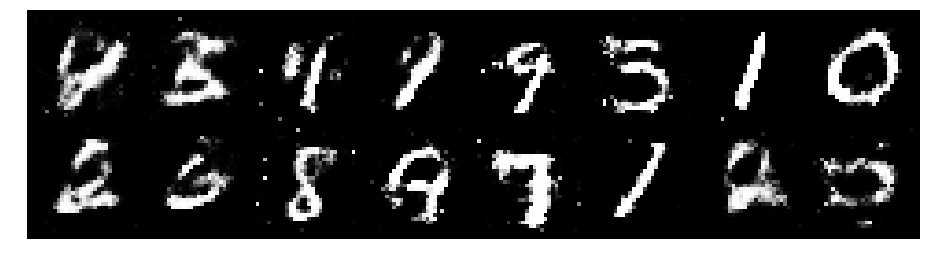

Epoch: [57/200], Batch Num: [0/600]
Discriminator Loss: 1.2155, Generator Loss: 0.8465
D(x): 0.5501, D(G(z)): 0.3928


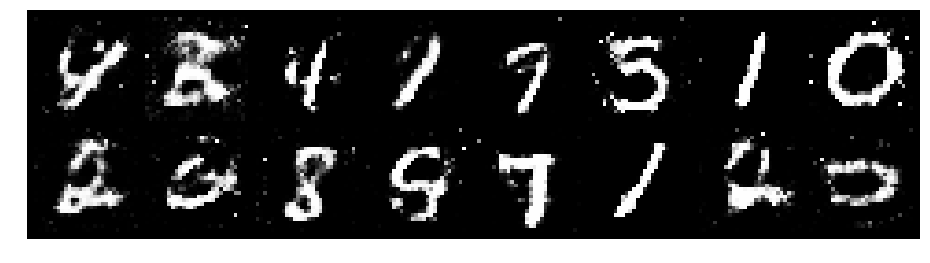

Epoch: [57/200], Batch Num: [100/600]
Discriminator Loss: 1.0994, Generator Loss: 1.0701
D(x): 0.6099, D(G(z)): 0.3907


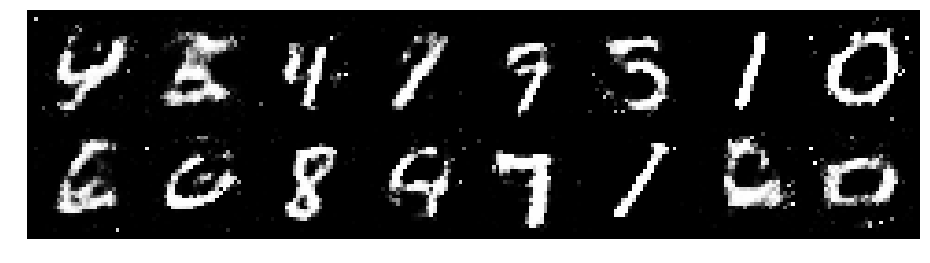

Epoch: [57/200], Batch Num: [200/600]
Discriminator Loss: 1.2249, Generator Loss: 0.8340
D(x): 0.5980, D(G(z)): 0.4419


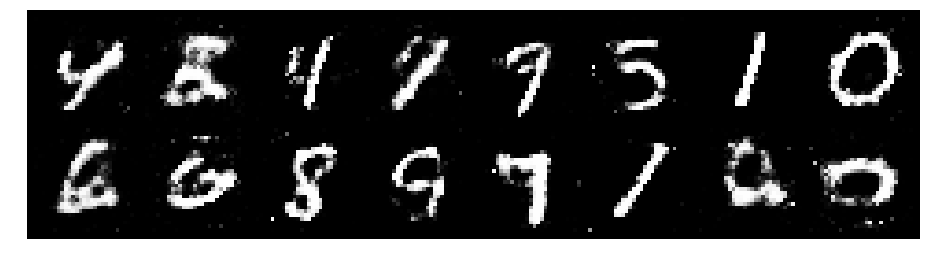

Epoch: [57/200], Batch Num: [300/600]
Discriminator Loss: 1.1297, Generator Loss: 1.0769
D(x): 0.6271, D(G(z)): 0.4209


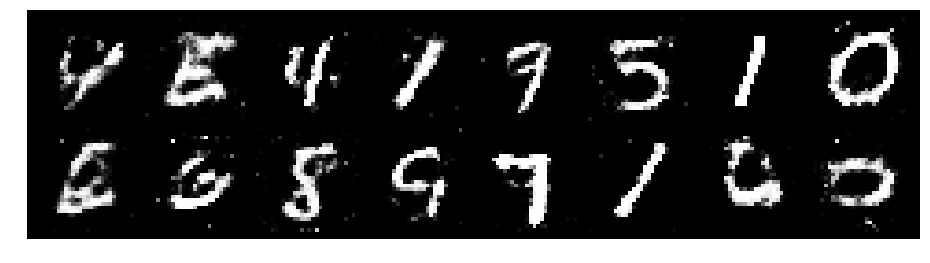

Epoch: [57/200], Batch Num: [400/600]
Discriminator Loss: 1.2180, Generator Loss: 0.9207
D(x): 0.5529, D(G(z)): 0.3802


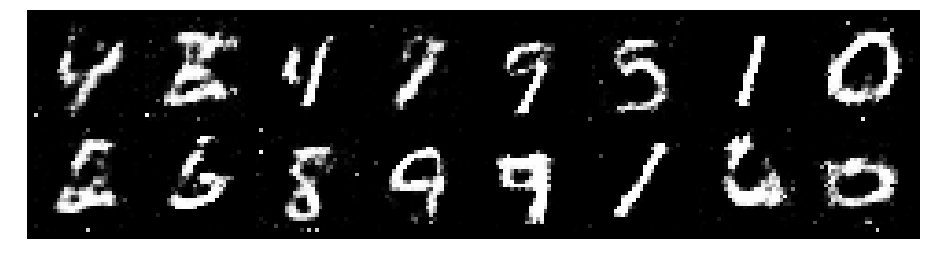

Epoch: [57/200], Batch Num: [500/600]
Discriminator Loss: 1.1133, Generator Loss: 1.0157
D(x): 0.6428, D(G(z)): 0.4201


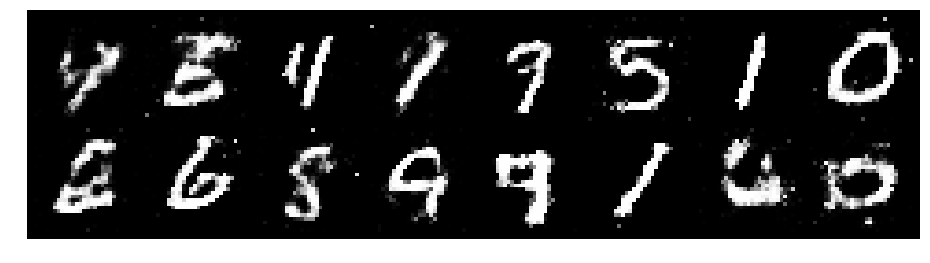

Epoch: [58/200], Batch Num: [0/600]
Discriminator Loss: 1.0290, Generator Loss: 1.0977
D(x): 0.6234, D(G(z)): 0.3405


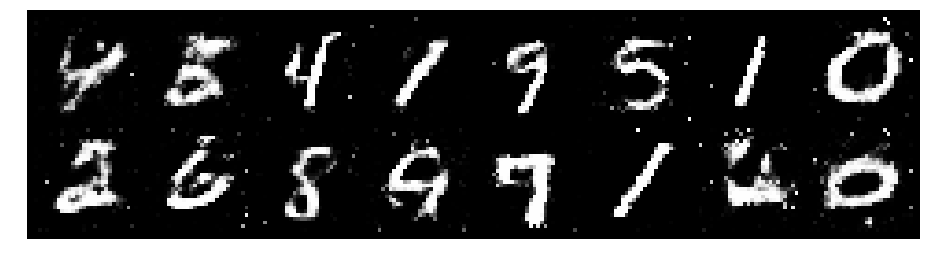

Epoch: [58/200], Batch Num: [100/600]
Discriminator Loss: 1.1126, Generator Loss: 1.0969
D(x): 0.6075, D(G(z)): 0.3608


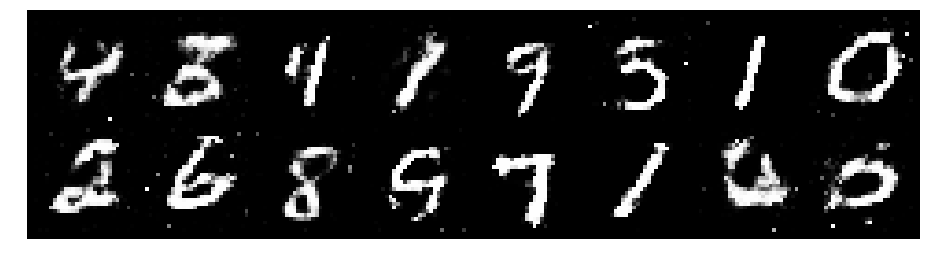

Epoch: [58/200], Batch Num: [200/600]
Discriminator Loss: 1.3307, Generator Loss: 1.0073
D(x): 0.6022, D(G(z)): 0.4614


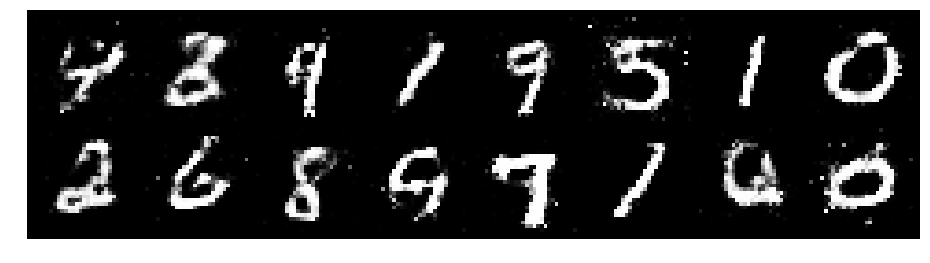

Epoch: [58/200], Batch Num: [300/600]
Discriminator Loss: 1.2196, Generator Loss: 1.1172
D(x): 0.5812, D(G(z)): 0.4355


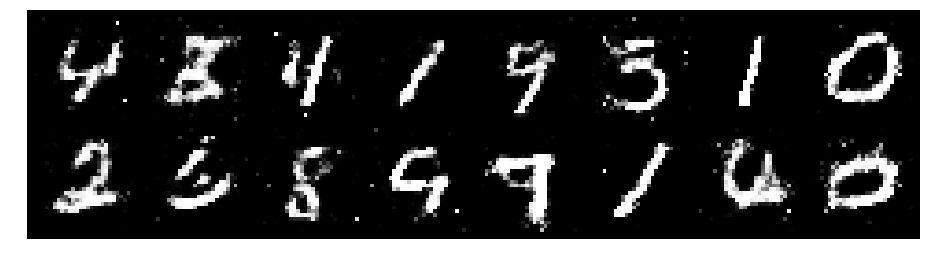

Epoch: [58/200], Batch Num: [400/600]
Discriminator Loss: 1.1770, Generator Loss: 0.9824
D(x): 0.6021, D(G(z)): 0.4279


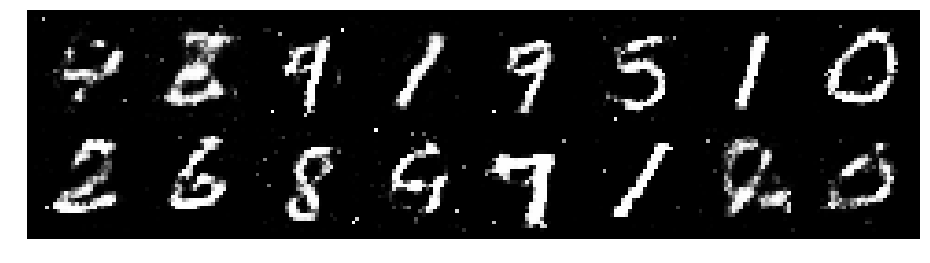

Epoch: [58/200], Batch Num: [500/600]
Discriminator Loss: 1.1899, Generator Loss: 0.9431
D(x): 0.5671, D(G(z)): 0.4139


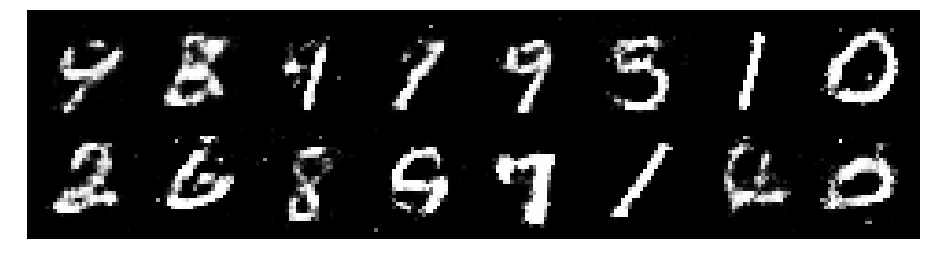

Epoch: [59/200], Batch Num: [0/600]
Discriminator Loss: 1.2882, Generator Loss: 1.0621
D(x): 0.5181, D(G(z)): 0.3833


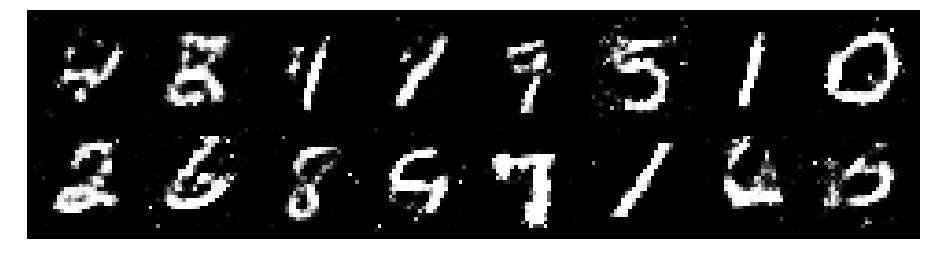

Epoch: [59/200], Batch Num: [100/600]
Discriminator Loss: 1.3227, Generator Loss: 0.8903
D(x): 0.5293, D(G(z)): 0.4049


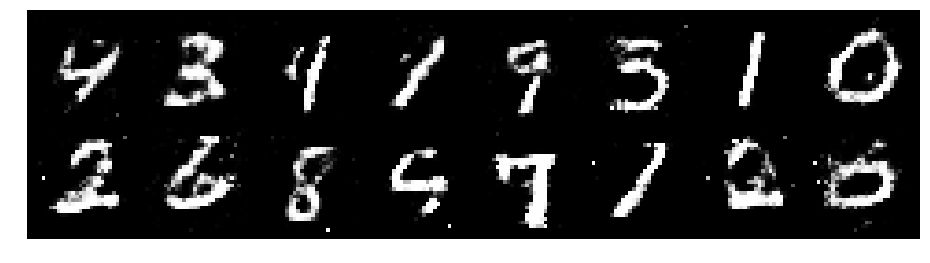

Epoch: [59/200], Batch Num: [200/600]
Discriminator Loss: 1.0667, Generator Loss: 1.0963
D(x): 0.6266, D(G(z)): 0.3624


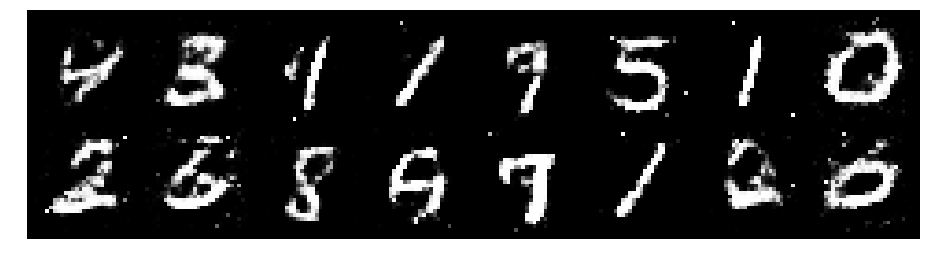

Epoch: [59/200], Batch Num: [300/600]
Discriminator Loss: 1.2438, Generator Loss: 1.0294
D(x): 0.6948, D(G(z)): 0.4796


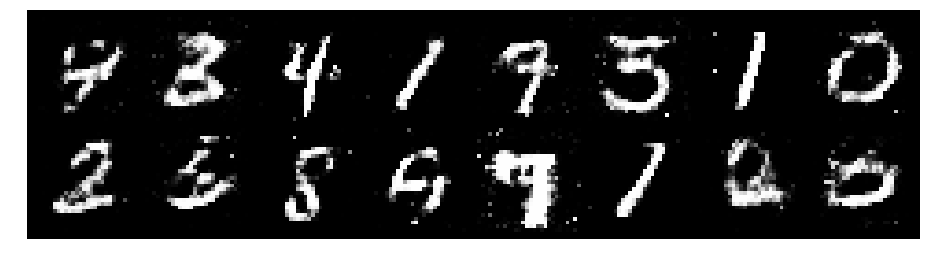

Epoch: [59/200], Batch Num: [400/600]
Discriminator Loss: 1.2538, Generator Loss: 0.9614
D(x): 0.5817, D(G(z)): 0.4396


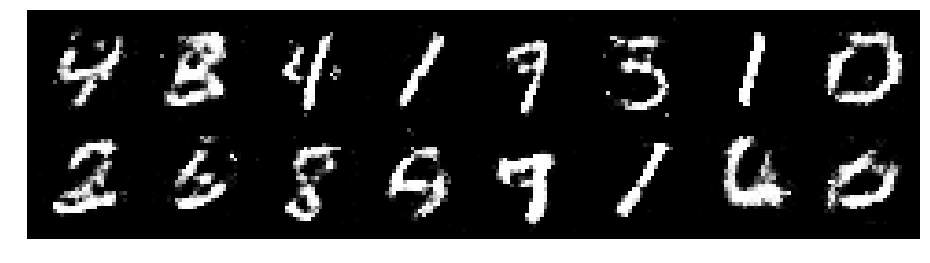

Epoch: [59/200], Batch Num: [500/600]
Discriminator Loss: 1.1083, Generator Loss: 1.0955
D(x): 0.6122, D(G(z)): 0.4044


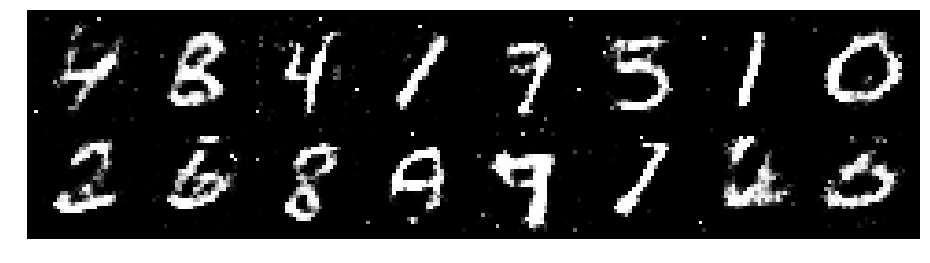

Epoch: [60/200], Batch Num: [0/600]
Discriminator Loss: 1.1615, Generator Loss: 0.9375
D(x): 0.5856, D(G(z)): 0.4136


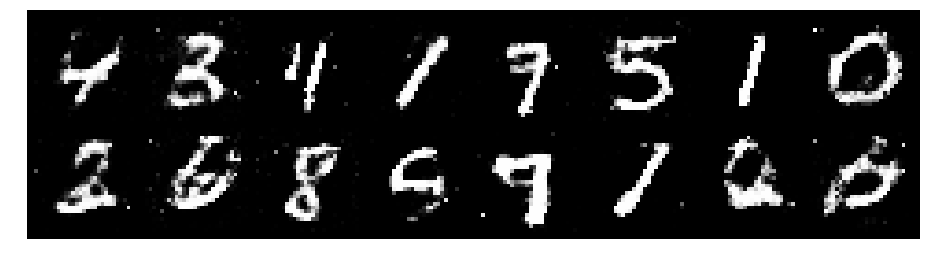

Epoch: [60/200], Batch Num: [100/600]
Discriminator Loss: 1.2678, Generator Loss: 0.9140
D(x): 0.6160, D(G(z)): 0.4833


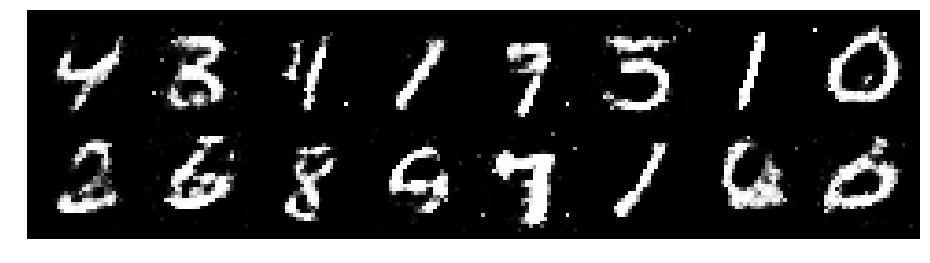

Epoch: [60/200], Batch Num: [200/600]
Discriminator Loss: 1.0289, Generator Loss: 1.2579
D(x): 0.5895, D(G(z)): 0.3173


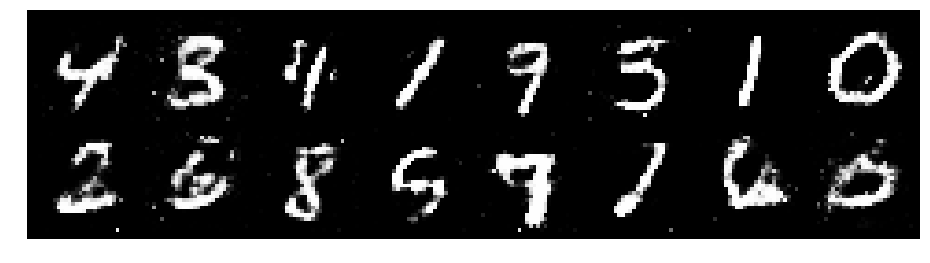

Epoch: [60/200], Batch Num: [300/600]
Discriminator Loss: 1.2887, Generator Loss: 0.9583
D(x): 0.6167, D(G(z)): 0.4643


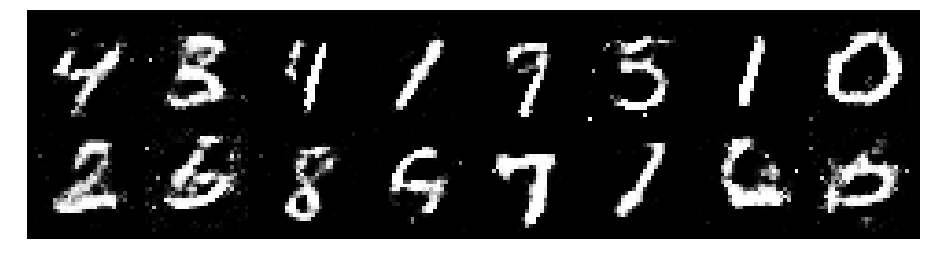

Epoch: [60/200], Batch Num: [400/600]
Discriminator Loss: 1.1771, Generator Loss: 0.9092
D(x): 0.5605, D(G(z)): 0.3979


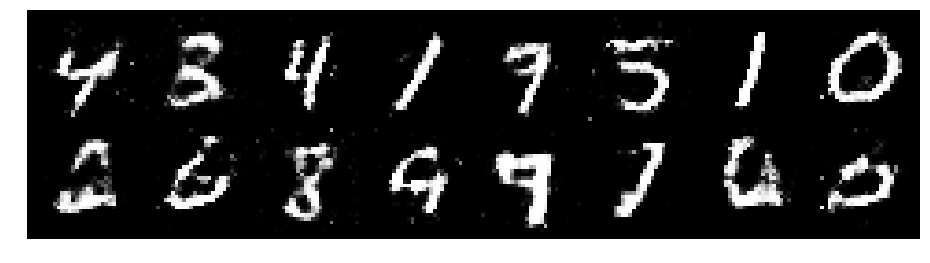

Epoch: [60/200], Batch Num: [500/600]
Discriminator Loss: 1.3103, Generator Loss: 0.9509
D(x): 0.5543, D(G(z)): 0.4291


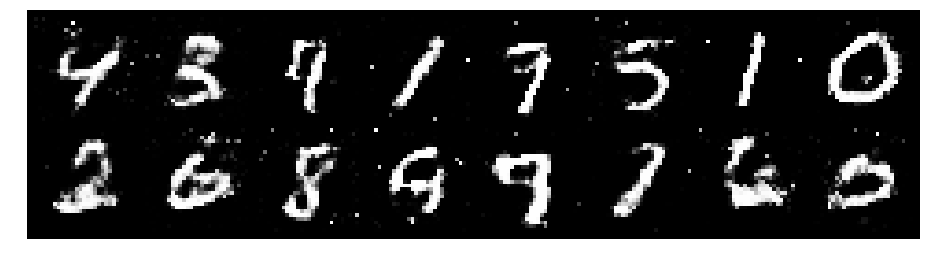

Epoch: [61/200], Batch Num: [0/600]
Discriminator Loss: 1.0627, Generator Loss: 1.2066
D(x): 0.6099, D(G(z)): 0.3483


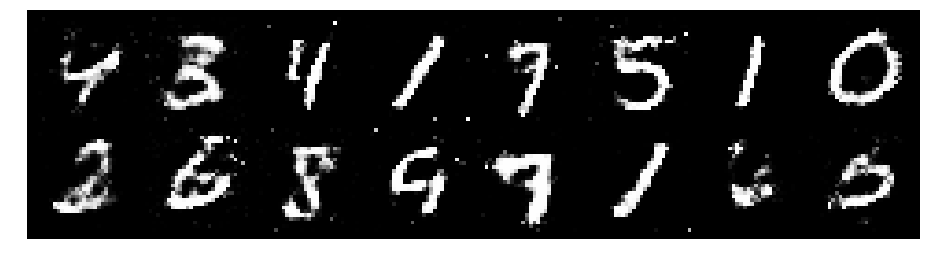

Epoch: [61/200], Batch Num: [100/600]
Discriminator Loss: 1.2346, Generator Loss: 1.0736
D(x): 0.5534, D(G(z)): 0.3999


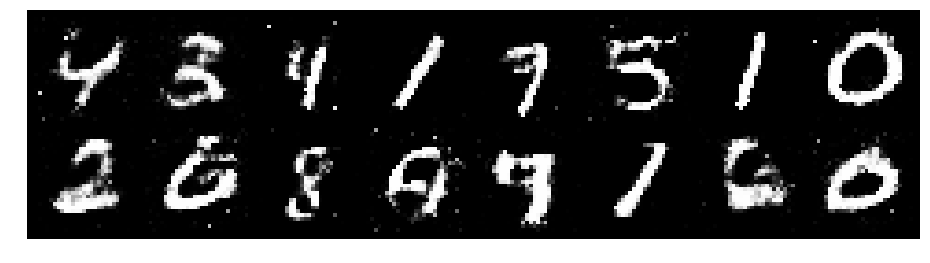

Epoch: [61/200], Batch Num: [200/600]
Discriminator Loss: 1.0765, Generator Loss: 0.9771
D(x): 0.6068, D(G(z)): 0.3909


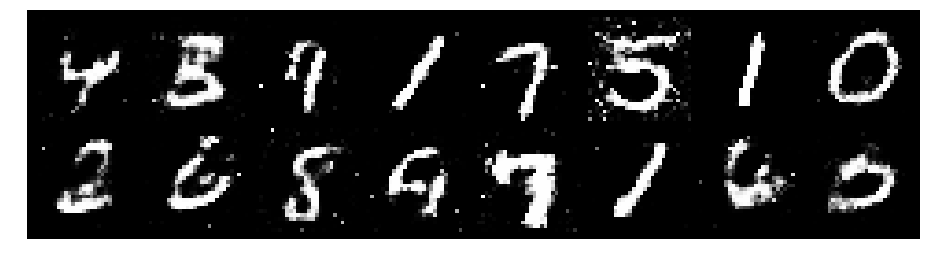

Epoch: [61/200], Batch Num: [300/600]
Discriminator Loss: 1.2478, Generator Loss: 0.9084
D(x): 0.5283, D(G(z)): 0.4048


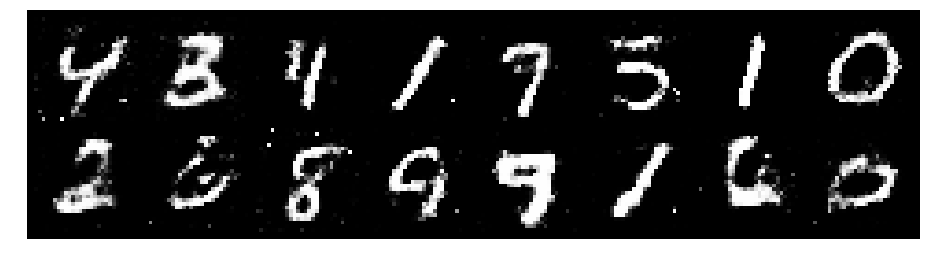

Epoch: [61/200], Batch Num: [400/600]
Discriminator Loss: 1.2208, Generator Loss: 0.8893
D(x): 0.5542, D(G(z)): 0.4208


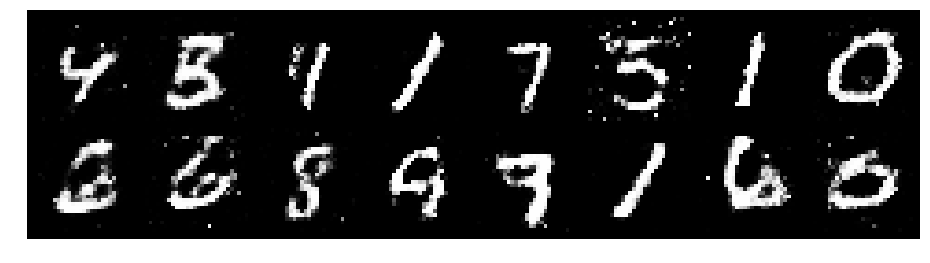

Epoch: [61/200], Batch Num: [500/600]
Discriminator Loss: 1.1161, Generator Loss: 1.0380
D(x): 0.5941, D(G(z)): 0.3994


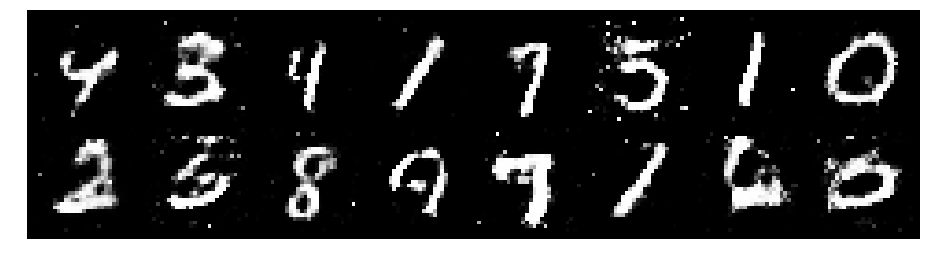

Epoch: [62/200], Batch Num: [0/600]
Discriminator Loss: 1.1554, Generator Loss: 0.7794
D(x): 0.6217, D(G(z)): 0.4434


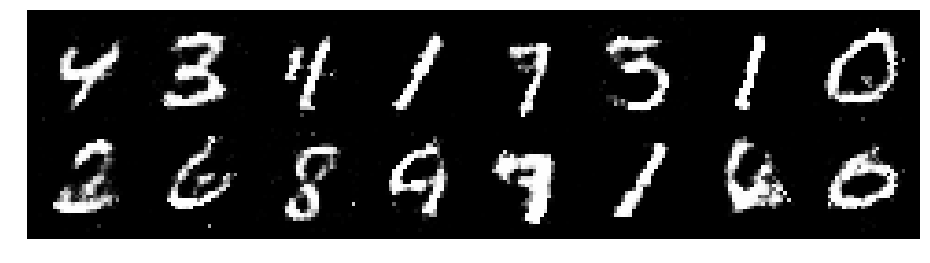

Epoch: [62/200], Batch Num: [100/600]
Discriminator Loss: 1.2512, Generator Loss: 0.9612
D(x): 0.5705, D(G(z)): 0.4327


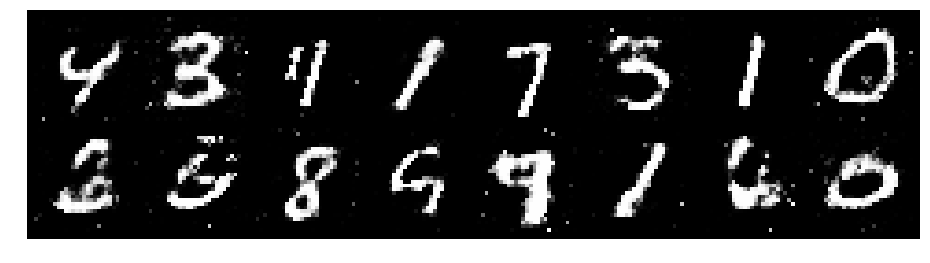

Epoch: [62/200], Batch Num: [200/600]
Discriminator Loss: 1.2652, Generator Loss: 1.0461
D(x): 0.5146, D(G(z)): 0.3930


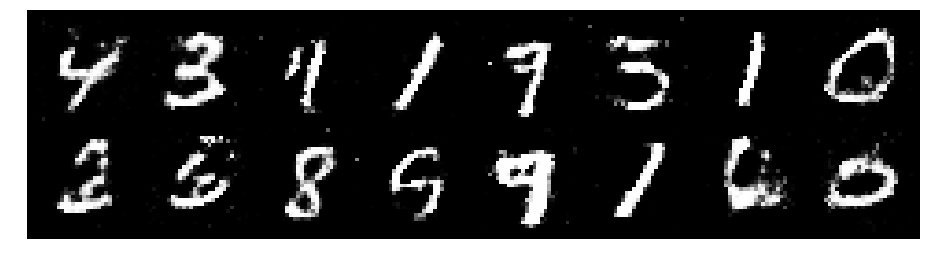

Epoch: [62/200], Batch Num: [300/600]
Discriminator Loss: 1.3362, Generator Loss: 0.9211
D(x): 0.5800, D(G(z)): 0.4572


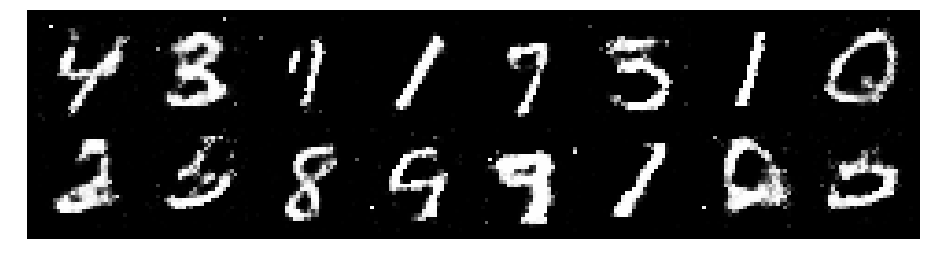

Epoch: [62/200], Batch Num: [400/600]
Discriminator Loss: 1.3784, Generator Loss: 0.8227
D(x): 0.6129, D(G(z)): 0.5078


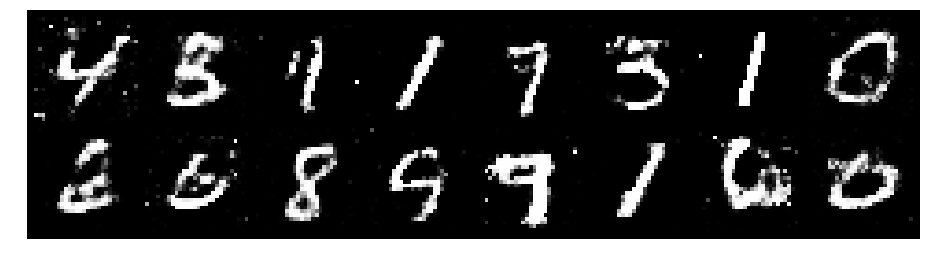

Epoch: [62/200], Batch Num: [500/600]
Discriminator Loss: 1.1784, Generator Loss: 1.2066
D(x): 0.5866, D(G(z)): 0.3724


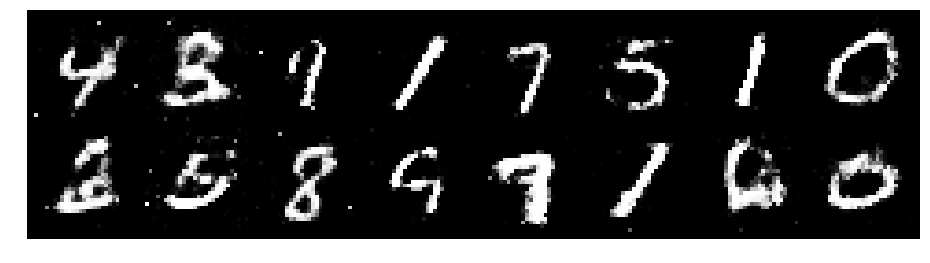

Epoch: [63/200], Batch Num: [0/600]
Discriminator Loss: 1.0946, Generator Loss: 1.2241
D(x): 0.6352, D(G(z)): 0.3852


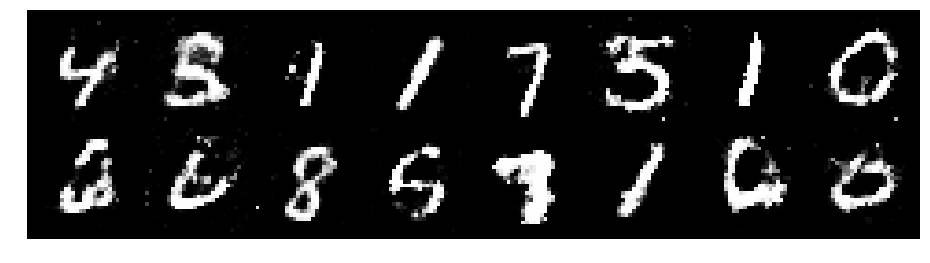

Epoch: [63/200], Batch Num: [100/600]
Discriminator Loss: 1.3054, Generator Loss: 0.9595
D(x): 0.5829, D(G(z)): 0.4537


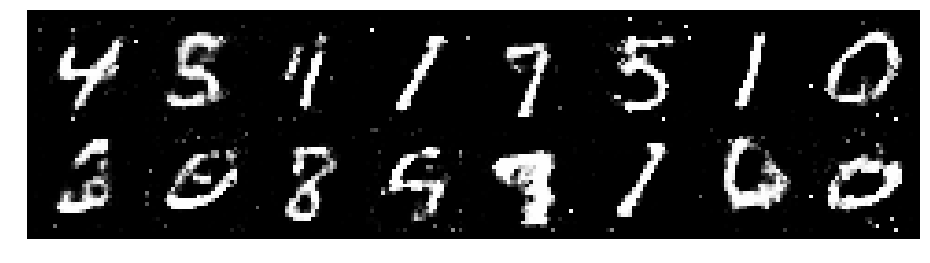

Epoch: [63/200], Batch Num: [200/600]
Discriminator Loss: 1.2129, Generator Loss: 1.0057
D(x): 0.6014, D(G(z)): 0.4293


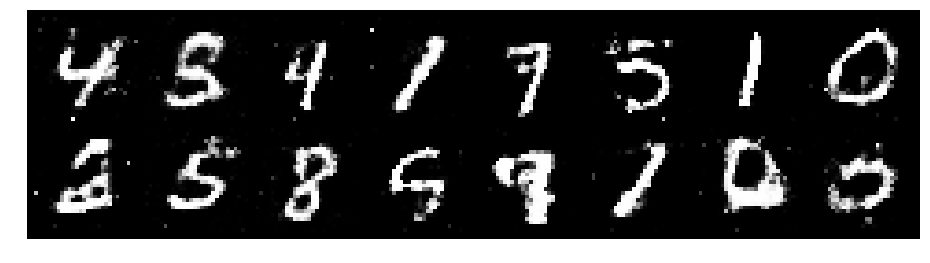

Epoch: [63/200], Batch Num: [300/600]
Discriminator Loss: 1.1627, Generator Loss: 1.0702
D(x): 0.5584, D(G(z)): 0.3849


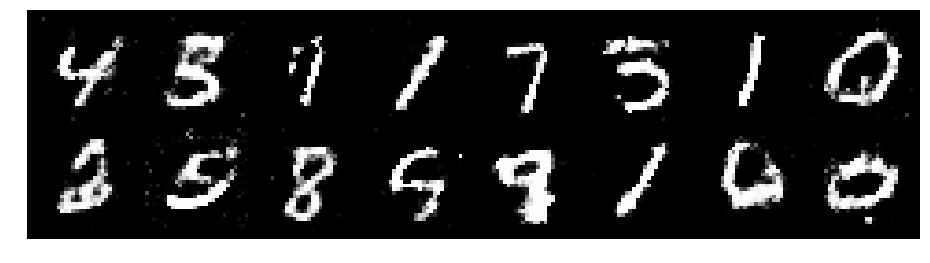

Epoch: [63/200], Batch Num: [400/600]
Discriminator Loss: 1.2557, Generator Loss: 0.9673
D(x): 0.5619, D(G(z)): 0.4322


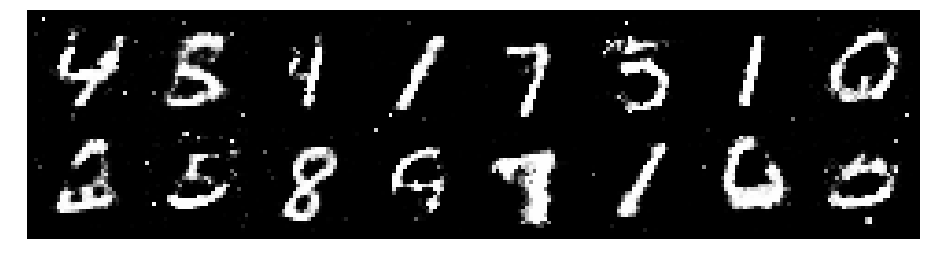

Epoch: [63/200], Batch Num: [500/600]
Discriminator Loss: 1.0983, Generator Loss: 1.0532
D(x): 0.6047, D(G(z)): 0.3935


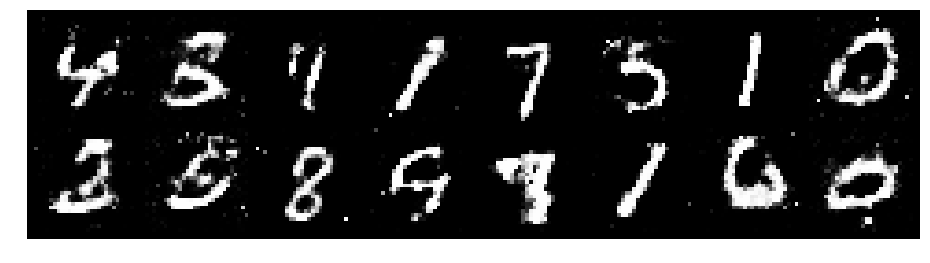

Epoch: [64/200], Batch Num: [0/600]
Discriminator Loss: 1.0437, Generator Loss: 0.9613
D(x): 0.6122, D(G(z)): 0.3522


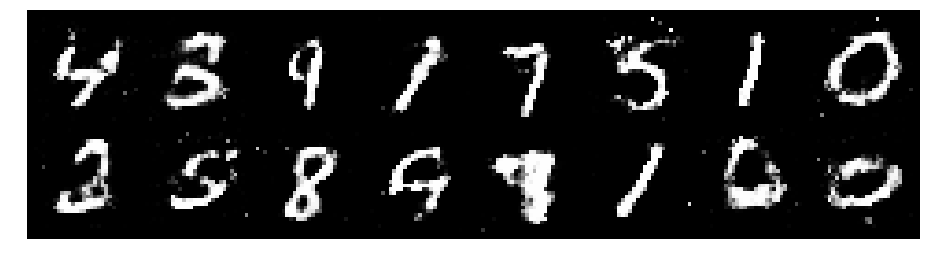

Epoch: [64/200], Batch Num: [100/600]
Discriminator Loss: 1.2199, Generator Loss: 0.9159
D(x): 0.5406, D(G(z)): 0.3875


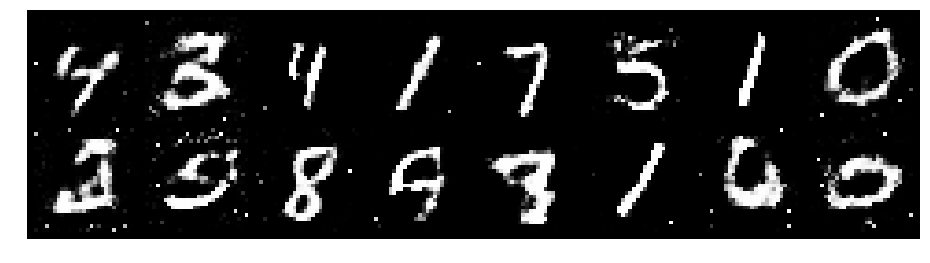

Epoch: [64/200], Batch Num: [200/600]
Discriminator Loss: 1.1808, Generator Loss: 1.0563
D(x): 0.5569, D(G(z)): 0.3829


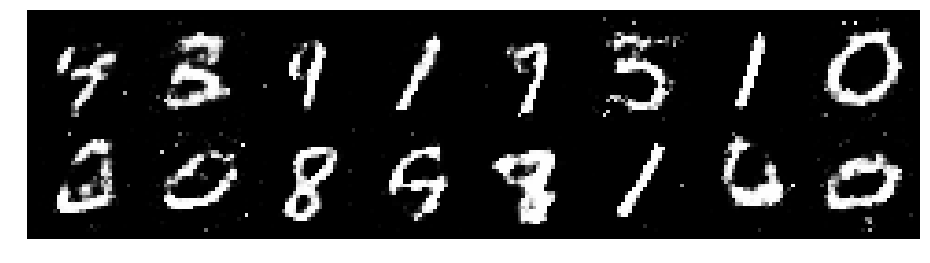

Epoch: [64/200], Batch Num: [300/600]
Discriminator Loss: 1.3751, Generator Loss: 1.0561
D(x): 0.5257, D(G(z)): 0.4319


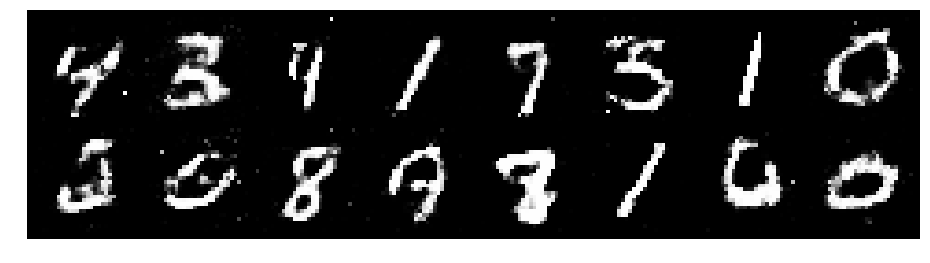

Epoch: [64/200], Batch Num: [400/600]
Discriminator Loss: 1.3397, Generator Loss: 0.8254
D(x): 0.5665, D(G(z)): 0.4605


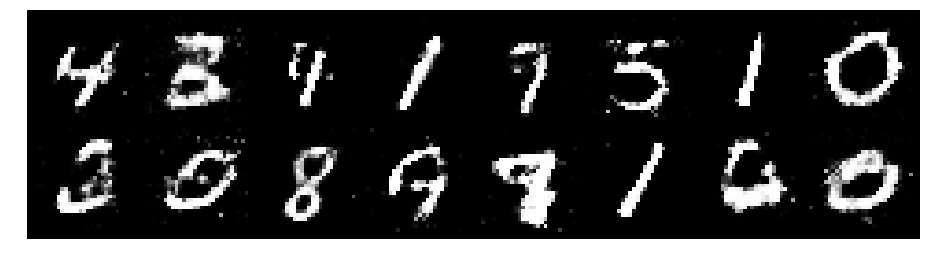

Epoch: [64/200], Batch Num: [500/600]
Discriminator Loss: 1.2393, Generator Loss: 0.9831
D(x): 0.5489, D(G(z)): 0.4074


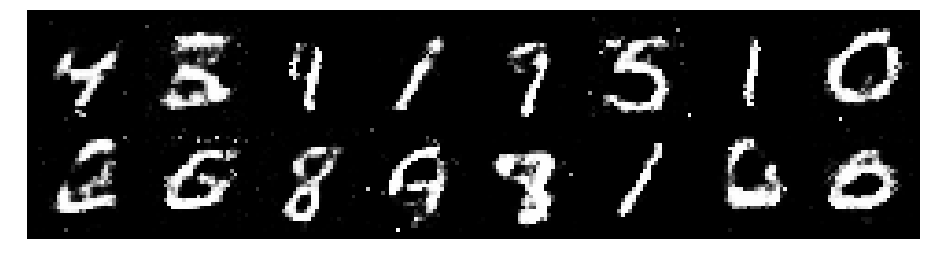

Epoch: [65/200], Batch Num: [0/600]
Discriminator Loss: 1.2668, Generator Loss: 0.8013
D(x): 0.5538, D(G(z)): 0.4491


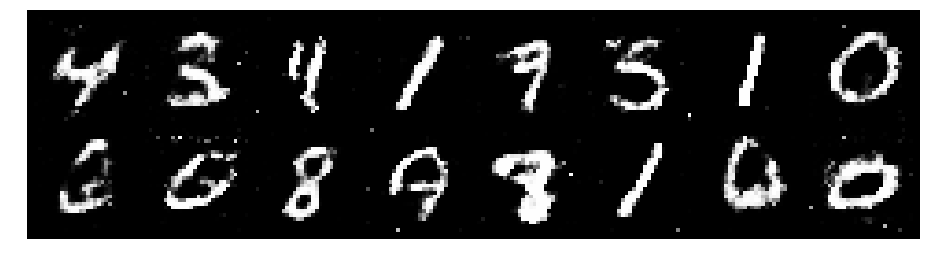

Epoch: [65/200], Batch Num: [100/600]
Discriminator Loss: 1.3414, Generator Loss: 0.9401
D(x): 0.5127, D(G(z)): 0.4150


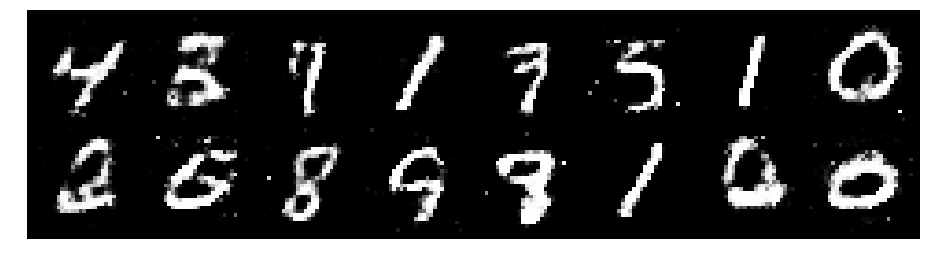

Epoch: [65/200], Batch Num: [200/600]
Discriminator Loss: 1.2962, Generator Loss: 0.8610
D(x): 0.5819, D(G(z)): 0.4659


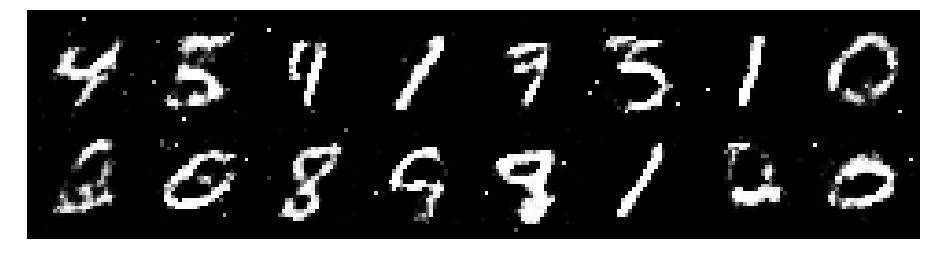

Epoch: [65/200], Batch Num: [300/600]
Discriminator Loss: 1.2569, Generator Loss: 0.9550
D(x): 0.5149, D(G(z)): 0.4162


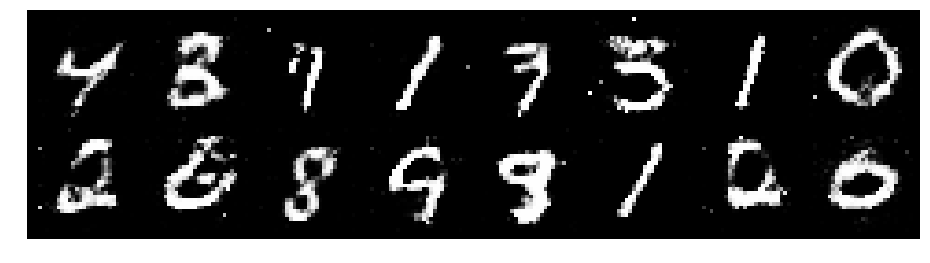

Epoch: [65/200], Batch Num: [400/600]
Discriminator Loss: 1.3726, Generator Loss: 0.9228
D(x): 0.5723, D(G(z)): 0.4795


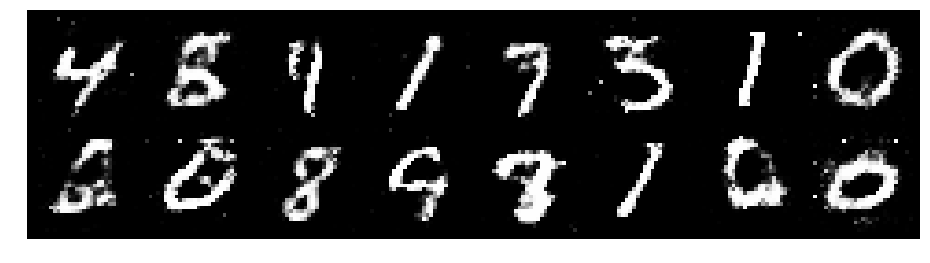

Epoch: [65/200], Batch Num: [500/600]
Discriminator Loss: 1.1128, Generator Loss: 1.0797
D(x): 0.6414, D(G(z)): 0.4223


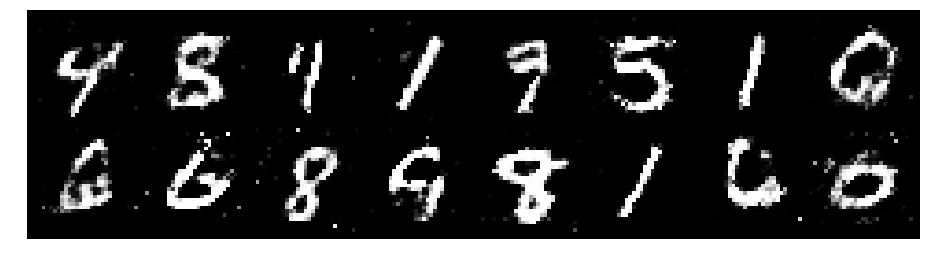

Epoch: [66/200], Batch Num: [0/600]
Discriminator Loss: 1.2121, Generator Loss: 1.0511
D(x): 0.5806, D(G(z)): 0.4080


KeyboardInterrupt: 

In [41]:
# Creating Logger instance

logger = Logger(model_name = "VGAN",data_name = "MNIST")

# Total number of epochs
num_epochs = 200

for epoch in range(num_epochs):
    for n_batch, (real_batch,_) in enumerate(data_loader):
        
        N = real_batch.size(0)
        
        # Training Discriminator
        real_data = Variable(images_to_vectors(real_batch))
        
        # Generate fake data and detach
        # So no gradients are calculated for generator
        fake_data = generator(noise(N)).detach()
        
        d_error,d_pred_real,d_pred_fake = train_discriminator(d_optimizer,real_data,fake_data)
        
        # Training Generator
        fake_data = generator(noise(N))
        
        g_error = train_generator(g_optimizer,fake_data)
        
        logger.log(d_error,g_error,epoch,n_batch,num_batches)
        
        if (n_batch) % 100 == 0: 
            test_images = vectors_to_images(generator(test_noise))
            test_images = test_images.data
            logger.log_images(
                test_images, num_test_samples, 
                epoch, n_batch, num_batches
            );
            
            # Display status Logs
            logger.display_status(
                epoch, num_epochs, n_batch, num_batches,
                d_error, g_error, d_pred_real, d_pred_fake
            )